In [3]:
import numpy as np
import pandas as pd
import scanpy
import anndata as ad

import seaborn as sns; sns.set(color_codes=True); sns.set_style("whitegrid"); 
from matplotlib import pyplot as plt
plt.rcParams["axes.grid"] = False

import networkx as nx
from scipy.spatial import Delaunay
import copy

import sys
sys.path.append('./SpatialCells')
import spatialcells as spc
import glob

from scipy.stats import linregress

### data pre-processing (splitting sections and selecting only VGP regions for analysis)

In [154]:
adata = scanpy.read_h5ad('/Users/ediknovik/Dropbox/Harvard-University/Sorger-HMS-Postdoc/PCA-Melanoma-Analysis/data/merged_e41_stage2/tumor_subsetMERGED_V3.h5ad')
adata

AnnData object with n_obs × n_vars = 2039509 × 16
    obs: 'X_centroid', 'Y_centroid', 'Area', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity', 'Solidity', 'Extent', 'Orientation', 'CellID', 'imageid', 'batch', 'LOSE', 'phenotype', 'MART1pos', 'SOX9pos', 'PRAMEpos', 'NGFRpos', 'MEL_id', 'Breslow', 'TIL', 'sun_damage', 'S100A1pos', 'Ki67pos', 'ROI_major_category'
    layers: 'log', 'rescaled'

In [155]:
adata_vgp = adata[adata.obs.ROI_major_category == 'VGP']

In [145]:
adata_vgp_imageid_list = adata_vgp.obs.imageid.unique().tolist()

In [146]:
def split_two_tissue_slices(adata, patient, gate, X_centroid_gate=None, Y_centroid_gate=None):
    if X_centroid_gate and Y_centroid_gate:
        raise ValueError("Please supply only one axis to gate on.")
    patient_condition = adata.obs.imageid == patient
    meta = adata.obs.copy() # convert to pandas df
    meta['imageid'] = meta['imageid'].astype(str) # convert elements from Categorical to str
    
    if X_centroid_gate:
        gate_condition = adata.obs.X_centroid > gate
        condition = patient_condition & gate_condition
        meta.loc[meta[condition].index, 'imageid'] = f'{patient}_right'

        gate_condition = adata.obs.X_centroid < gate
        condition = patient_condition & gate_condition
        meta.loc[meta[condition].index, 'imageid'] = f'{patient}_left'
    elif Y_centroid_gate:
        gate_condition = adata.obs.Y_centroid > gate
        condition = patient_condition & gate_condition
        meta.loc[meta[condition].index, 'imageid'] = f'{patient}_upper'

        gate_condition = adata.obs.Y_centroid < gate
        condition = patient_condition & gate_condition
        meta.loc[meta[condition].index, 'imageid'] = f'{patient}_lower'
    
    meta['imageid'] = meta['imageid'].astype('category')
    adata.obs = meta.copy()

    return adata

Patient ID: LSP15219_a


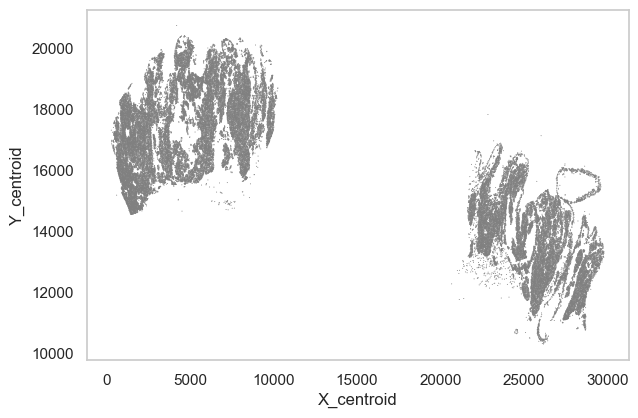

In [157]:
# Manual visualization - per patient
patient = 'LSP15219_a'
data = adata_vgp[adata_vgp.obs.imageid == patient]
print(f'Patient ID: {patient}')
scanpy.pl.scatter(data,x='X_centroid',y='Y_centroid', show=False)
ax = plt.gca()
# ax.axhline(y=15000, color='k', linestyle='--') # use this value to gate
# ax.axvline(x=15000, color='k', linestyle='--') # use this value to gate

In [149]:
# comments indicate which lesions to exclude from analysis
full_disjoint_tissue_samples_dict = {
                                        'LSP11354': (12000, 'Y_centroid_gate'),
                                        'LSP11402': (18000, 'Y_centroid_gate'),
                                        'LSP11530': (18000, 'X_centroid_gate'),
                                        'LSP11634': (20000, 'Y_centroid_gate'),  # remove bottom
                                        'LSP11706': (18000, 'Y_centroid_gate'),
                                        'LSP11778': (18000, 'Y_centroid_gate'), # remove top
                                        'LSP11618': (18000, 'Y_centroid_gate'), # remove bottom
                                        'LSP11658': (23000, 'Y_centroid_gate'),
                                        'LSP11698': (21000, 'Y_centroid_gate'),
                                        'LSP15120': (27000, 'Y_centroid_gate'),
                                        'LSP15129': (30000, 'X_centroid_gate'),
                                        'LSP15192': (38000, 'X_centroid_gate'),
                                        'LSP17170': (20000, 'Y_centroid_gate'), # remove top
                                        'LSP15219_a': (15000, 'X_centroid_gate'),
                                        'LSP15219_b': (15000, 'Y_centroid_gate'),
                                    }

In [150]:
adata_vgp.obs['imageid_raw'] = adata_vgp.obs['imageid'].copy()

for patient, values in full_disjoint_tissue_samples_dict.items():
    if len(values) == 0:
        continue
    else:
        gate = values[0]
        if values[1] == 'X_centroid_gate':
            adata_vgp = split_two_tissue_slices(adata_vgp, patient, gate, X_centroid_gate=True)
        elif values[1] == 'Y_centroid_gate':
            adata_vgp = split_two_tissue_slices(adata_vgp, patient, gate, Y_centroid_gate=True)

patient_ids = adata_vgp.obs.imageid.unique().tolist()
print(patient_ids, end='')

/var/folders/4r/9bf8dywn1zb4b4pykp3mrbpm0000gn/T/ipykernel_41393/615988078.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_vgp.obs['imageid_raw'] = adata_vgp.obs['imageid'].copy()


['LSP11314', 'LSP11349', 'LSP11354_lower', 'LSP11354_upper', 'LSP11402_lower', 'LSP11402_upper', 'LSP11410', 'LSP11530_left', 'LSP11530_right', 'LSP11562', 'LSP11634_lower', 'LSP11634_upper', 'LSP11706_lower', 'LSP11706_upper', 'LSP11778_lower', 'LSP11778_upper', 'LSP11786', 'LSP11373', 'LSP11618_lower', 'LSP11618_upper', 'LSP11642', 'LSP11658_lower', 'LSP11658_upper', 'LSP11698_lower', 'LSP11698_upper', 'LSP11418', 'LSP17170_lower', 'LSP17170_upper', 'LSP13102', 'LSP15156', 'LSP13078', 'LSP13186', 'LSP15120_lower', 'LSP15120_upper', 'LSP15138', 'LSP15210', 'LSP15219_b_lower', 'LSP15183', 'LSP15129_right', 'LSP15129_left', 'LSP13179', 'LSP15219_a_right', 'LSP15219_a_left', 'LSP15219_b_upper', 'LSP15192_right', 'LSP15192_left']

In [151]:
for patient in ['LSP11634_lower', 'LSP11778_upper', 'LSP11618_lower', 'LSP17170_upper']:
    adata_vgp = adata_vgp[adata_vgp.obs['imageid'] != patient]

In [152]:
adata_vgp.write_h5ad(filename='/Users/ediknovik/Dropbox/Harvard-University/Sorger-HMS-Postdoc/PCA-Melanoma-Analysis/data/merged_e41_stage2/tumor_subsetMERGED_V4_VGP_only_split_regions.h5ad')

### MART1 intensity analysis along Breslow depth

In [3]:
adata = scanpy.read_h5ad('/Users/ediknovik/Dropbox/Harvard-University/Sorger-HMS-Postdoc/PCA-Melanoma-Analysis/data/merged_e41_stage2/tumor_subsetMERGED_V4_VGP_only_split_regions.h5ad')
adata

AnnData object with n_obs × n_vars = 1710436 × 16
    obs: 'X_centroid', 'Y_centroid', 'Area', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity', 'Solidity', 'Extent', 'Orientation', 'CellID', 'imageid', 'batch', 'LOSE', 'phenotype', 'MART1pos', 'SOX9pos', 'PRAMEpos', 'NGFRpos', 'MEL_id', 'Breslow', 'TIL', 'sun_damage', 'S100A1pos', 'Ki67pos', 'ROI_major_category', 'imageid_raw'
    layers: 'log', 'rescaled'

In [159]:
adata[adata.obs.MEL_id == 'MEL85'].obs.ROI_major_category.value_counts()

VGP    24240
Name: ROI_major_category, dtype: int64

In [160]:
e41_roi_list = glob.glob("/Users/ediknovik/Dropbox/Harvard-University/Sorger-HMS-Postdoc/PCA-Melanoma-Analysis/data/experiment_41_data/epidermal_ROIs/*.csv")
stage2_roi_list = glob.glob("/Users/ediknovik/Dropbox/Harvard-University/Sorger-HMS-Postdoc/PCA-Melanoma-Analysis/data/pca_stage2_samples/stage_2_epidermis_roi/*.csv")
roi_list = e41_roi_list + stage2_roi_list

In [ ]:
# LSP15201 does not have an epidermal ROI (stage2)
# These 2 samples do not have epidermal ROIs: LSP11418, LSP17170 (e41)

In [170]:
def mean_marker_intensity_per_distance_band(data, patient_name, marker_name='MART1', regression=True):
    #data = data[data.obs.ROI != 'Other']

    distance_band_array = data.obs.distance_from_roi_binned.unique()
    distance_band_array = distance_band_array.dropna()
    distance_band_list = distance_band_array.tolist()
    # print(distance_band_list)
    marker_band_dict = {}
    for band in distance_band_list:
        df = data[data.obs.distance_from_roi_binned == band]#.obs
        if df.obs.empty:
            continue
        else:
            marker_vector = df.obs_vector(marker_name)
            marker_band_dict[band] = np.mean(marker_vector)
    marker_band_df = pd.DataFrame.from_dict(marker_band_dict, orient='index').reset_index().rename(columns={'index': 'band', 0:'marker_mean'})

    if regression:
        tuple_list = []
        for elem in marker_band_df['band'].tolist():
            elem_list = elem.split(', ')
            elem_tup = tuple([int(x.strip('(])[')) for x in elem_list])
            tuple_list.append(elem_tup)
        tuple_list.sort(key = lambda x: x[0])
        mid_list = [(x[0]+x[1])/2 for x in tuple_list]
        marker_band_df['band_mid'] = mid_list
        marker_band_df['mm_mid'] = (marker_band_df['band_mid'] / 615) * 0.2 # convert to mm
        ### RETURN marker_band_df for each patient here; collate outside; same x-axis
        # return marker_band_df

        fig, ax = plt.subplots(figsize=(6,5))
        # p = sns.regplot(x=marker_band_df['band_mid'], y=marker_band_df['marker_mean'], data=marker_band_df, ax=ax)
        p = sns.regplot(x=marker_band_df['mm_mid'], y=marker_band_df['marker_mean'], data=marker_band_df, ax=ax)
        ax.set_title(f'{patient_name} mean intensity of {marker_name} along tumor depth', fontsize=15)
        # ax.set_xlabel('Distance band (bin)')
        ax.set_xlabel('Distance band (mm)')
        ax.set_ylabel(f'Mean {marker_name} intensity')
        ax.tick_params(labelrotation=90)
        # ax.xaxis.grid(True) # Show the vertical gridlines
        fig.tight_layout()
        # plt.savefig(f"/Users/ediknovik/Dropbox/Harvard-University/Sorger-HMS-Postdoc/PCA-Melanoma-Analysis/figures/{patient_name}_regional_spatial_entropy_by_distance_band_with_regression.pdf", format="pdf", bbox_inches="tight")

        x_data = p.get_lines()[0].get_xdata()
        y_data = p.get_lines()[0].get_ydata()
        slope, intercept, r_value, p_value, std_err = linregress(x=x_data,y=y_data)
        # print(slope, intercept, r_value, p_value, std_err)
        # return slope, intercept, r_value, x_data, y_data ### TEST if can plot with x, y data
        return slope, intercept, r_value, p_value, std_err 

        
    else:
        fig, ax = plt.subplots(figsize=(6,5))
        sns.scatterplot(x=marker_band_df['band'], y=marker_band_df['marker_mean'], color='black', ax=ax)
        ax.set_title(f'{patient_name} mean intensity of {marker_name} along tumor depth', fontsize=15)
        ax.set_xlabel('Distance band (bin)')
        ax.set_ylabel(f'Mean {marker_name} intensity')
        ax.tick_params(labelrotation=90)
        ax.xaxis.grid(True) # Show the vertical gridlines
        fig.tight_layout()
        # plt.savefig(f"/Users/ediknovik/Dropbox/Harvard-University/Sorger-HMS-Postdoc/PCA-Melanoma-Analysis/figures/{patient_name}_regional_spatial_entropy_by_distance_band.pdf", format="pdf", bbox_inches="tight")

In [171]:
# run per patient
def split_cells_along_tumor_region_per_patient(adata, roi_list, bin_size=615, plot_ROI=False, regression=False):
    regression_dict = {}
    patient_list = adata.obs.imageid_raw.unique().tolist()
    for patient_name in patient_list:
        print(patient_name)
        if patient_name in ['LSP11418', 'LSP17170', 'LSP15183']:
            print('Skip sample without epidermal ROIs')
            continue
        data = adata[adata.obs['imageid_raw'] == patient_name].copy()
        # visualize patient
        #scanpy.pl.scatter(adata,x='X_centroid',y='Y_centroid',color='lineage_grouped')

        roi_path = [roi for roi in roi_list if patient_name in roi][0]
        roi = spc.utils.importRegion(roi_path)
        
        # get list of region components from region
        components = spc.spa.getComponents(roi)
        print("# of components:", len(components))

        sample_names = data.obs.imageid.unique().tolist()
        if len(sample_names) == 2:
            roi1, roi2 = components

            # assign cells to regions
            data.obs["ROI"] = "non-ROI"
            spc.spatial.assignPointsToRegions(
                data, [roi1, roi2], ["ROI1", "ROI2"], assigncolumn="ROI", default="non-ROI"
            )
            
            # split data into 2 halves since they come from 2 sections
            if patient_name in ['LSP11354', 'LSP11402', 'LSP11530', 'LSP15210', 'LSP15219_b', 'LSP15129', 'LSP15192']: # to assign correct epidermis ROI to each region
                data1 = data[data.obs["imageid"] == sample_names[1]].copy()
                data2 = data[data.obs["imageid"] == sample_names[0]].copy()
            else:
                data1 = data[data.obs["imageid"] == sample_names[0]].copy()
                data2 = data[data.obs["imageid"] == sample_names[1]].copy()
            # data1 = data[data.obs["imageid"] == sample_names[0]].copy()
            # data2 = data[data.obs["imageid"] == sample_names[1]].copy()

            if plot_ROI:
                # get distance for each half separately and plot
                fig, [ax1, ax2] = plt.subplots(1, 2, figsize=(10, 7), 
                                            sharey=True, 
                                            gridspec_kw={'width_ratios': [1, 2]})
                plt.suptitle(f"{patient_name}: Distance of cells from each ROI")

            # ROI 1
            spc.msmt.getDistanceFromObject(
                data1, roi1,
                region_col="ROI",
                region_subset=["non-ROI"], # all cells not in ROI1 & ROI2
                name="distance_from_roi",
                binned=True,
                binsize=bin_size,
            )
            if plot_ROI:
                spc.plt.plotBoundary(roi1, linewidth=1.0, color="k", label="ROI1",ax=ax2)
                sns.scatterplot(
                    data=data1.obs,
                    x="X_centroid",
                    y="Y_centroid",
                    hue="distance_from_roi_binned",
                    alpha=0.8,
                    s=2,
                    ax=ax2,
                )
                ax1.legend()

            #ROI 2
            spc.msmt.getDistanceFromObject(
                data2, roi2,
                region_col="ROI",
                region_subset=["non-ROI"], # all cells not in ROI1 & ROI2
                name="distance_from_roi",
                binned=True,
                binsize=bin_size,
            )

            if plot_ROI:
                spc.plt.plotBoundary(roi2, linewidth=1.0, color="k", label="ROI2", ax=ax1)
                sns.scatterplot(
                    data=data2.obs,
                    x="X_centroid",
                    y="Y_centroid",
                    hue="distance_from_roi_binned",
                    alpha=0.8,
                    s=2,
                    ax=ax1,
                )
                ax2.legend()

                plt.tight_layout()
                # plt.savefig(f"/Users/ediknovik/Dropbox/Harvard-University/Sorger-HMS-Postdoc/PCA-Melanoma-Analysis/figures/{patient_name}_colored_by_distance_band_from_epidermis.pdf", format="pdf", bbox_inches="tight")    
                plt.show()
            
            if regression:
                slope, intercept, r_value, p_value, std_err = mean_marker_intensity_per_distance_band(data1, patient_name=f'{patient_name}_1', marker_name='MART1', regression=regression)
                regression_dict[f'{patient_name}_1'] = [slope, intercept, r_value, p_value, std_err]
                slope, intercept, r_value, p_value, std_err = mean_marker_intensity_per_distance_band(data2, patient_name=f'{patient_name}_2', marker_name='MART1', regression=regression)
                regression_dict[f'{patient_name}_2'] = [slope, intercept, r_value, p_value, std_err]
                
                # marker_band_df = mean_marker_intensity_per_distance_band(data1, patient_name=f'{patient_name}_1', marker_name='MART1', regression=regression)
                # regression_dict[f'{patient_name}_1'] = marker_band_df
                # marker_band_df = mean_marker_intensity_per_distance_band(data2, patient_name=f'{patient_name}_2', marker_name='MART1', regression=regression)
                # regression_dict[f'{patient_name}_2'] = marker_band_df
            else:
                mean_marker_intensity_per_distance_band(data1, patient_name=f'{patient_name}_1', marker_name='MART1', regression=regression)
                mean_marker_intensity_per_distance_band(data2, patient_name=f'{patient_name}_2', marker_name='MART1', regression=regression)
        
        elif len(sample_names) == 1:
            # assign cells to regions
            data.obs["ROI"] = "non-ROI"
            spc.spatial.assignPointsToRegions(
                data, [roi], ["ROI"], assigncolumn="ROI", default="non-ROI"
            )

            if plot_ROI:
                # get distance for each half separately and plot
                fig, ax = plt.subplots(1, 1, figsize=(10, 7))
                plt.suptitle(f"{patient_name}: Distance of cells from ROI")

            # ROI
            spc.msmt.getDistanceFromObject(
                data, roi,
                region_col="ROI",
                region_subset=["non-ROI"], # all cells not in ROI1 & ROI2
                name="distance_from_roi",
                binned=True,
                binsize=bin_size,
            )
            if plot_ROI:
                spc.plt.plotBoundary(roi, linewidth=1.0, color="k", label="ROI", ax=ax)
                sns.scatterplot(
                    data=data.obs,
                    x="X_centroid",
                    y="Y_centroid",
                    hue="distance_from_roi_binned",
                    alpha=0.8,
                    s=2,
                    ax=ax,
                )
                ax.legend()

                plt.tight_layout()
                # plt.savefig(f"/Users/ediknovik/Dropbox/Harvard-University/Sorger-HMS-Postdoc/PCA-Melanoma-Analysis/figures/{patient_name}_colored_by_distance_band_from_epidermis.pdf", format="pdf", bbox_inches="tight")
                plt.show()

            if regression:
                slope, intercept, r_value, p_value, std_err = mean_marker_intensity_per_distance_band(data, patient_name=patient_name, marker_name='MART1', regression=regression)
                regression_dict[patient_name] = [slope, intercept, r_value, p_value, std_err]
                
                # marker_band_df = mean_marker_intensity_per_distance_band(data, patient_name=patient_name, marker_name='MART1', regression=regression)
                # regression_dict[patient_name] = marker_band_df
            else:
                mean_marker_intensity_per_distance_band(data, patient_name=patient_name, marker_name='MART1', regression=regression)
            
    return regression_dict

### Visualize distance bands across patients

LSP11314
# of components: 2


3888it [00:00, 14454.30it/s]


Assigned points to region: ROI


3293it [00:00, 28671.16it/s]


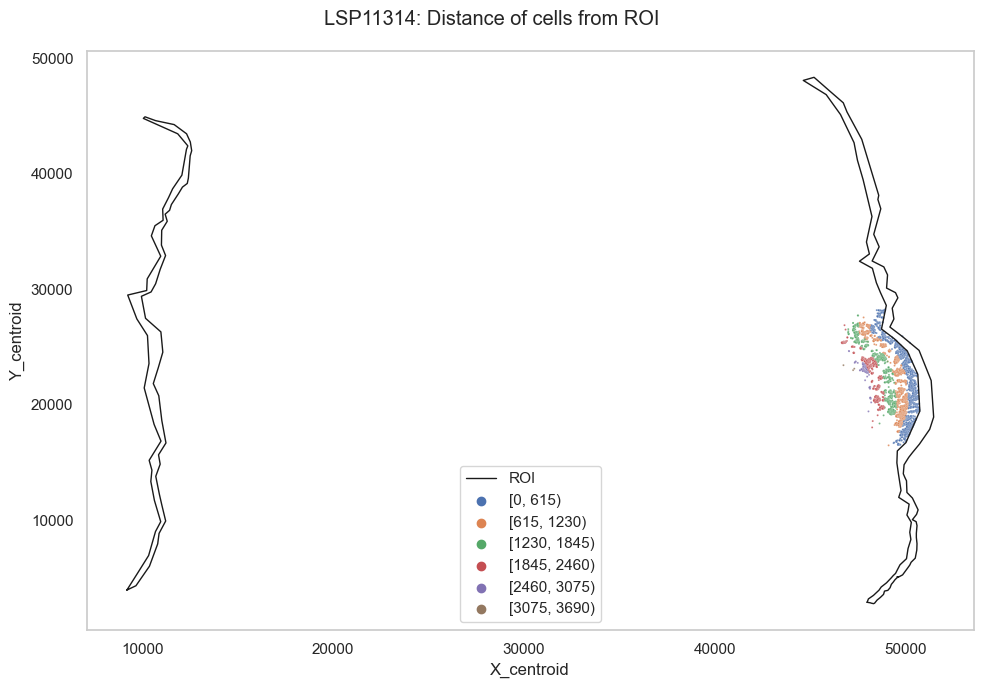

LSP11349
# of components: 2


4573it [00:00, 23645.42it/s]


Assigned points to region: ROI


4120it [00:00, 46932.33it/s]


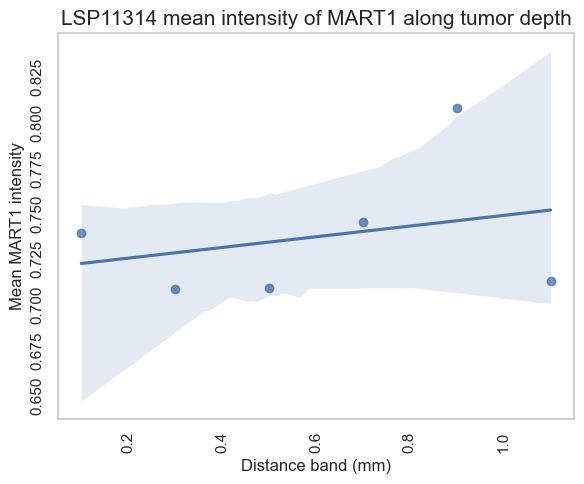

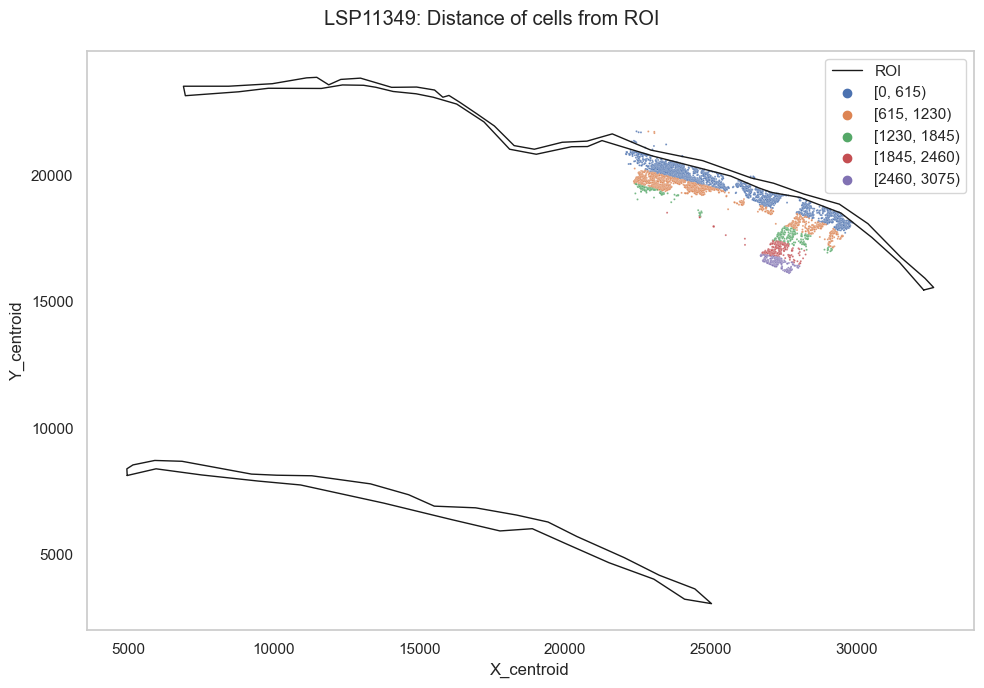

LSP11354
# of components: 2


8103it [00:00, 27309.84it/s]


Assigned points to region: ROI1


9623it [00:00, 30036.19it/s]


Assigned points to region: ROI2


8032it [00:00, 46202.63it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
10103it [00:00, 44320.50it/s]


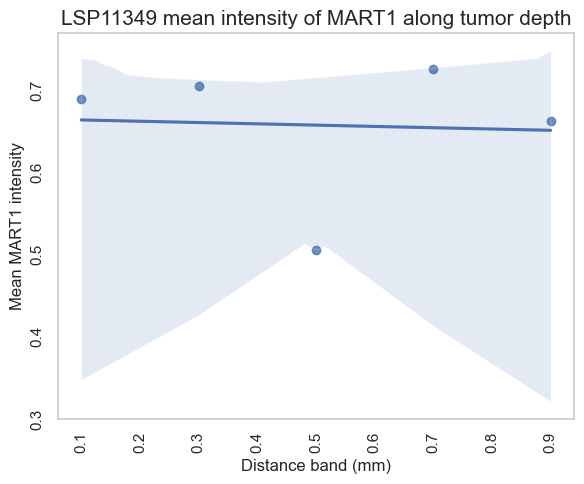

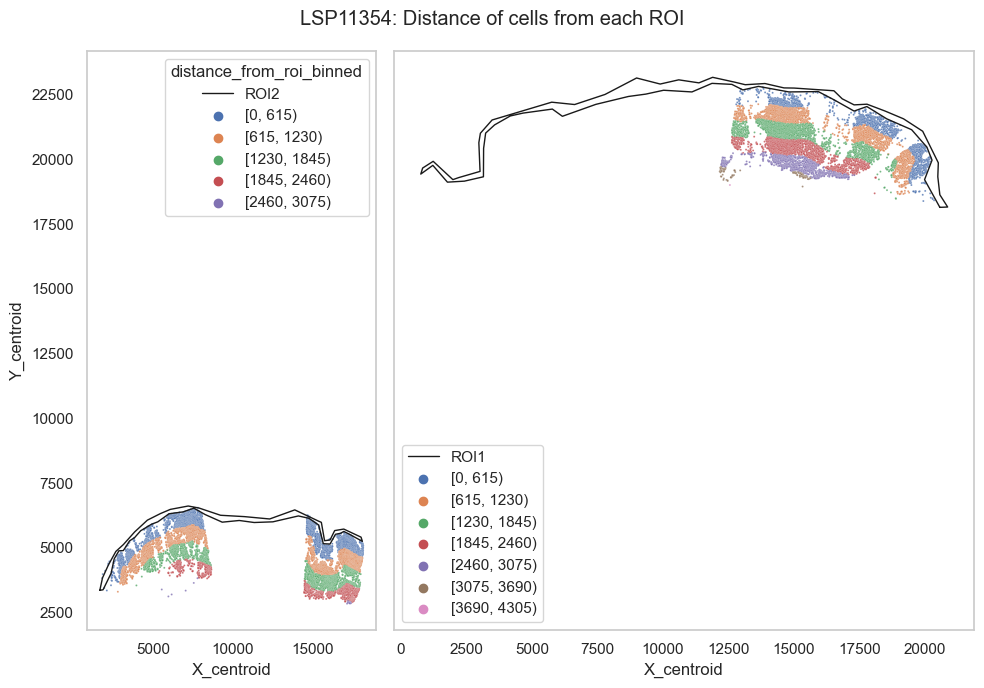

LSP11402
# of components: 2


4707it [00:00, 31608.42it/s]


Assigned points to region: ROI1


3816it [00:00, 27251.92it/s]


Assigned points to region: ROI2


4661it [00:00, 49352.48it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
5516it [00:00, 51026.86it/s]


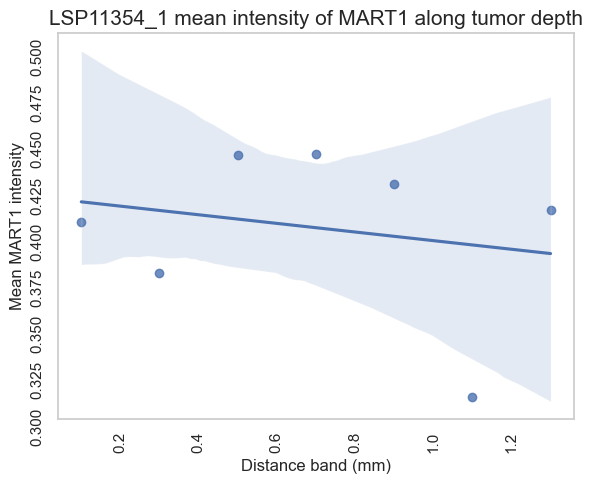

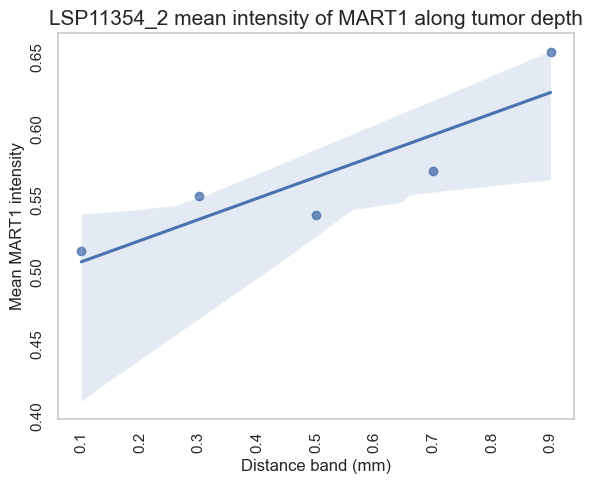

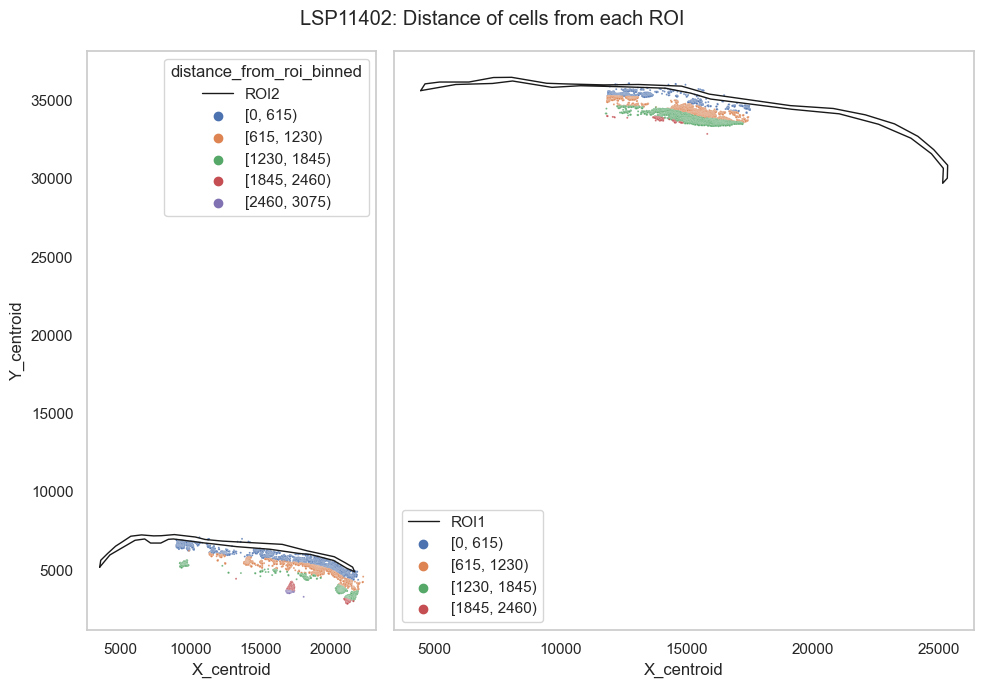

LSP11410
# of components: 2


3553it [00:00, 13115.39it/s]


Assigned points to region: ROI


3375it [00:00, 47231.26it/s]


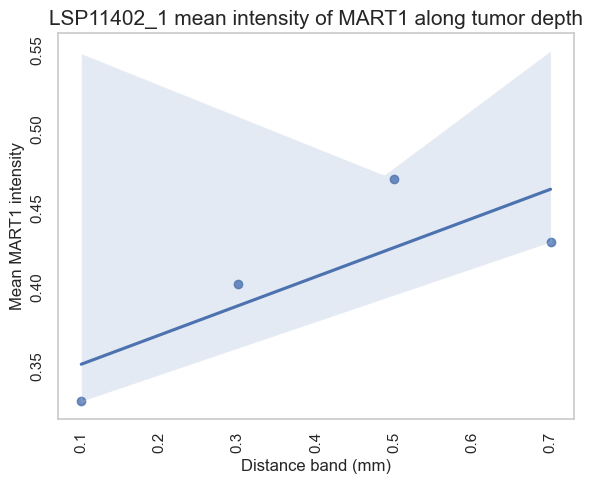

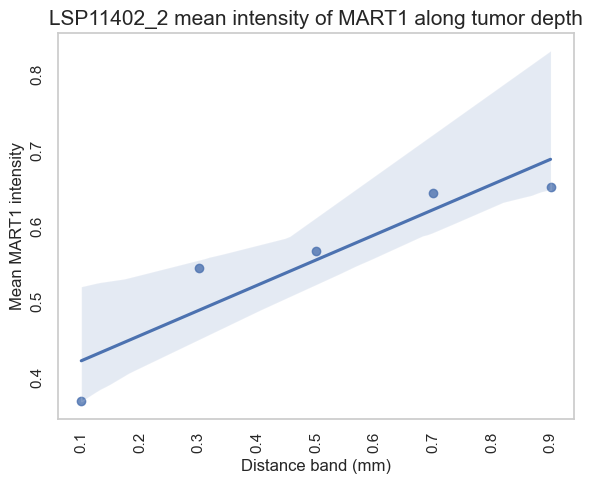

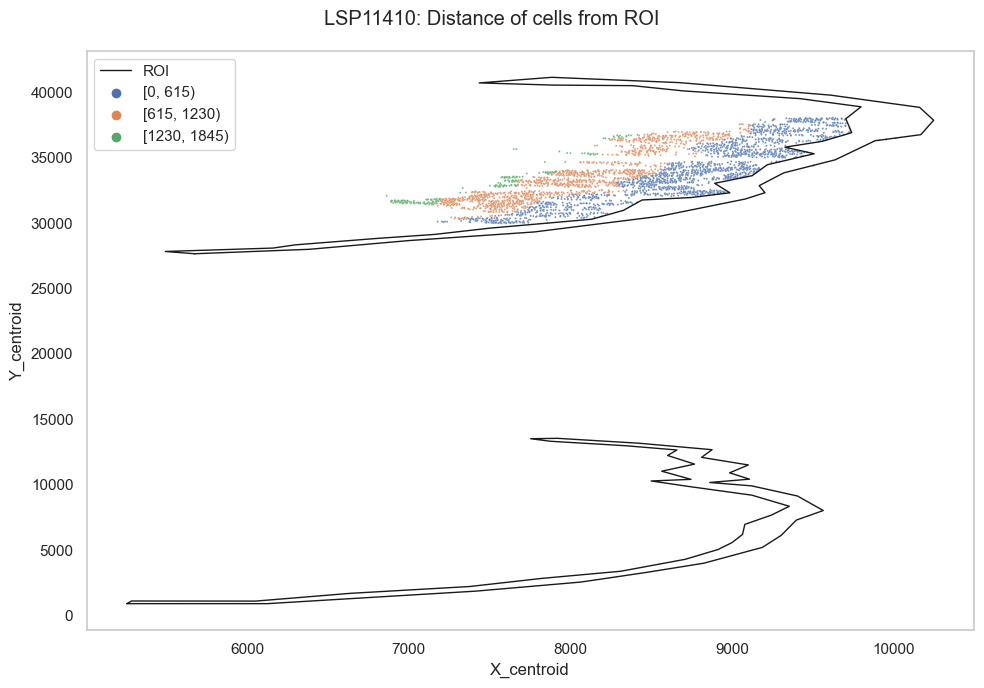

LSP11530
# of components: 2


1853it [00:00, 24878.19it/s]


Assigned points to region: ROI1


2288it [00:00, 23463.03it/s]


Assigned points to region: ROI2


1695it [00:00, 46739.41it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
1682it [00:00, 48084.54it/s]


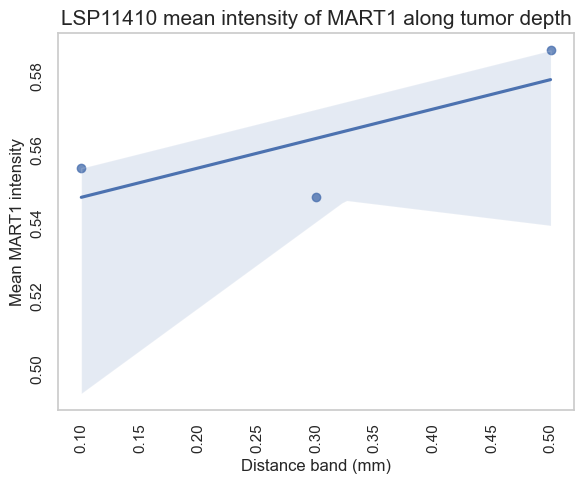

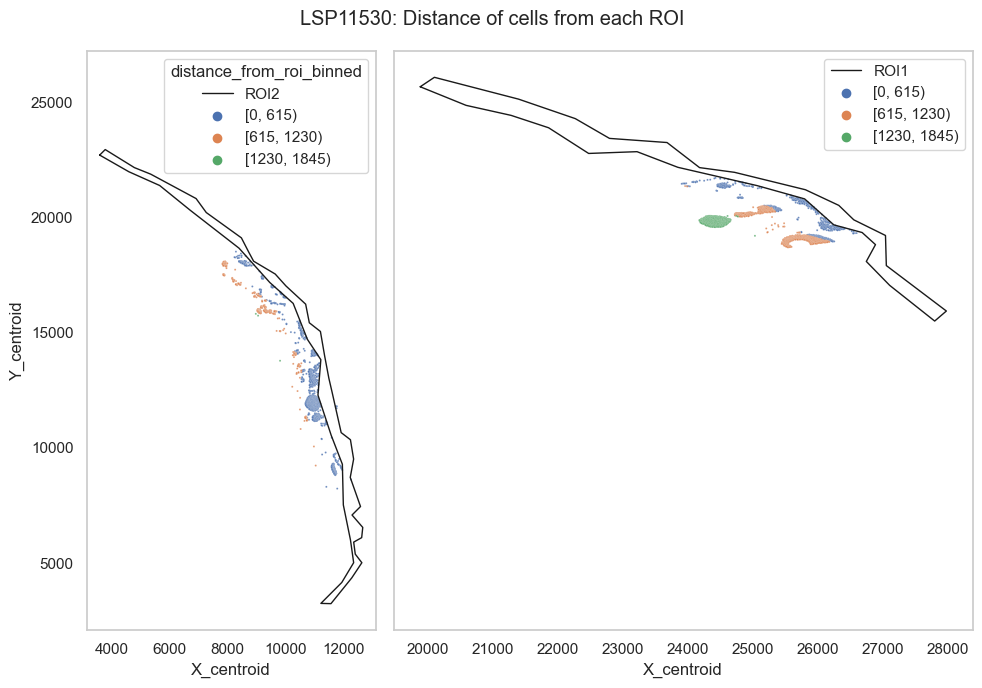

LSP11562
# of components: 1


5757it [00:00, 24352.80it/s]


Assigned points to region: ROI


5638it [00:00, 40755.58it/s]


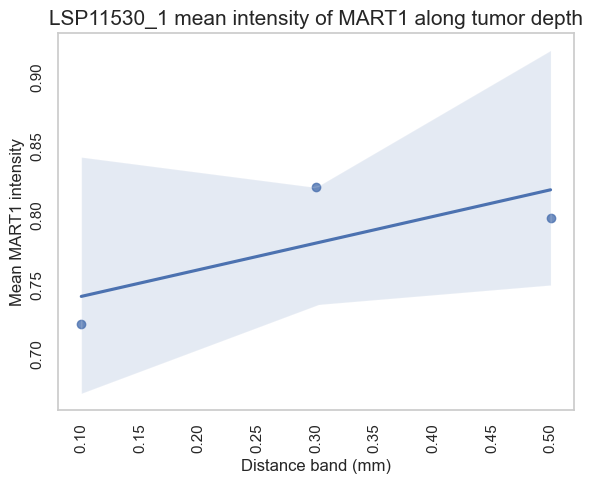

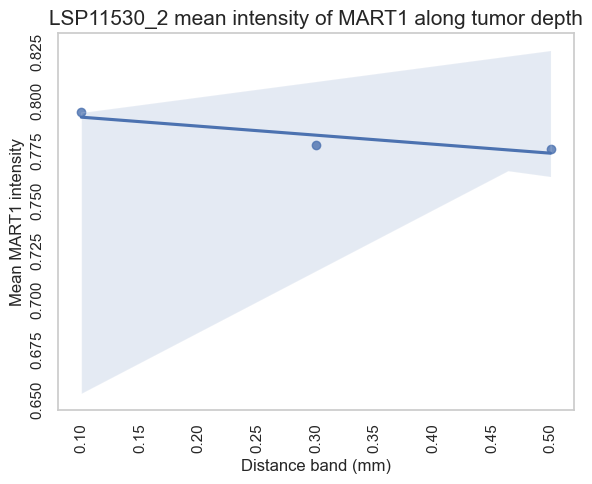

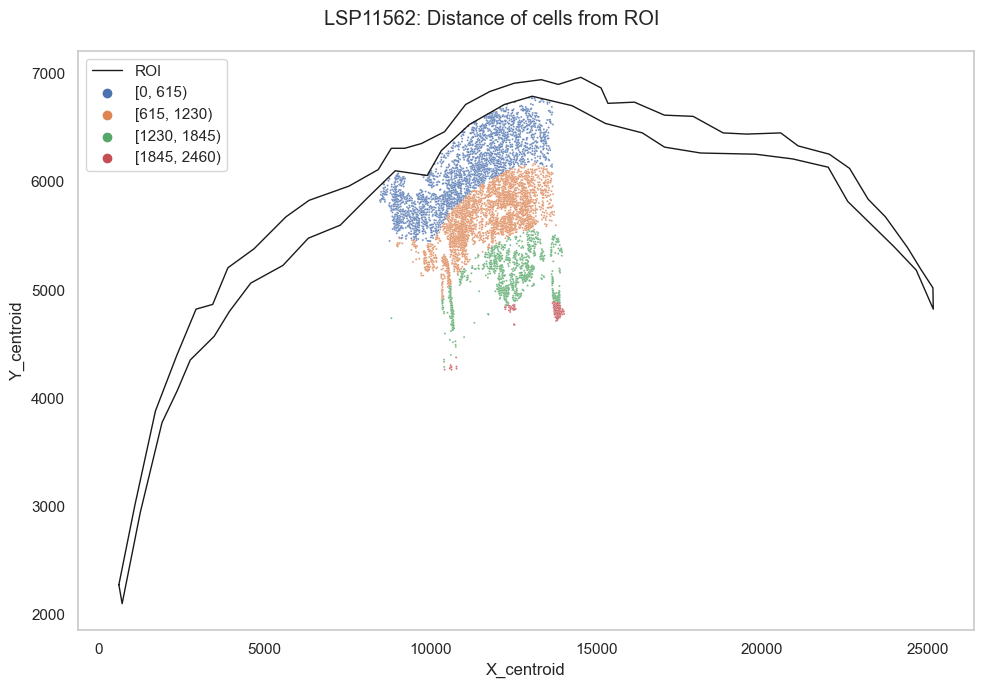

LSP11634
# of components: 1


8566it [00:00, 31758.40it/s]


Assigned points to region: ROI


7733it [00:00, 45580.20it/s]


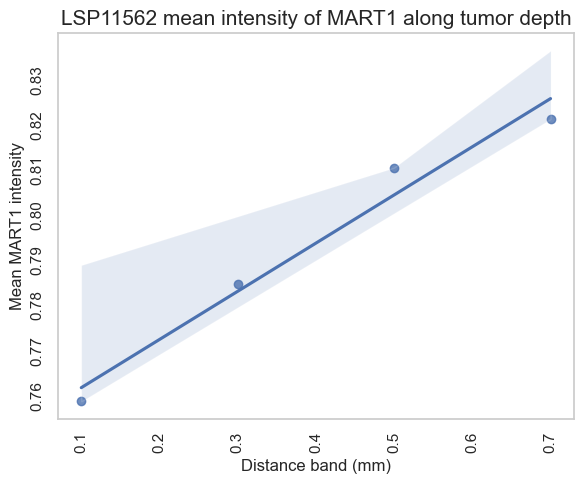

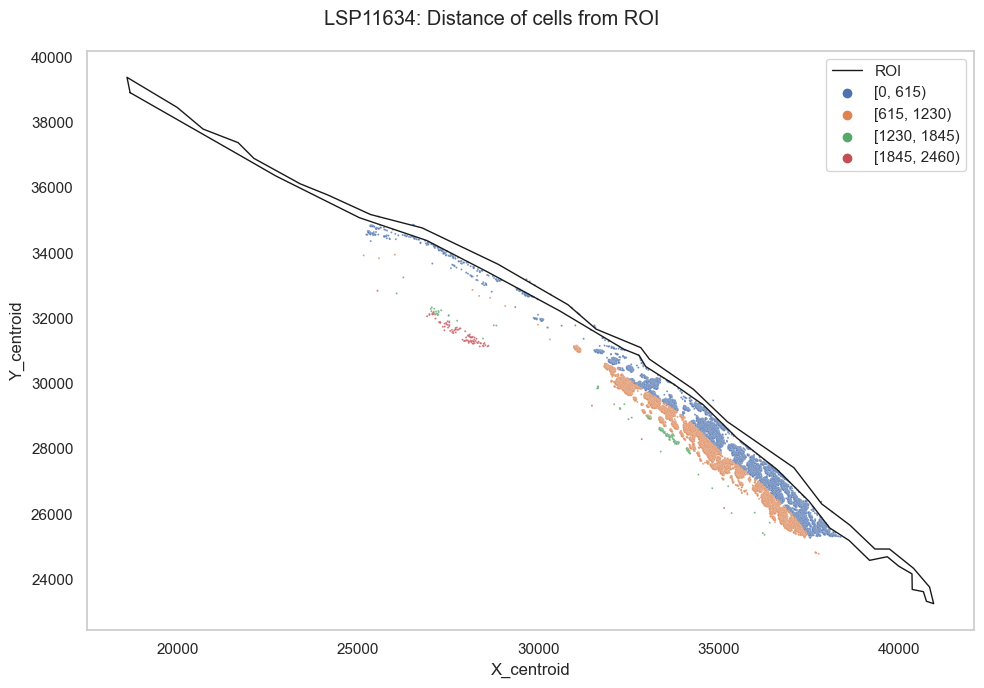

LSP11706
# of components: 2


1660it [00:00, 32884.54it/s]


Assigned points to region: ROI1


1866it [00:00, 32298.23it/s]

Assigned points to region: ROI2



1525it [00:00, 52076.64it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
1550it [00:00, 49300.60it/s]


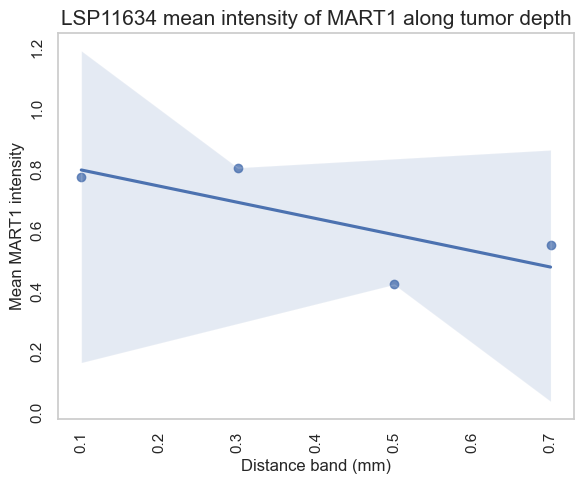

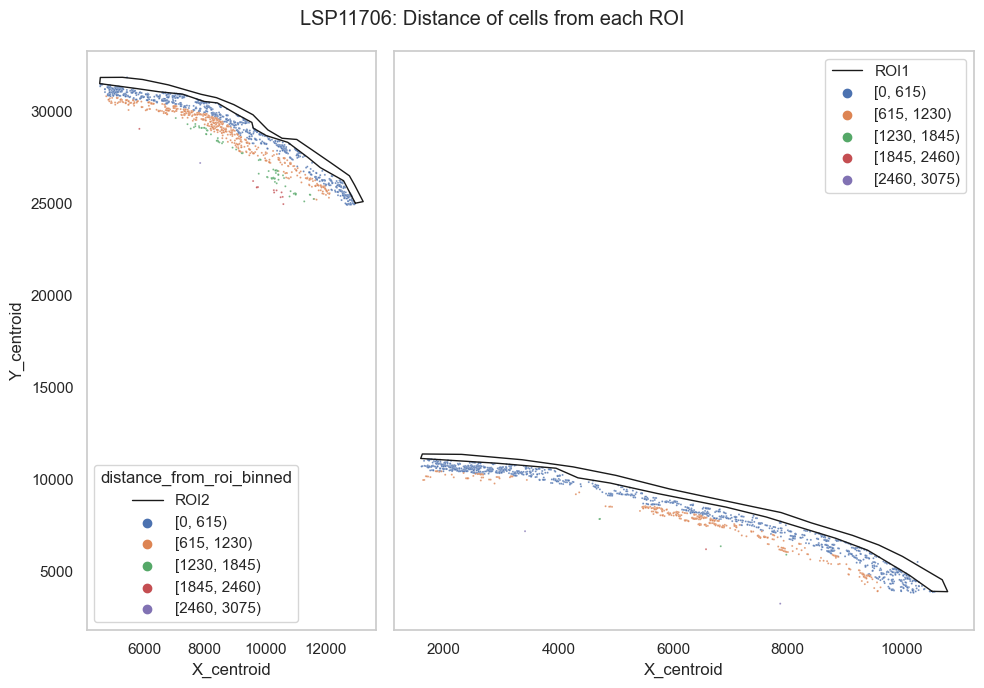

LSP11778
# of components: 1


1641it [00:00, 32095.22it/s]


Assigned points to region: ROI


1607it [00:00, 48803.46it/s]


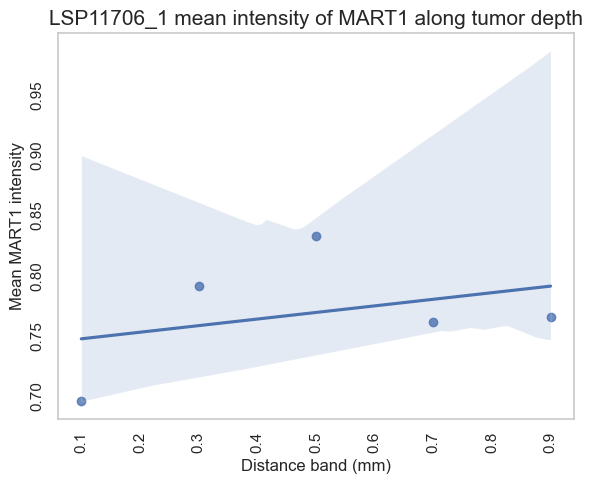

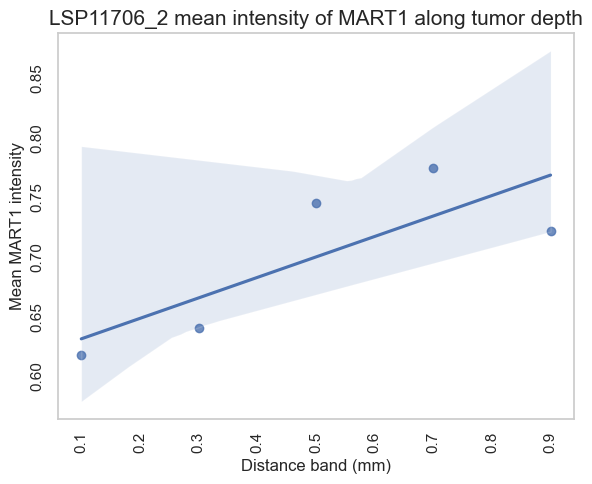

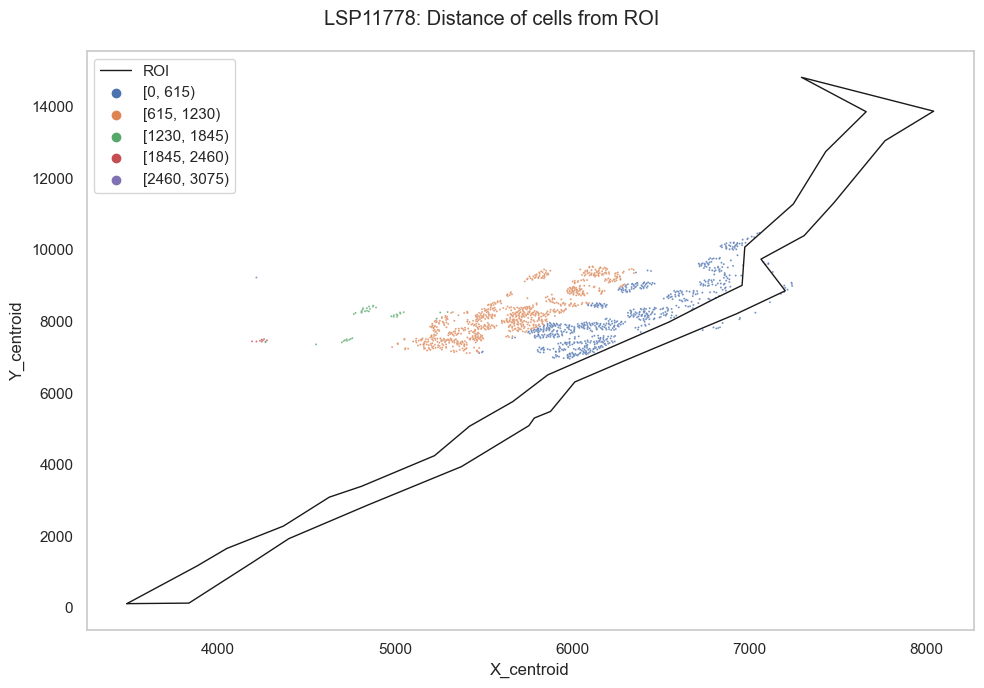

LSP11786
# of components: 1


9706it [00:00, 28891.73it/s]


Assigned points to region: ROI


9569it [00:00, 39255.19it/s]


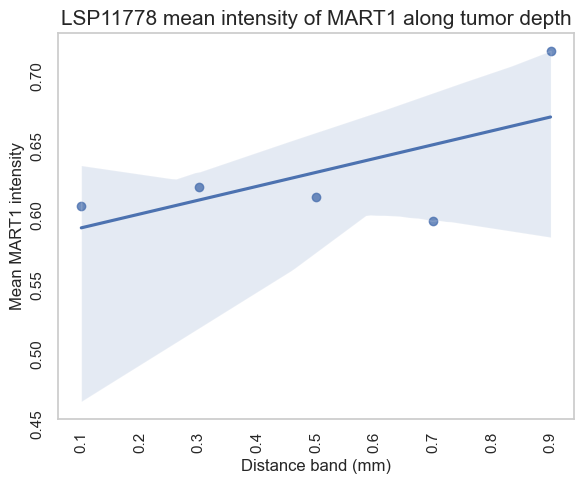

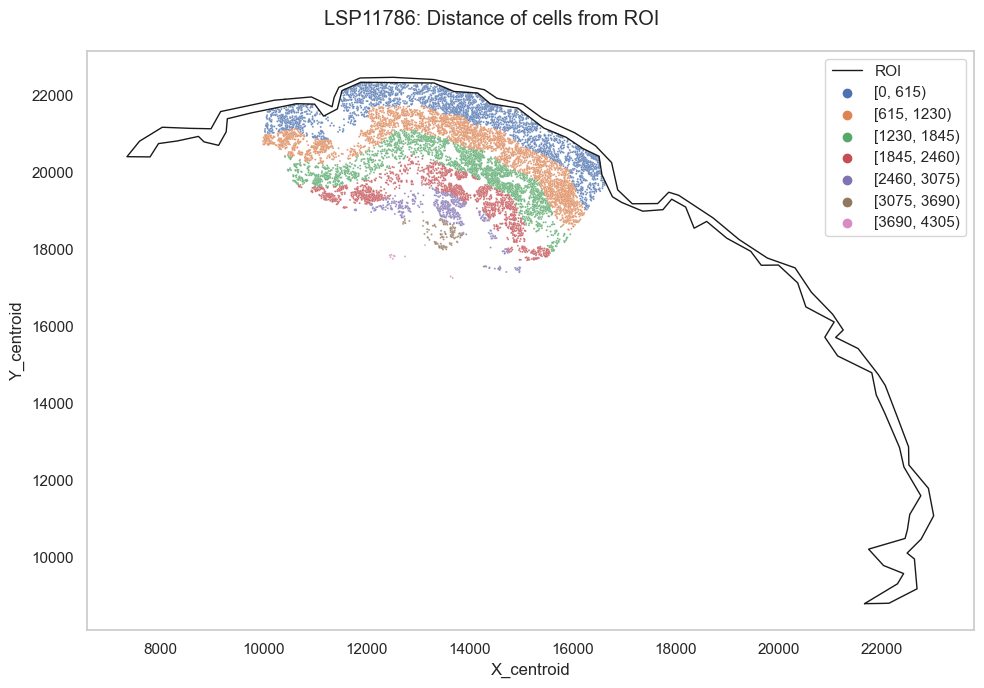

LSP11373
# of components: 1


5455it [00:00, 32663.91it/s]


Assigned points to region: ROI


5366it [00:00, 48397.20it/s]


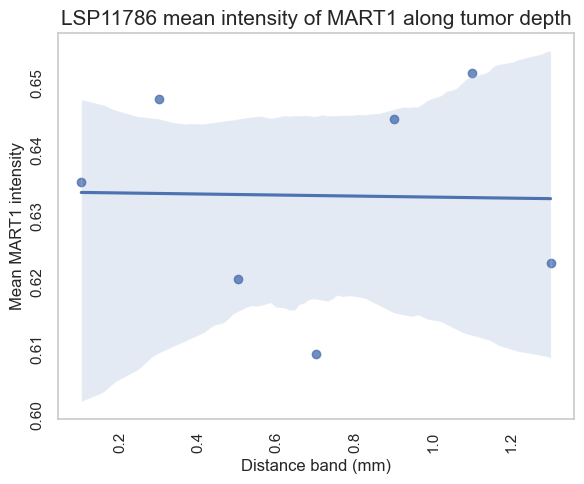

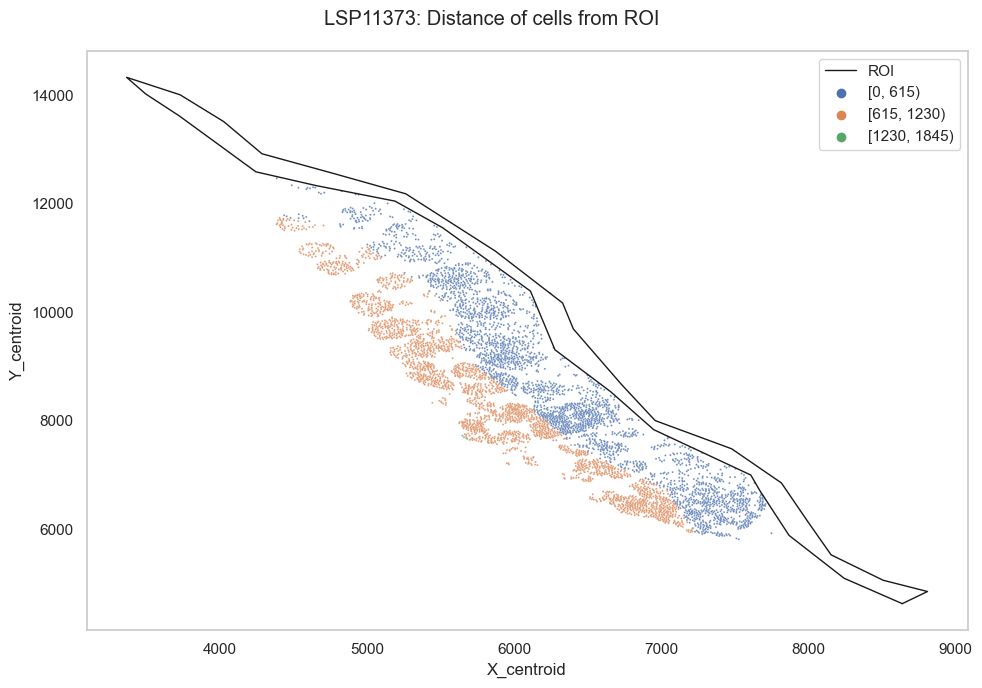

LSP11618
# of components: 1


2445it [00:00, 33411.77it/s]


Assigned points to region: ROI


1132it [00:00, 47229.68it/s]


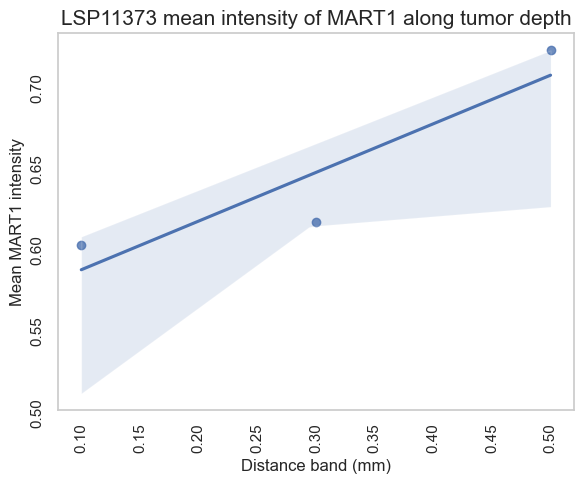

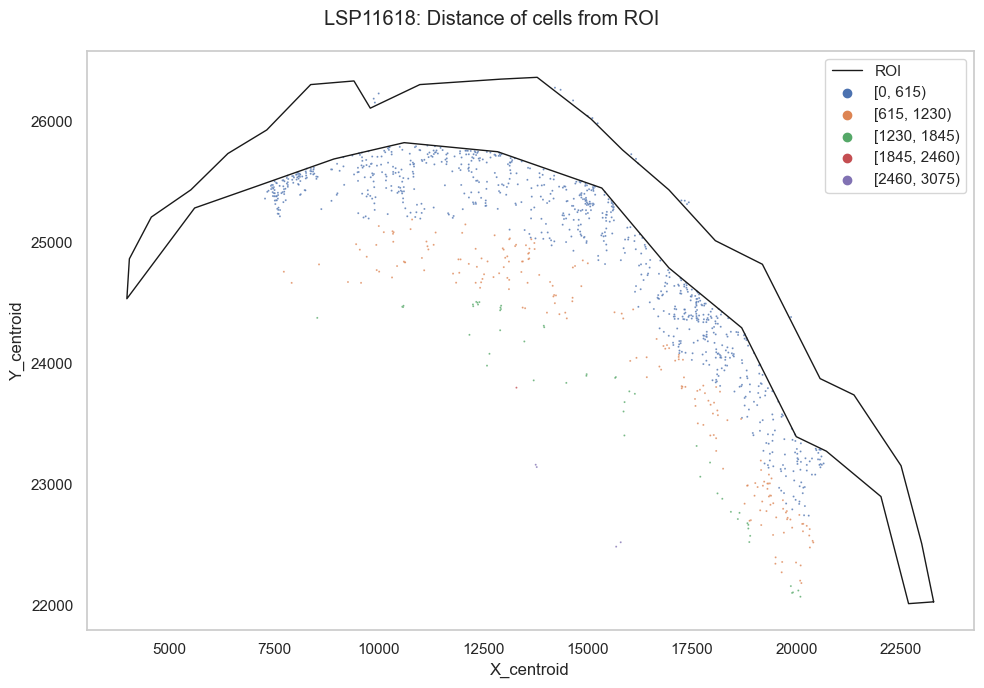

LSP11642
# of components: 1


14819it [00:00, 31550.32it/s]


Assigned points to region: ROI


14614it [00:00, 47359.61it/s]


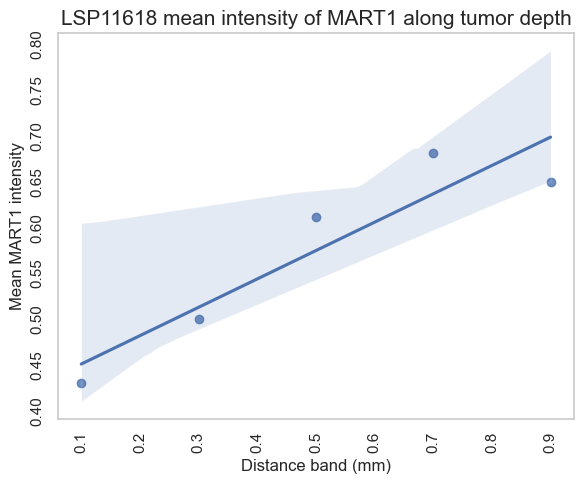

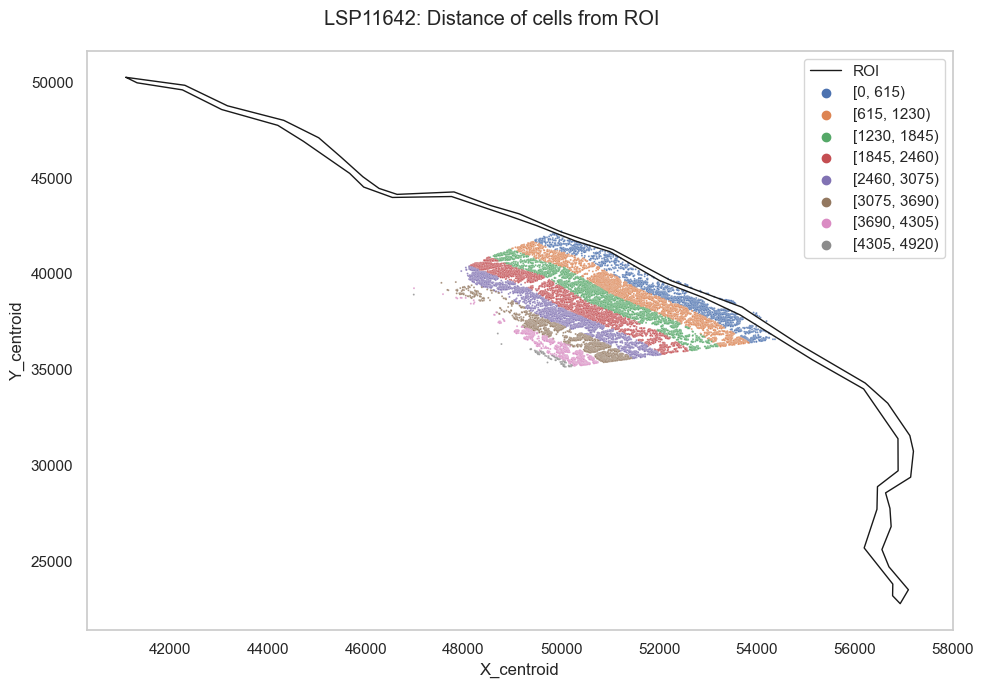

LSP11658
# of components: 2


7976it [00:00, 30456.46it/s]


Assigned points to region: ROI1


10762it [00:00, 32773.09it/s]


Assigned points to region: ROI2


11959it [00:00, 51424.20it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
14000it [00:00, 54323.38it/s]


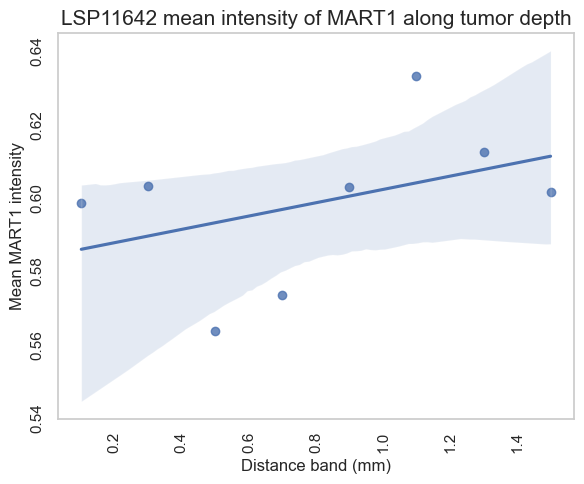

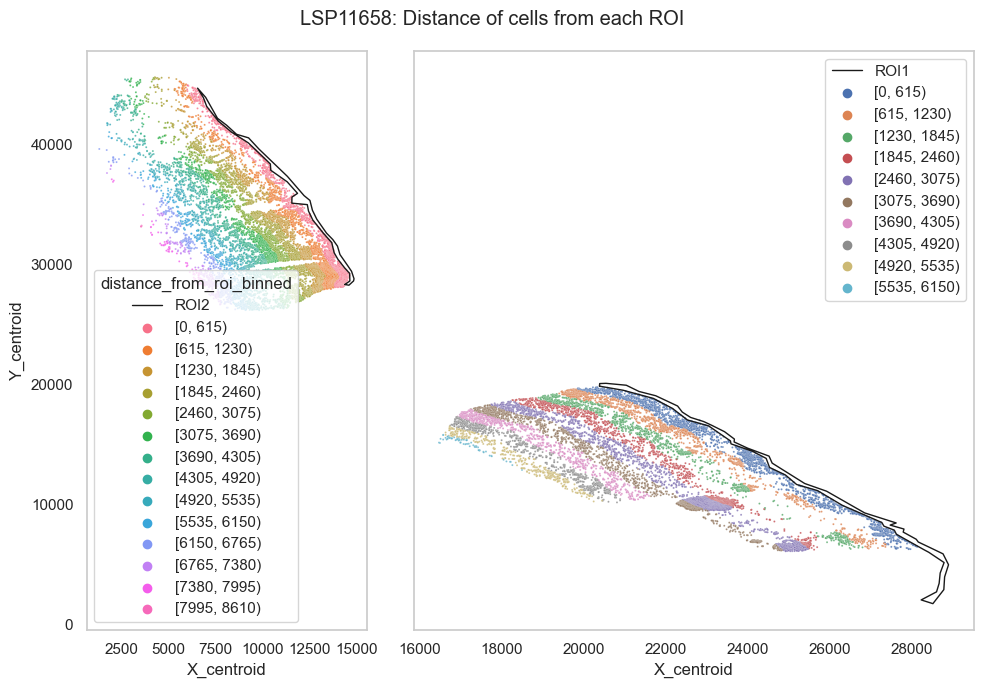

LSP11698
# of components: 2


1422it [00:00, 34062.06it/s]


Assigned points to region: ROI1


1595it [00:00, 31390.81it/s]

Assigned points to region: ROI2



1642it [00:00, 47788.22it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
4101it [00:00, 47311.99it/s]


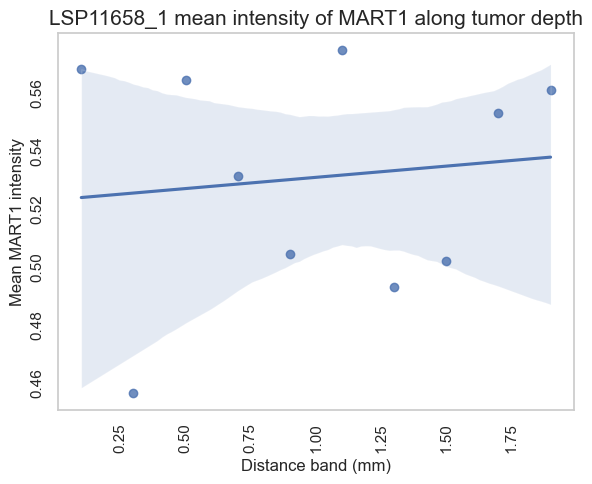

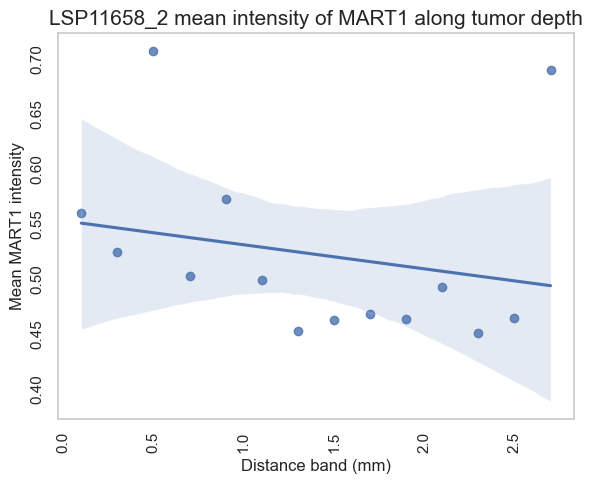

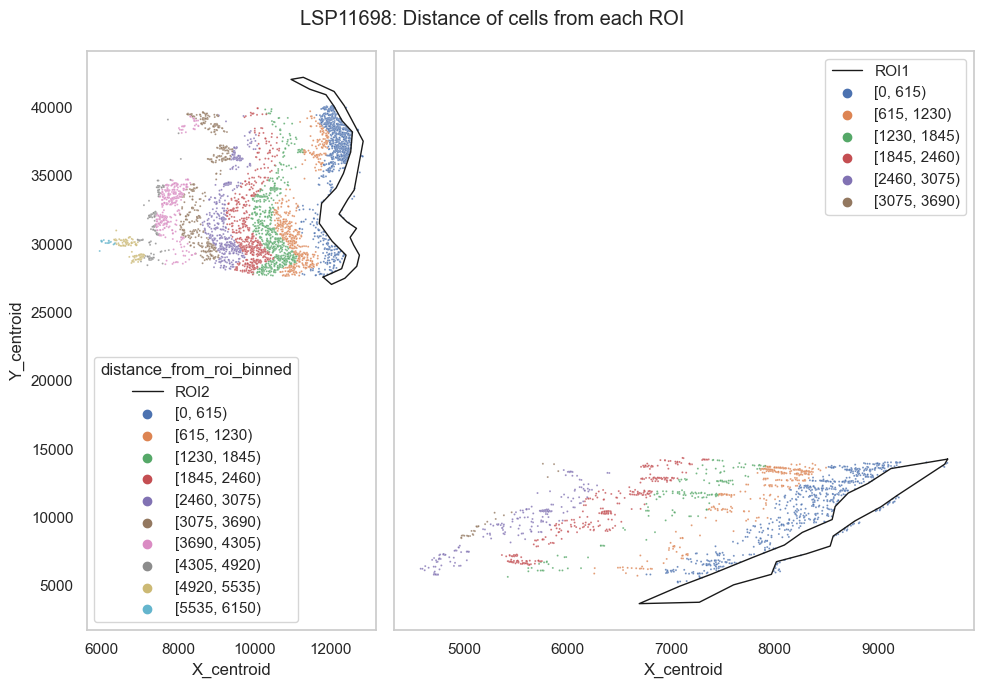

LSP11418
Skip sample without epidermal ROIs
LSP17170
Skip sample without epidermal ROIs
LSP13102
# of components: 1


16419it [00:00, 28143.88it/s]


Assigned points to region: ROI


14116it [00:00, 30198.98it/s]


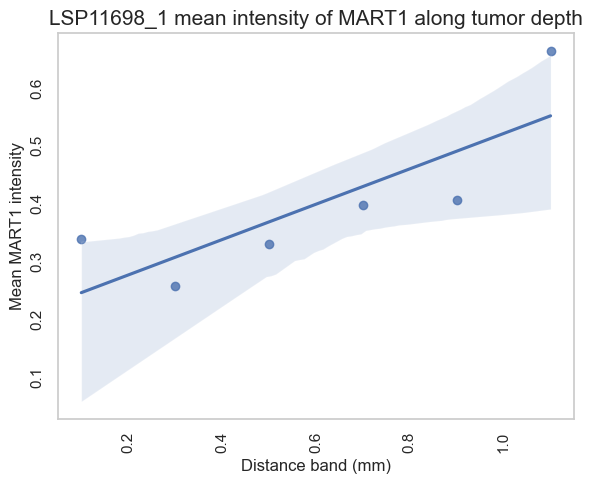

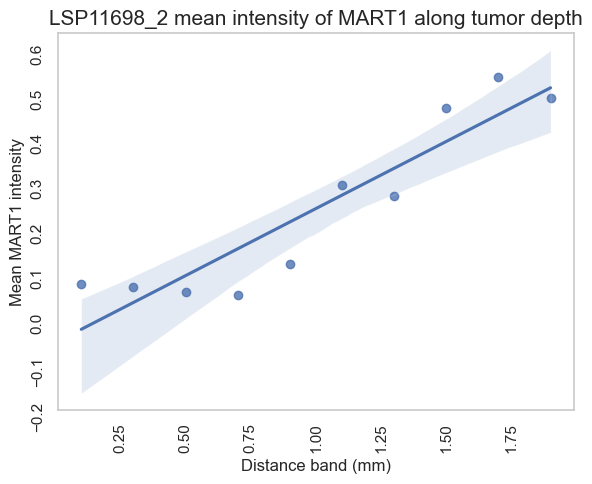

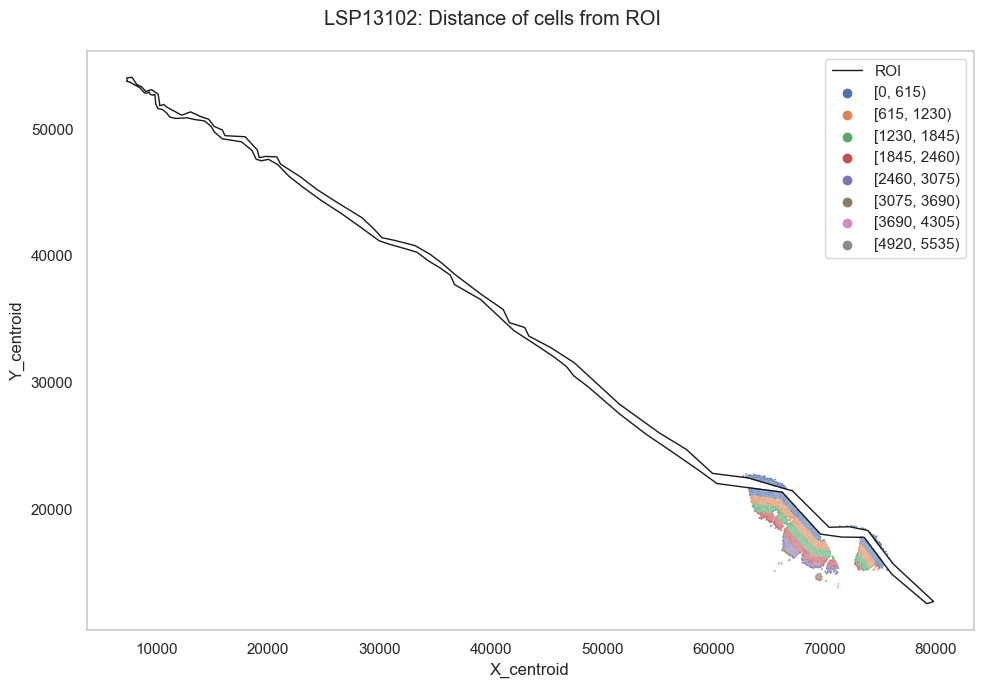

LSP15156
# of components: 1


139928it [00:04, 29601.85it/s]


Assigned points to region: ROI


137965it [00:02, 49280.37it/s]


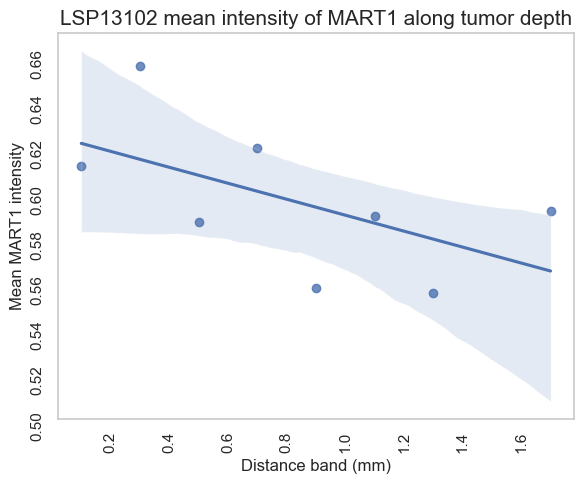

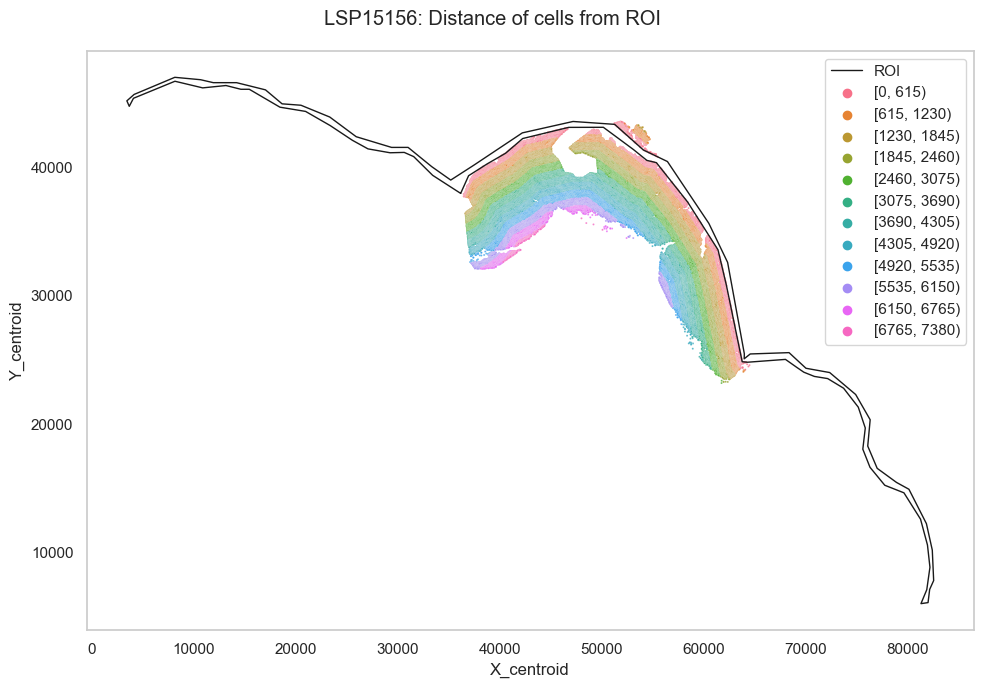

LSP13078
# of components: 1


60607it [00:02, 22494.42it/s]


Assigned points to region: ROI


176569it [00:04, 36396.06it/s]


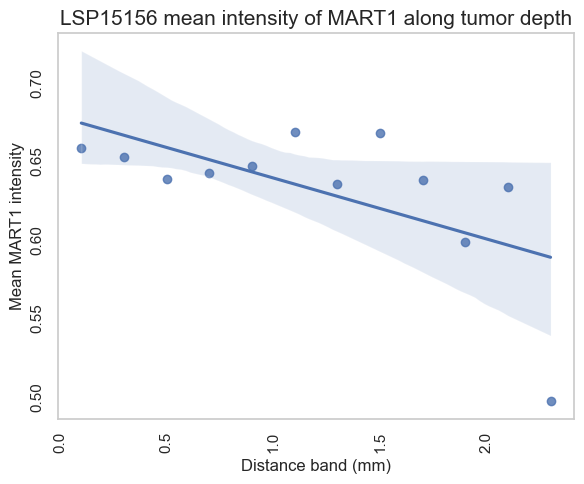

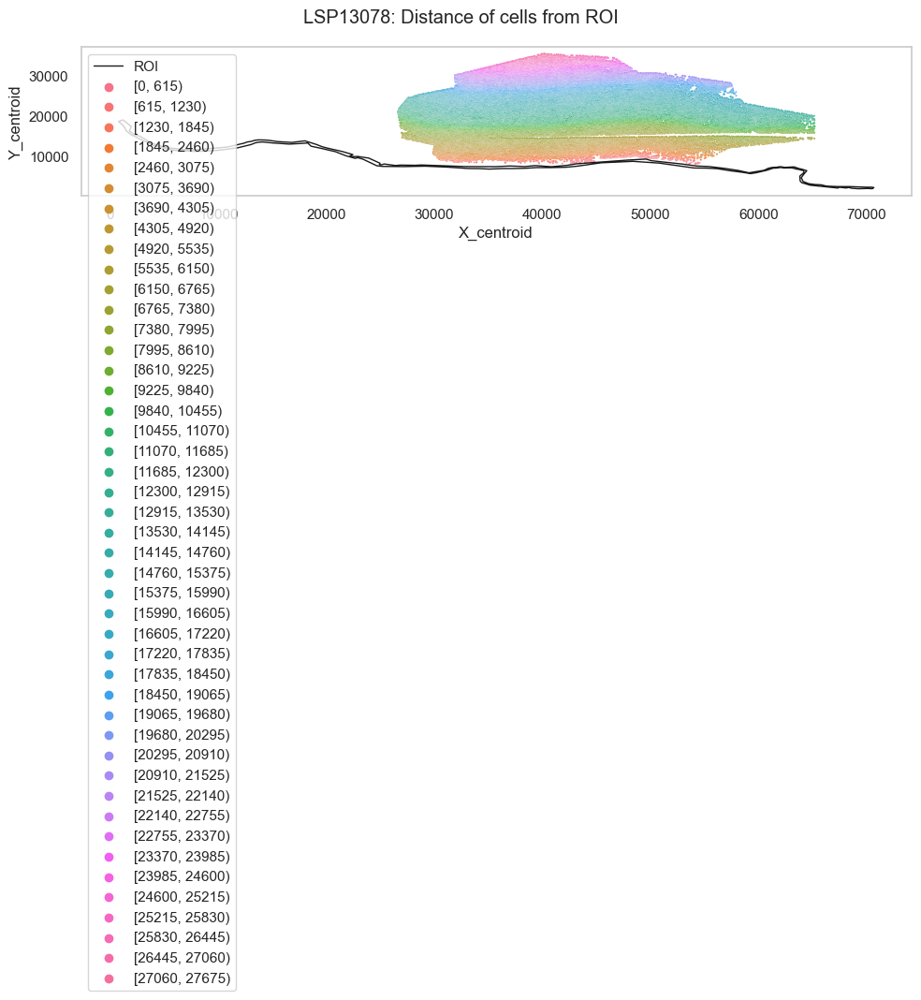

LSP13186
# of components: 1


12658it [00:00, 22300.41it/s]


Assigned points to region: ROI


149072it [00:03, 42860.38it/s]
/var/folders/4r/9bf8dywn1zb4b4pykp3mrbpm0000gn/T/ipykernel_41393/972873575.py:145: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


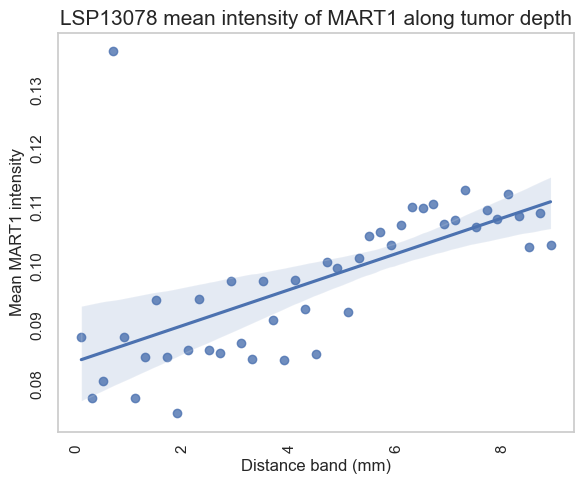

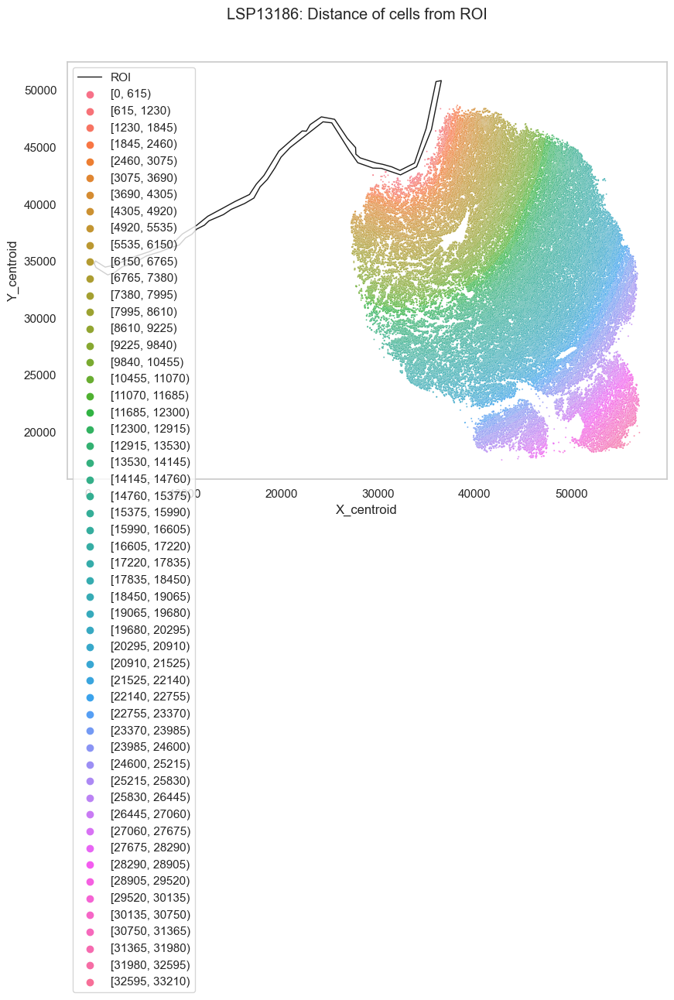

LSP15120
# of components: 2


13535it [00:00, 20697.81it/s]


Assigned points to region: ROI1


15631it [00:00, 30814.45it/s]


Assigned points to region: ROI2


13534it [00:00, 22974.95it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
14973it [00:00, 52257.44it/s]


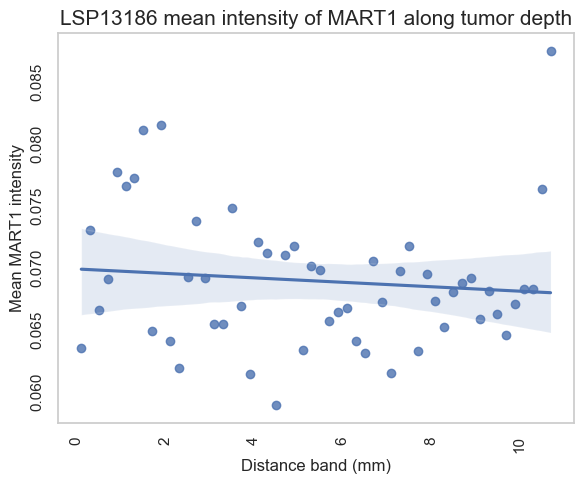

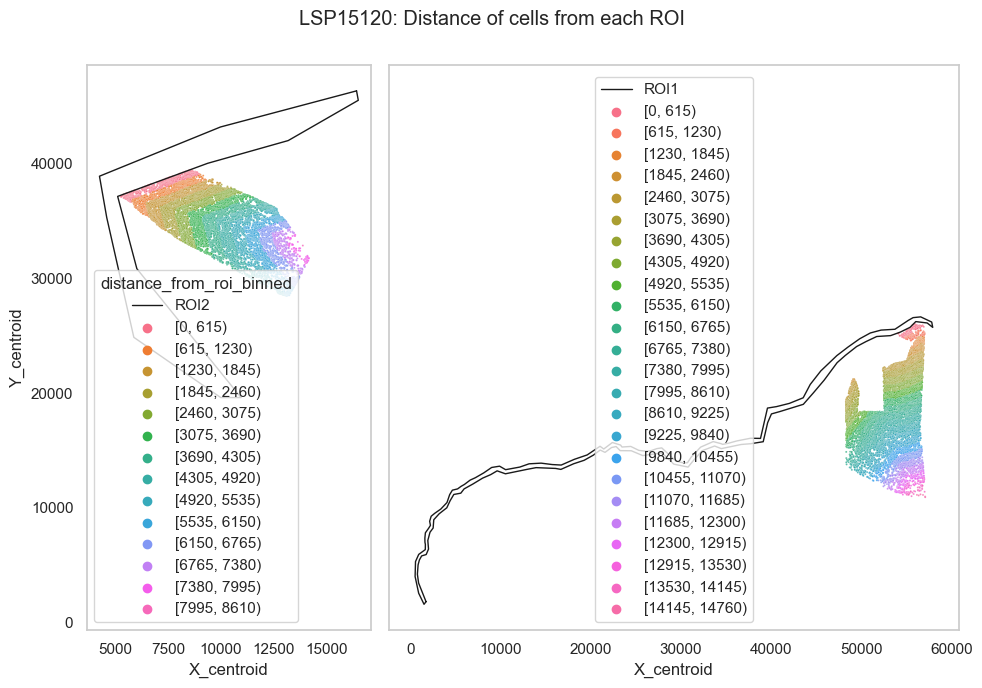

LSP15138
# of components: 2


14673it [00:01, 12834.08it/s]


Assigned points to region: ROI


18690it [00:00, 25650.00it/s]


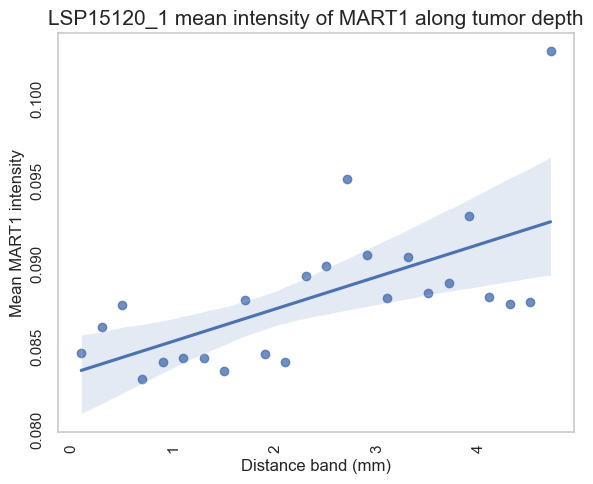

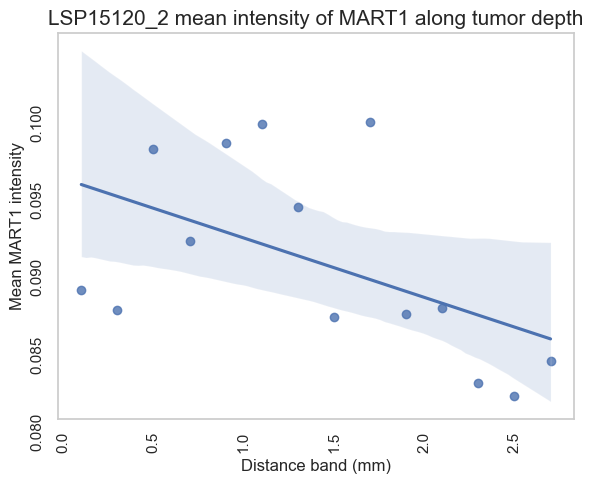

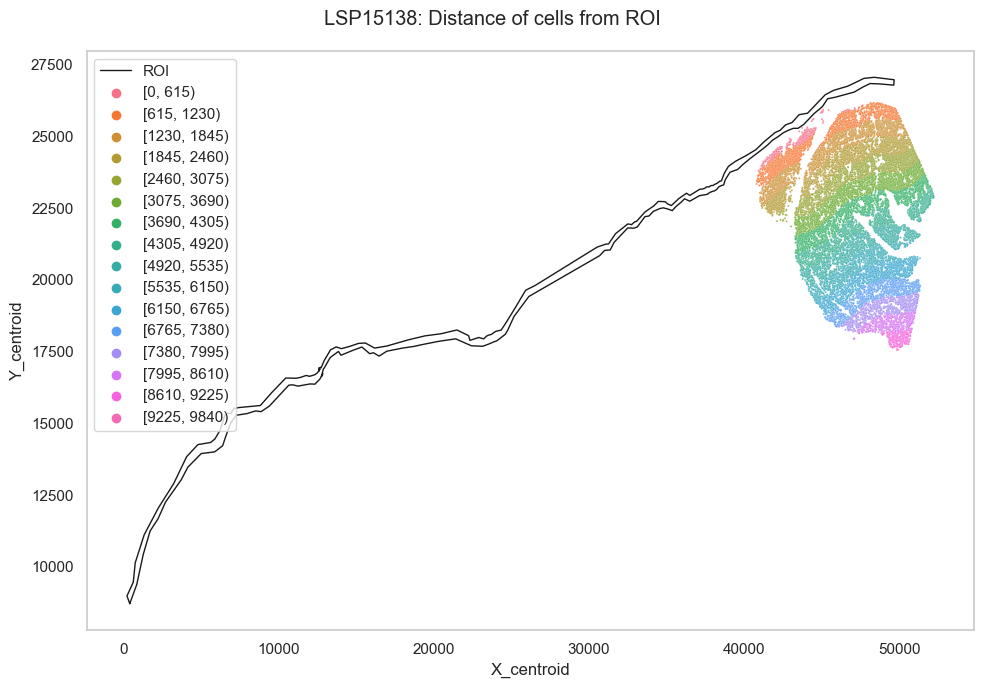

LSP15210
# of components: 2


41839it [00:01, 21660.15it/s]


Assigned points to region: ROI


41839it [00:00, 47272.87it/s]


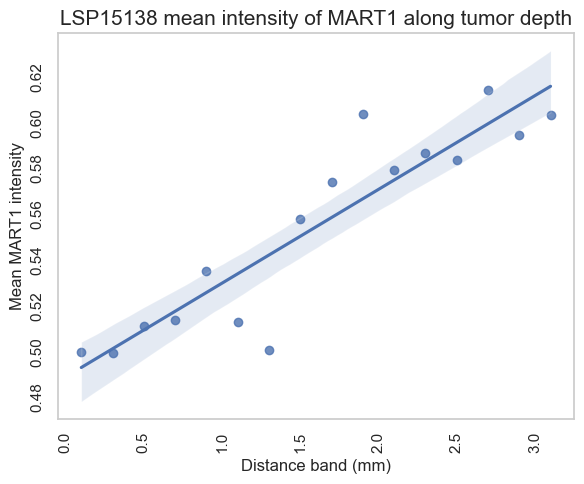

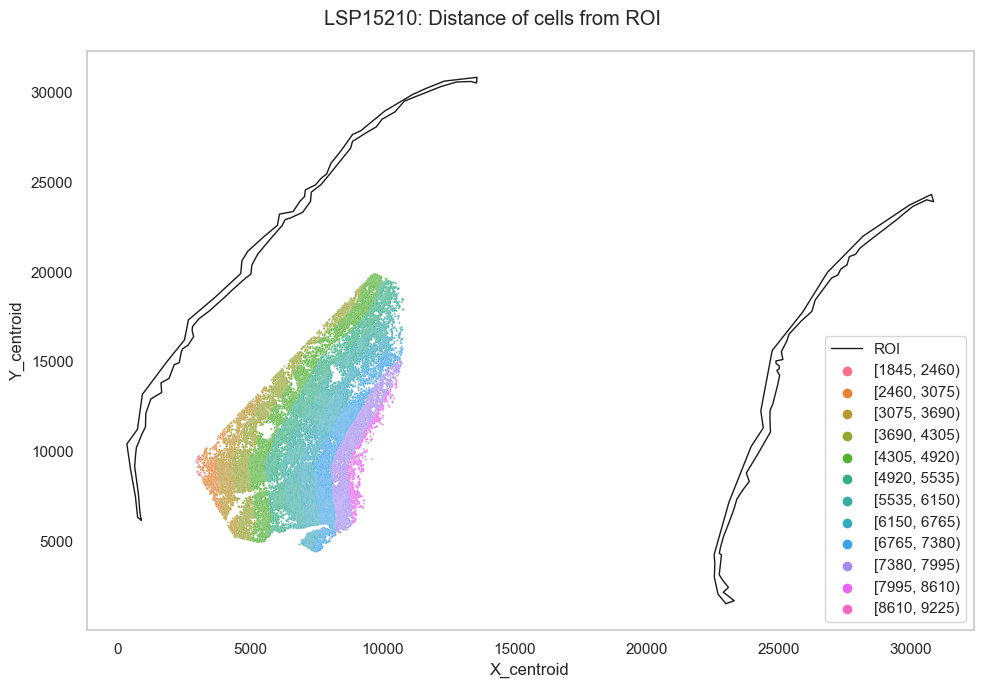

LSP15219_b
# of components: 2


12919it [00:00, 28728.81it/s]


Assigned points to region: ROI1


11321it [00:00, 31667.84it/s]


Assigned points to region: ROI2


12919it [00:00, 52339.32it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
11174it [00:00, 45596.43it/s]


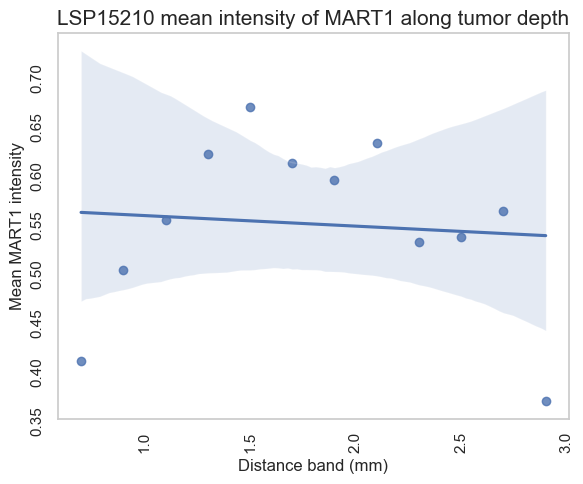

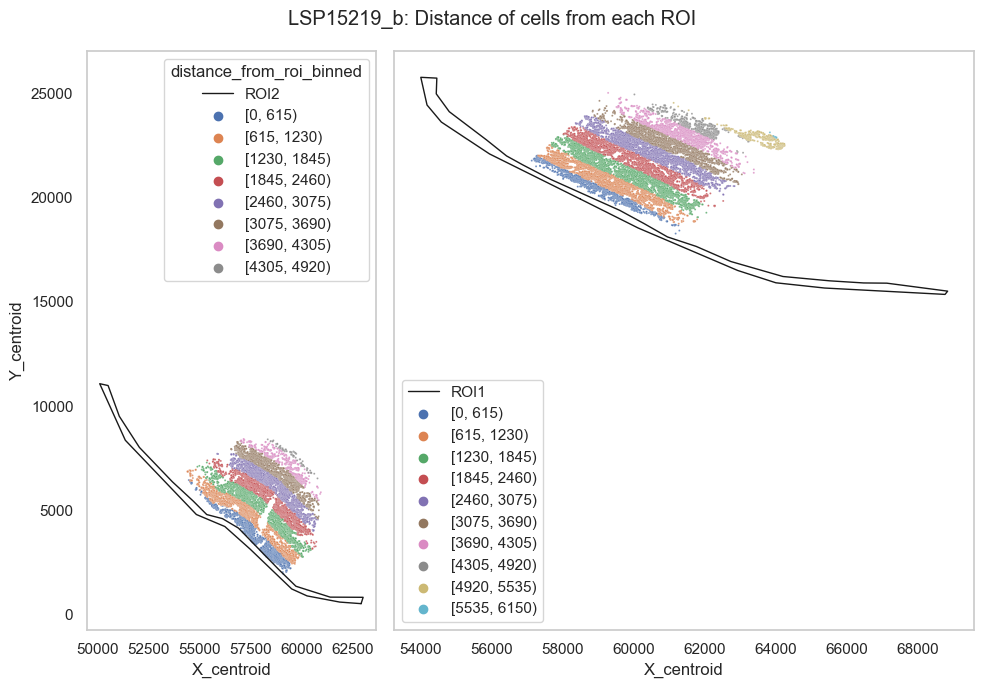

LSP15183
Skip sample without epidermal ROIs
LSP15129
# of components: 2


235413it [00:08, 28037.53it/s]


Assigned points to region: ROI1


160293it [00:05, 28604.59it/s]


Assigned points to region: ROI2


209687it [00:04, 46327.88it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
145180it [00:02, 49054.84it/s]


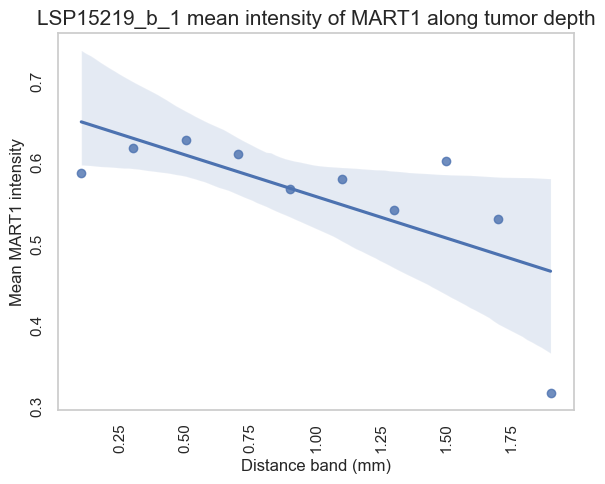

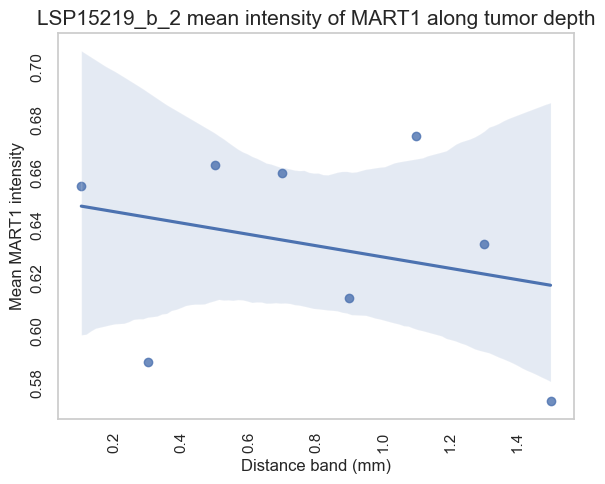

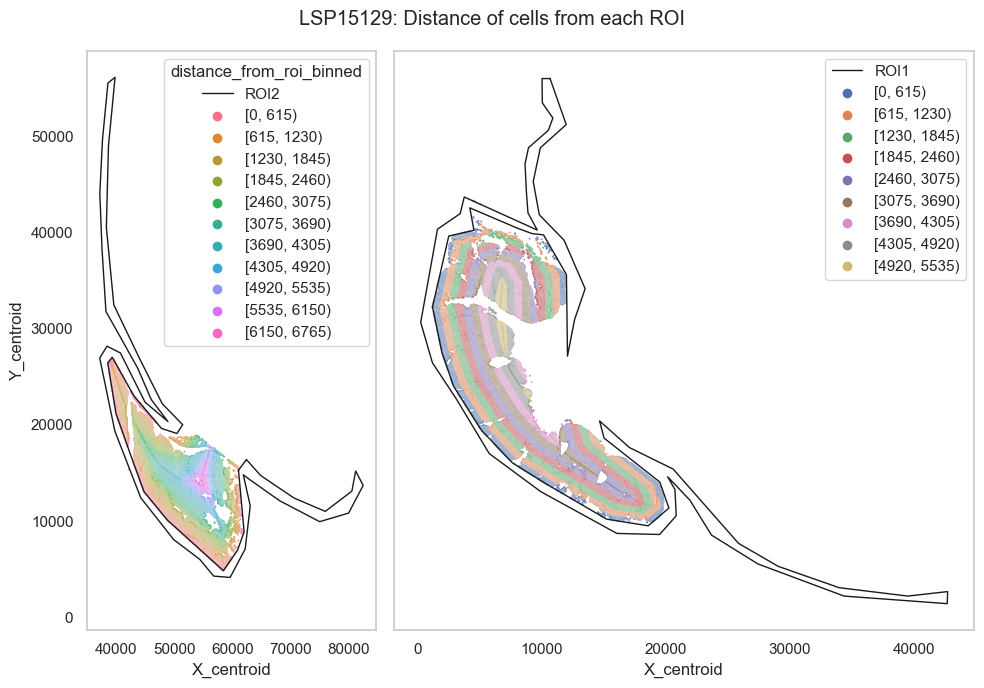

LSP13179
# of components: 2


64560it [00:02, 24021.73it/s]


Assigned points to region: ROI


62610it [00:01, 45850.23it/s]


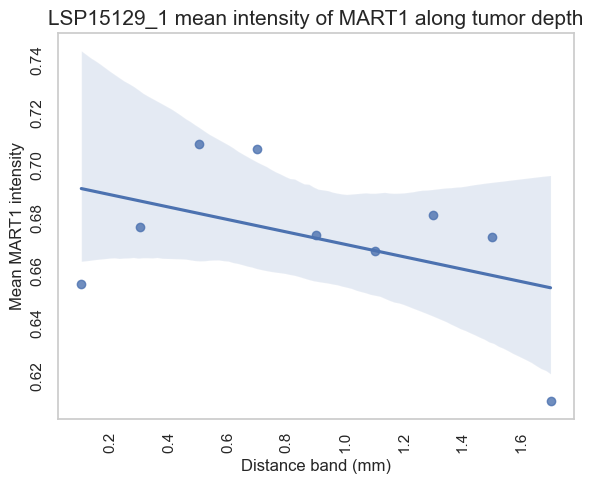

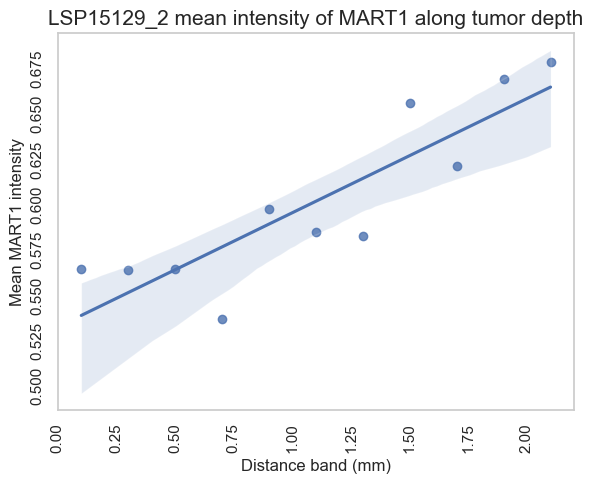

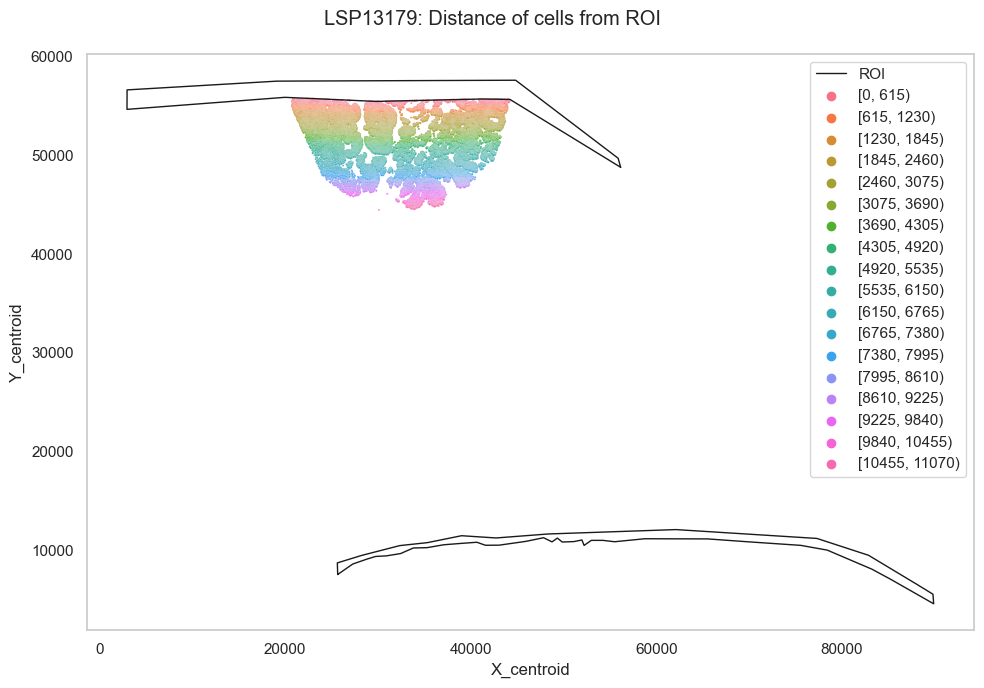

LSP15219_a
# of components: 2


205it [00:00, 27355.32it/s]

Assigned points to region: ROI1



16119it [00:00, 27503.39it/s]


Assigned points to region: ROI2


24144it [00:00, 37912.07it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
35876it [00:00, 40206.47it/s]


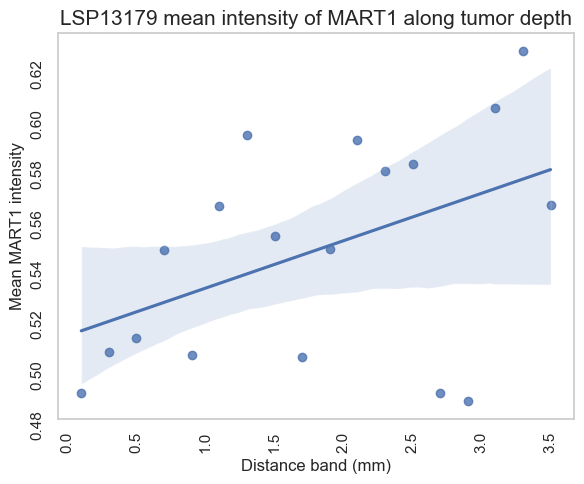

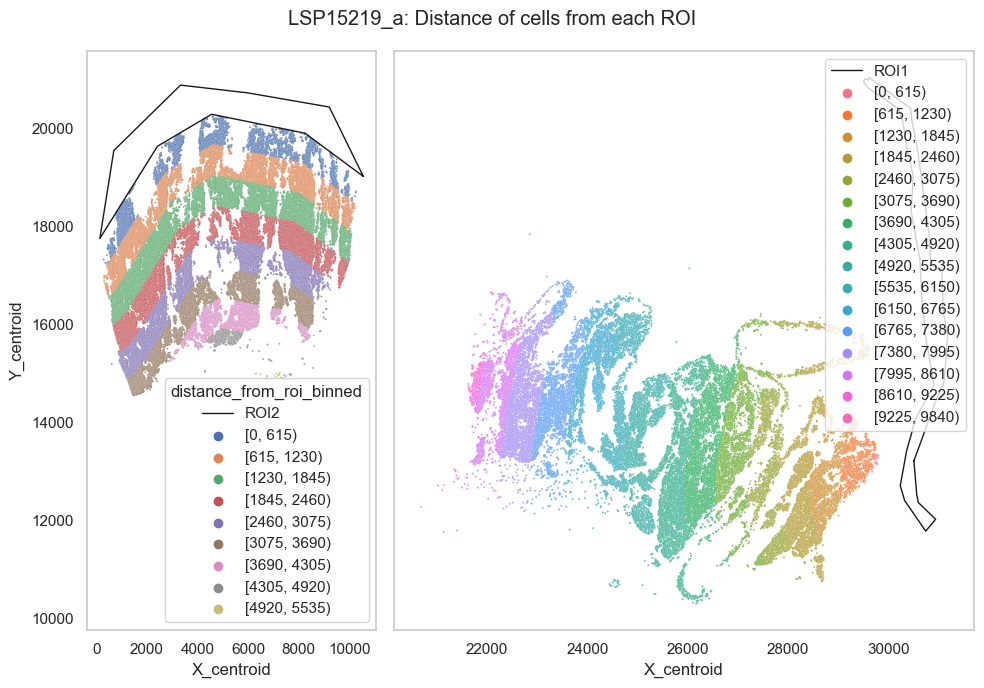

LSP15192
# of components: 2


11910it [00:00, 25538.43it/s]


Assigned points to region: ROI1


0it [00:00, ?it/s]


Assigned points to region: ROI2


265439it [00:05, 52032.89it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
107773it [00:02, 53693.50it/s]
/var/folders/4r/9bf8dywn1zb4b4pykp3mrbpm0000gn/T/ipykernel_41393/972873575.py:93: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


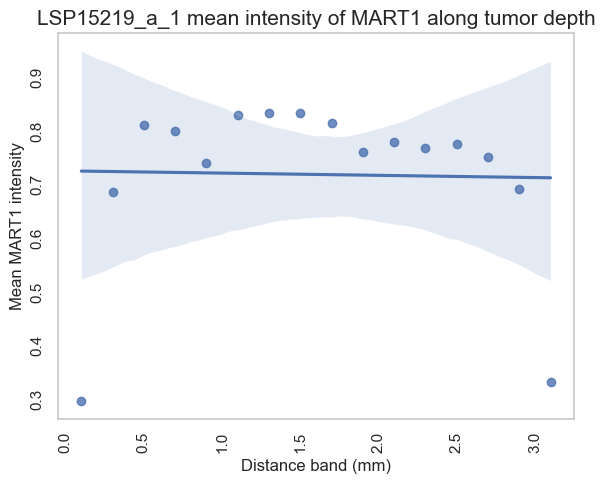

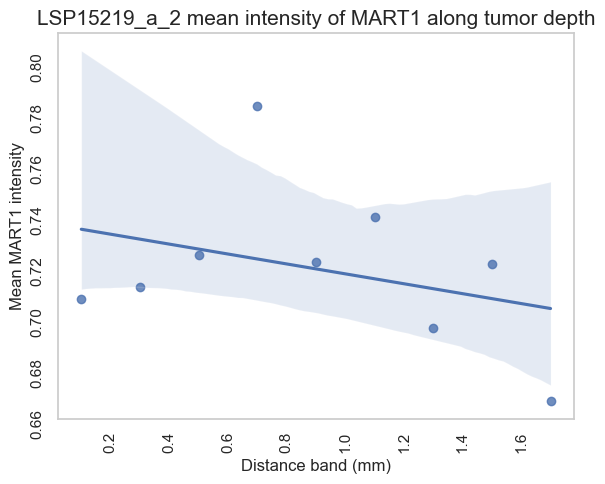

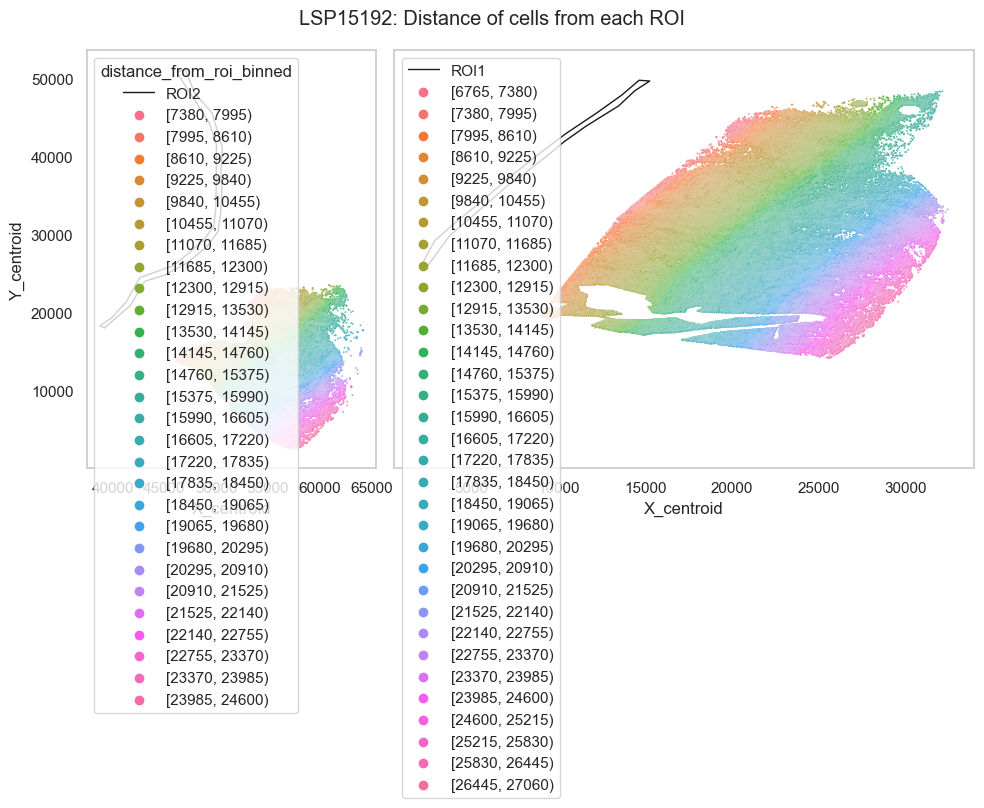

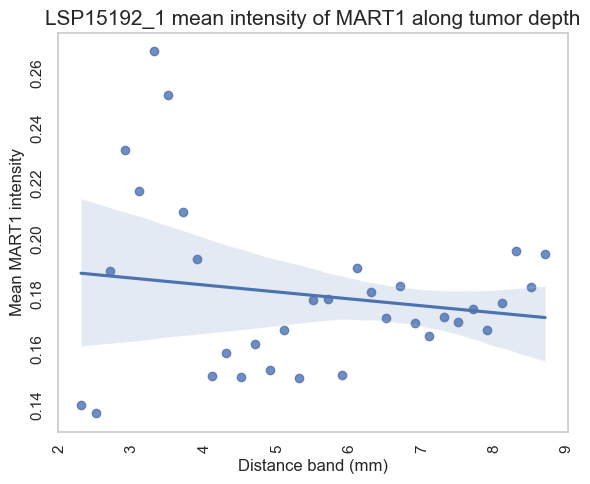

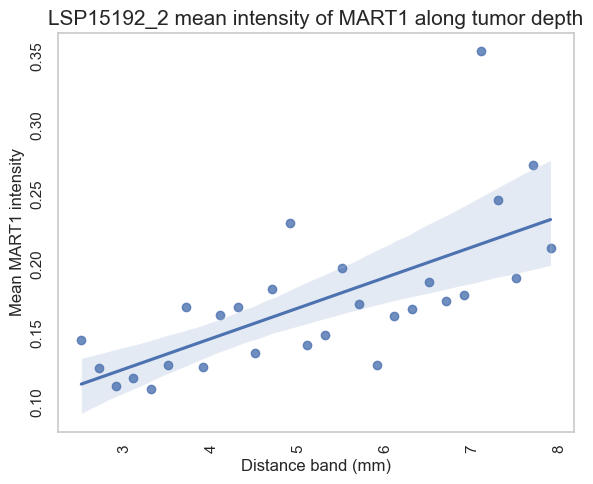

In [172]:
regression_dict = split_cells_along_tumor_region_per_patient(adata, roi_list, plot_ROI=True, regression=True)

### Split samples based on tumor depth and plot MART1 intensity along Breslow

In [178]:
def return_mean_marker_intensity_per_distance_band_df(data, patient_name, marker_name='MART1'):
    #data = data[data.obs.ROI != 'Other']

    distance_band_array = data.obs.distance_from_roi_binned.unique()
    distance_band_array = distance_band_array.dropna()
    distance_band_list = distance_band_array.tolist()
    # print(distance_band_list)
    marker_band_dict = {}
    for band in distance_band_list:
        df = data[data.obs.distance_from_roi_binned == band]#.obs
        if df.obs.empty:
            continue
        else:
            marker_vector = df.obs_vector(marker_name)
            marker_band_dict[band] = np.mean(marker_vector)
    marker_band_df = pd.DataFrame.from_dict(marker_band_dict, orient='index').reset_index().rename(columns={'index': 'band', 0:'marker_mean'})

    tuple_list = []
    for elem in marker_band_df['band'].tolist():
        elem_list = elem.split(', ')
        elem_tup = tuple([int(x.strip('(])[')) for x in elem_list])
        tuple_list.append(elem_tup)
    tuple_list.sort(key = lambda x: x[0])
    mid_list = [(x[0]+x[1])/2 for x in tuple_list]
    marker_band_df['band_mid'] = mid_list
    marker_band_df['mm_mid'] = (marker_band_df['band_mid'] / 615) * 0.2 # convert to mm
    ### RETURN marker_band_df for each patient here; collate outside; same x-axis
    return marker_band_df

In [181]:
# run per patient
def return_collated_distance_band_df(adata, roi_list, bin_size=615, plot_ROI=False):
    regression_dict = {}
    patient_list = adata.obs.imageid_raw.unique().tolist()
    for patient_name in patient_list:
        print(patient_name)
        if patient_name in ['LSP11418', 'LSP17170', 'LSP15183']:
            print('Skip sample without epidermal ROIs')
            continue
        data = adata[adata.obs['imageid_raw'] == patient_name].copy()
        # visualize patient
        #scanpy.pl.scatter(adata,x='X_centroid',y='Y_centroid',color='lineage_grouped')

        roi_path = [roi for roi in roi_list if patient_name in roi][0]
        roi = spc.utils.importRegion(roi_path)
        
        # get list of region components from region
        components = spc.spa.getComponents(roi)
        print("# of components:", len(components))

        sample_names = data.obs.imageid.unique().tolist()
        if len(sample_names) == 2:
            roi1, roi2 = components

            # assign cells to regions
            data.obs["ROI"] = "non-ROI"
            spc.spatial.assignPointsToRegions(
                data, [roi1, roi2], ["ROI1", "ROI2"], assigncolumn="ROI", default="non-ROI"
            )
            
            # split data into 2 halves since they come from 2 sections
            if patient_name in ['LSP11354', 'LSP11402', 'LSP11530', 'LSP15210', 'LSP15219_b', 'LSP15129', 'LSP15192']: # to assign correct epidermis ROI to each region
                data1 = data[data.obs["imageid"] == sample_names[1]].copy()
                data2 = data[data.obs["imageid"] == sample_names[0]].copy()
            else:
                data1 = data[data.obs["imageid"] == sample_names[0]].copy()
                data2 = data[data.obs["imageid"] == sample_names[1]].copy()
            # data1 = data[data.obs["imageid"] == sample_names[0]].copy()
            # data2 = data[data.obs["imageid"] == sample_names[1]].copy()

            if plot_ROI:
                # get distance for each half separately and plot
                fig, [ax1, ax2] = plt.subplots(1, 2, figsize=(10, 7), 
                                            sharey=True, 
                                            gridspec_kw={'width_ratios': [1, 2]})
                plt.suptitle(f"{patient_name}: Distance of cells from each ROI")

            # ROI 1
            spc.msmt.getDistanceFromObject(
                data1, roi1,
                region_col="ROI",
                region_subset=["non-ROI"], # all cells not in ROI1 & ROI2
                name="distance_from_roi",
                binned=True,
                binsize=bin_size,
            )
            if plot_ROI:
                spc.plt.plotBoundary(roi1, linewidth=1.0, color="k", label="ROI1",ax=ax2)
                sns.scatterplot(
                    data=data1.obs,
                    x="X_centroid",
                    y="Y_centroid",
                    hue="distance_from_roi_binned",
                    alpha=0.8,
                    s=2,
                    ax=ax2,
                )
                ax1.legend()

            #ROI 2
            spc.msmt.getDistanceFromObject(
                data2, roi2,
                region_col="ROI",
                region_subset=["non-ROI"], # all cells not in ROI1 & ROI2
                name="distance_from_roi",
                binned=True,
                binsize=bin_size,
            )

            if plot_ROI:
                spc.plt.plotBoundary(roi2, linewidth=1.0, color="k", label="ROI2", ax=ax1)
                sns.scatterplot(
                    data=data2.obs,
                    x="X_centroid",
                    y="Y_centroid",
                    hue="distance_from_roi_binned",
                    alpha=0.8,
                    s=2,
                    ax=ax1,
                )
                ax2.legend()

                plt.tight_layout()
                # plt.savefig(f"/Users/ediknovik/Dropbox/Harvard-University/Sorger-HMS-Postdoc/PCA-Melanoma-Analysis/figures/{patient_name}_colored_by_distance_band_from_epidermis.pdf", format="pdf", bbox_inches="tight")    
                plt.show()
            
            marker_band_df = return_mean_marker_intensity_per_distance_band_df(data1, patient_name=f'{patient_name}_1', marker_name='MART1')
            regression_dict[f'{patient_name}_1'] = marker_band_df
            marker_band_df = return_mean_marker_intensity_per_distance_band_df(data2, patient_name=f'{patient_name}_2', marker_name='MART1')
            regression_dict[f'{patient_name}_2'] = marker_band_df
        
        elif len(sample_names) == 1:
            # assign cells to regions
            data.obs["ROI"] = "non-ROI"
            spc.spatial.assignPointsToRegions(
                data, [roi], ["ROI"], assigncolumn="ROI", default="non-ROI"
            )

            if plot_ROI:
                # get distance for each half separately and plot
                fig, ax = plt.subplots(1, 1, figsize=(10, 7))
                plt.suptitle(f"{patient_name}: Distance of cells from ROI")

            # ROI
            spc.msmt.getDistanceFromObject(
                data, roi,
                region_col="ROI",
                region_subset=["non-ROI"], # all cells not in ROI1 & ROI2
                name="distance_from_roi",
                binned=True,
                binsize=bin_size,
            )
            if plot_ROI:
                spc.plt.plotBoundary(roi, linewidth=1.0, color="k", label="ROI", ax=ax)
                sns.scatterplot(
                    data=data.obs,
                    x="X_centroid",
                    y="Y_centroid",
                    hue="distance_from_roi_binned",
                    alpha=0.8,
                    s=2,
                    ax=ax,
                )
                ax.legend()

                plt.tight_layout()
                # plt.savefig(f"/Users/ediknovik/Dropbox/Harvard-University/Sorger-HMS-Postdoc/PCA-Melanoma-Analysis/figures/{patient_name}_colored_by_distance_band_from_epidermis.pdf", format="pdf", bbox_inches="tight")
                plt.show()

            marker_band_df = return_mean_marker_intensity_per_distance_band_df(data, patient_name=patient_name, marker_name='MART1')
            regression_dict[patient_name] = marker_band_df

    df = pd.concat([df.assign(patient=f'{patient}') for patient, df in regression_dict.items()])
    return df

LSP11314
# of components: 2


3888it [00:00, 6112.95it/s]


Assigned points to region: ROI


3293it [00:00, 33337.62it/s]


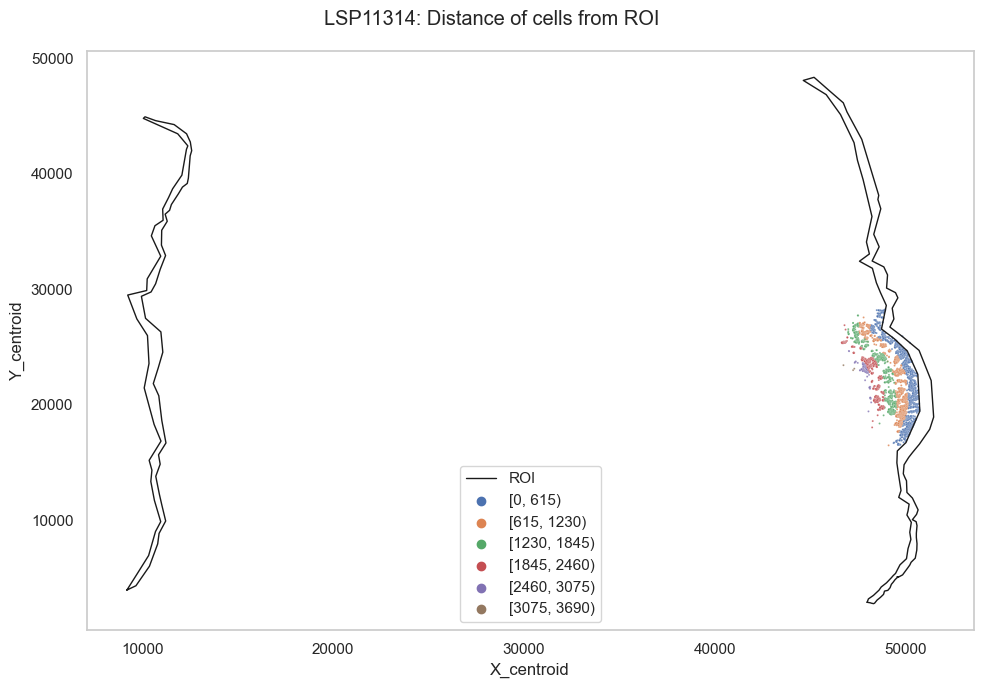

LSP11349
# of components: 2


4573it [00:00, 22601.36it/s]


Assigned points to region: ROI


4120it [00:00, 44260.14it/s]


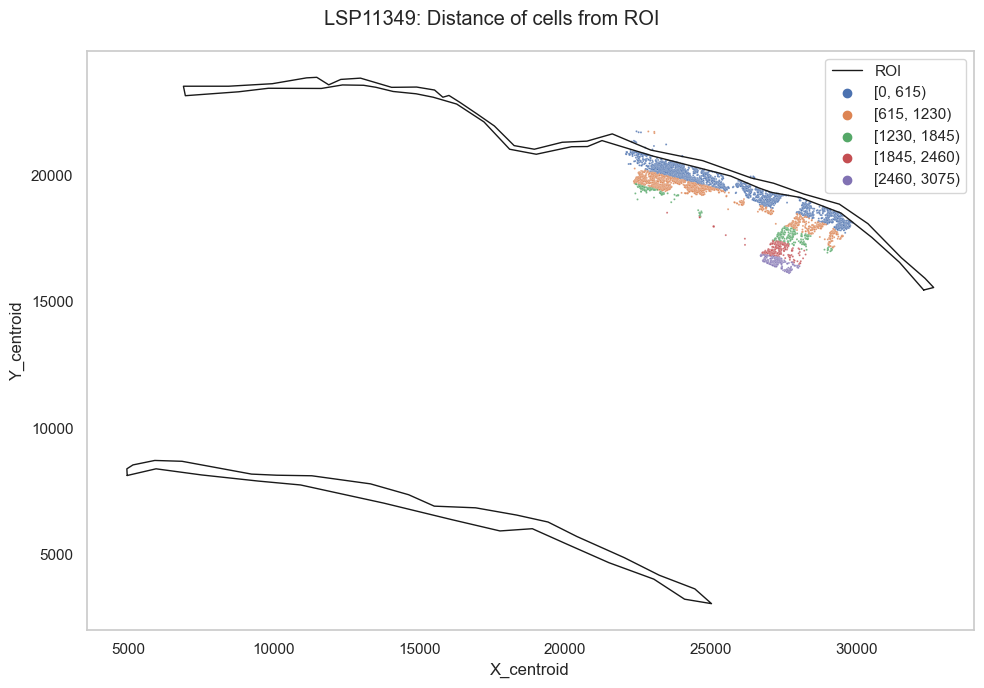

LSP11354
# of components: 2


8103it [00:00, 24928.87it/s]


Assigned points to region: ROI1


9623it [00:00, 30926.91it/s]


Assigned points to region: ROI2


8032it [00:00, 36936.76it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
10103it [00:00, 44971.20it/s]


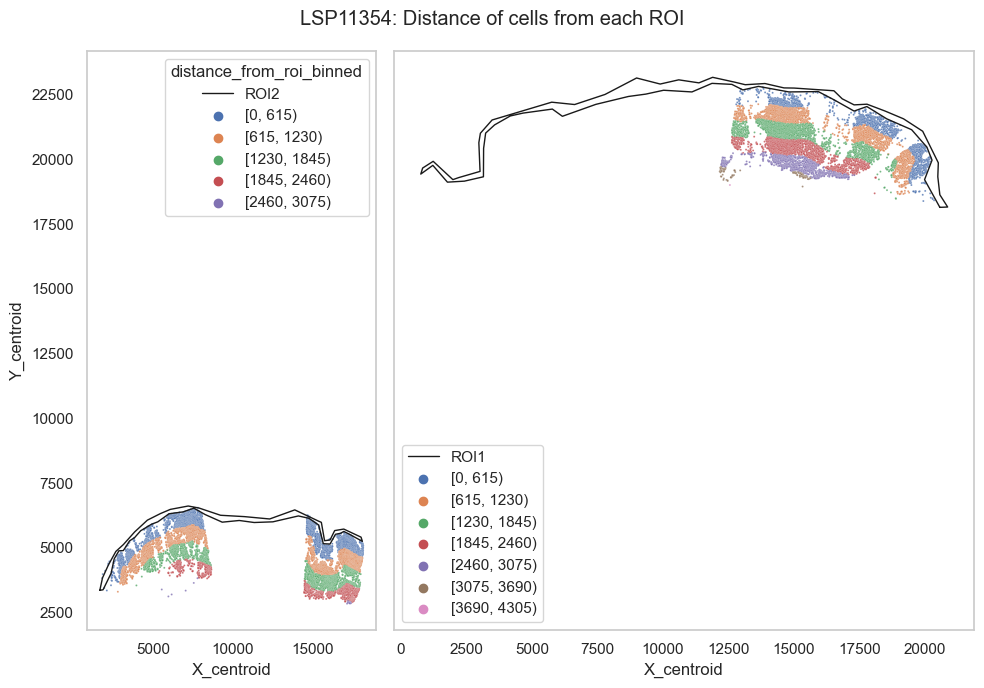

LSP11402
# of components: 2


4707it [00:00, 27888.87it/s]


Assigned points to region: ROI1


3816it [00:00, 27475.97it/s]


Assigned points to region: ROI2


4661it [00:00, 41756.61it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
5516it [00:00, 46576.73it/s]


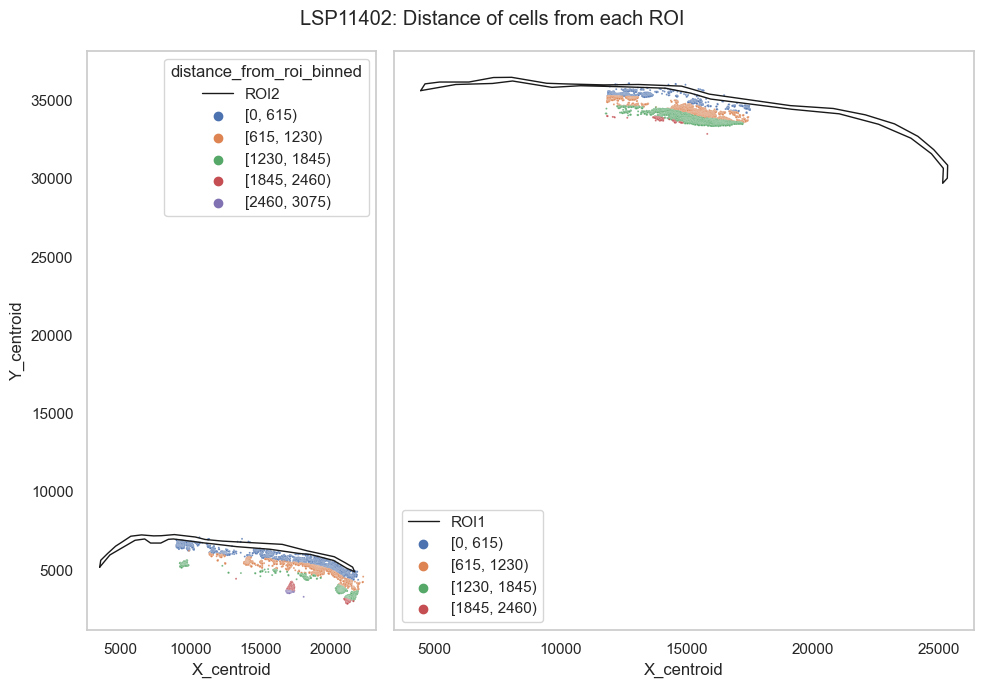

LSP11410
# of components: 2


3553it [00:00, 20911.58it/s]


Assigned points to region: ROI


3375it [00:00, 36111.40it/s]


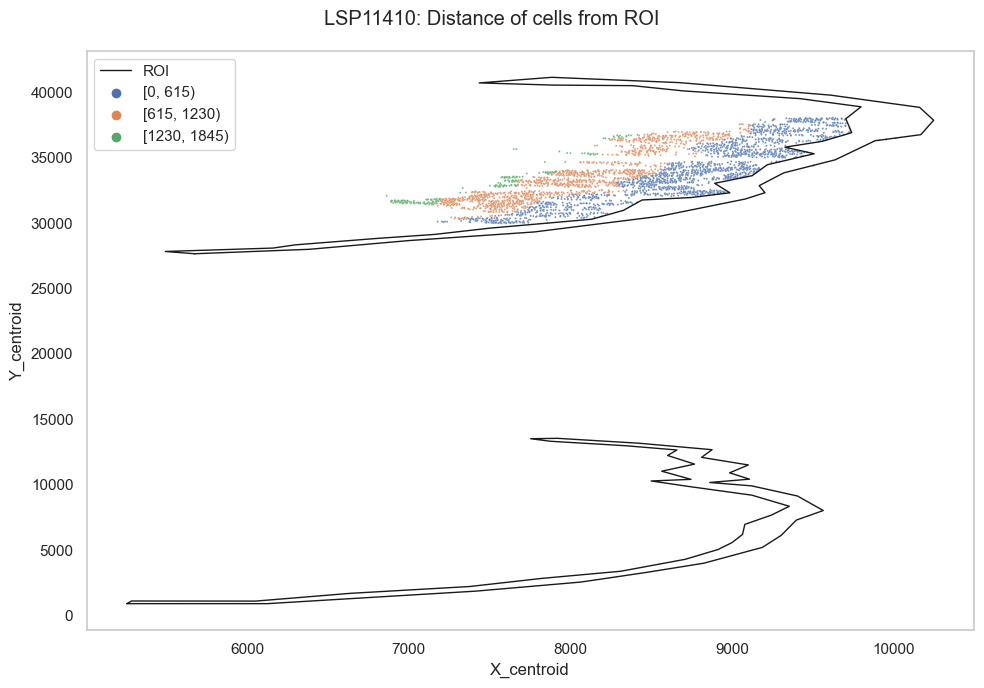

LSP11530
# of components: 2


1853it [00:00, 24091.82it/s]


Assigned points to region: ROI1


2288it [00:00, 10112.17it/s]


Assigned points to region: ROI2


1695it [00:00, 48435.05it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
1682it [00:00, 46586.45it/s]


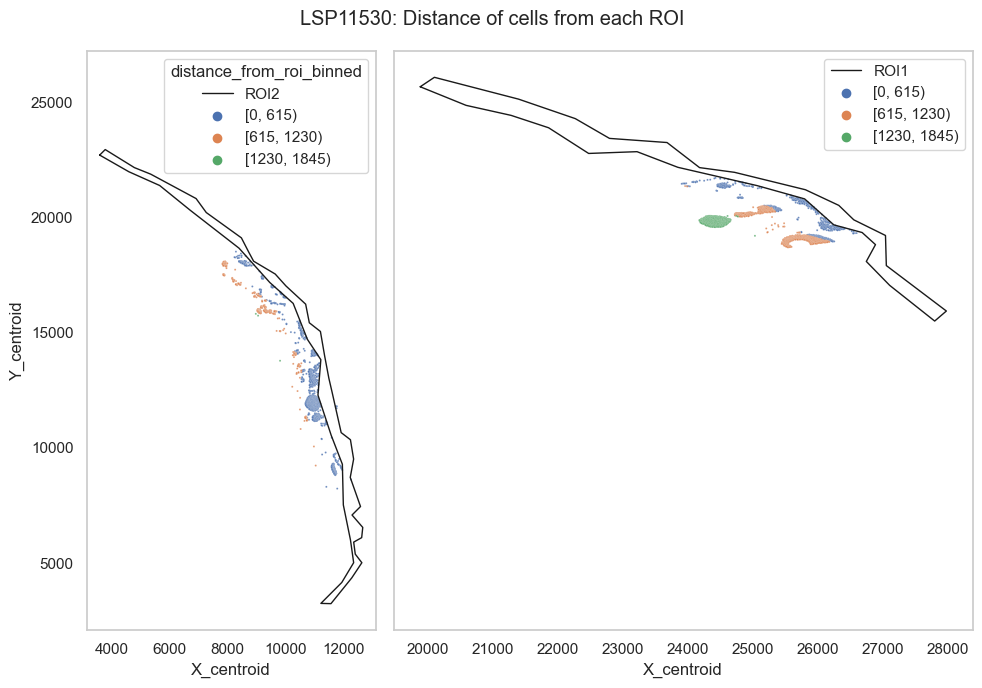

LSP11562
# of components: 1


5757it [00:00, 19133.42it/s]


Assigned points to region: ROI


5638it [00:00, 37637.55it/s]


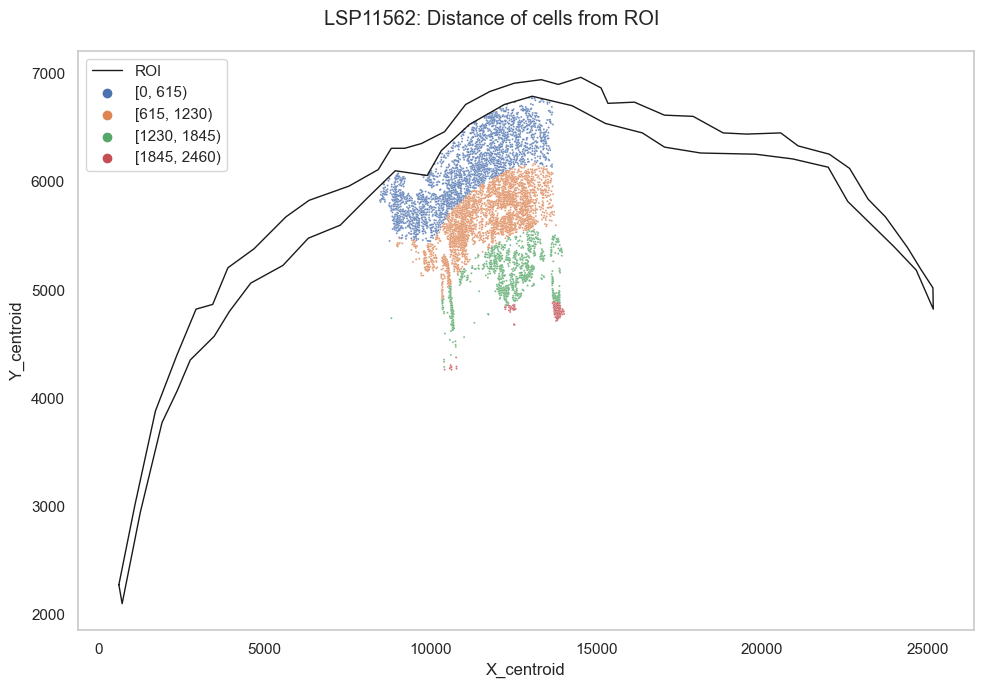

LSP11634
# of components: 1


8566it [00:00, 21380.79it/s]


Assigned points to region: ROI


7733it [00:00, 43152.11it/s]


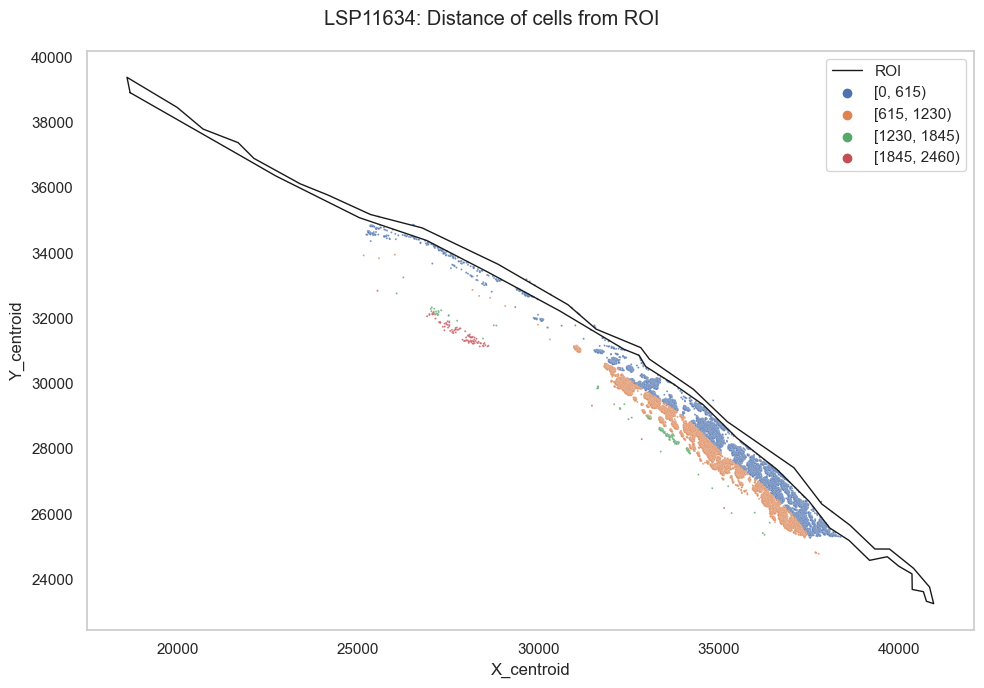

LSP11706
# of components: 2


1660it [00:00, 24802.01it/s]


Assigned points to region: ROI1


1866it [00:00, 27218.69it/s]


Assigned points to region: ROI2


1525it [00:00, 47906.36it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
1550it [00:00, 38912.39it/s]


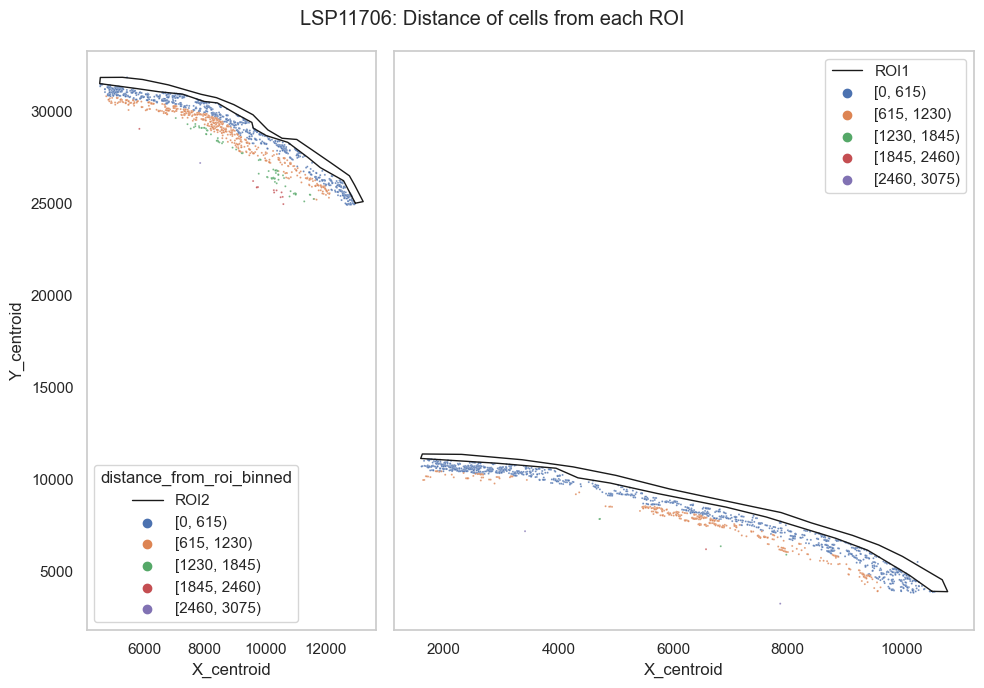

LSP11778
# of components: 1


1641it [00:00, 30817.41it/s]


Assigned points to region: ROI


1607it [00:00, 47617.43it/s]


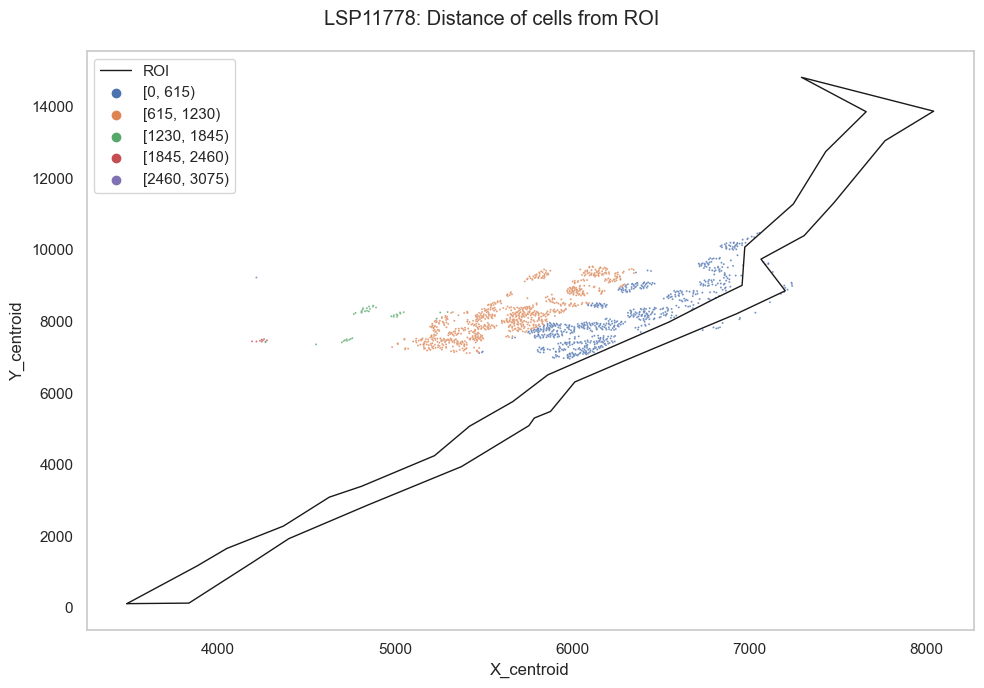

LSP11786
# of components: 1


9706it [00:00, 25177.43it/s]


Assigned points to region: ROI


9569it [00:00, 27981.40it/s]


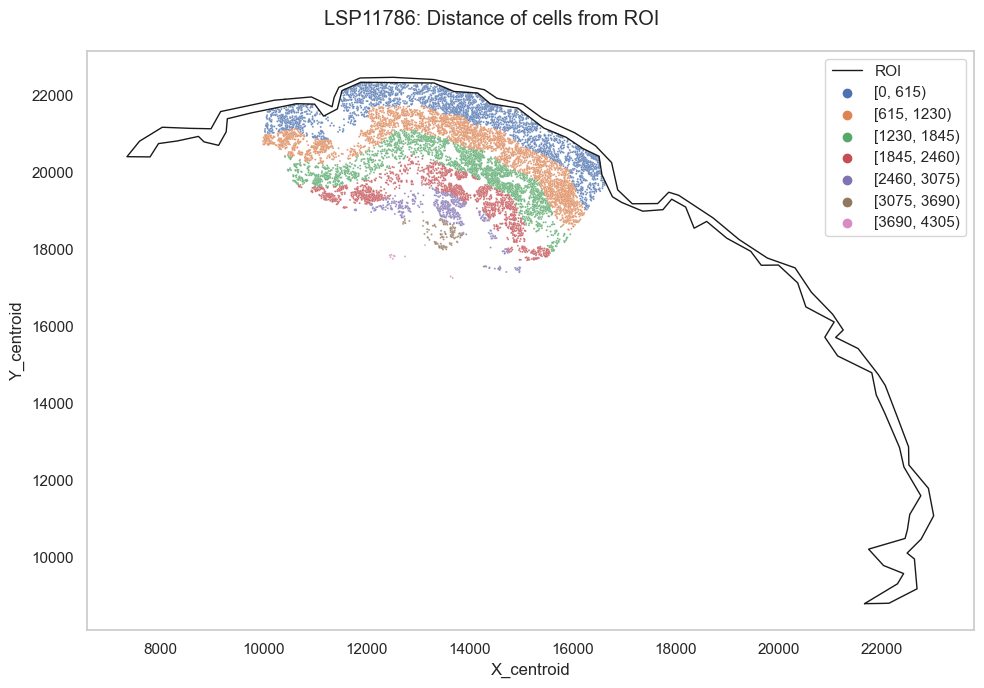

LSP11373
# of components: 1


5455it [00:00, 30491.04it/s]


Assigned points to region: ROI


5366it [00:00, 48529.84it/s]


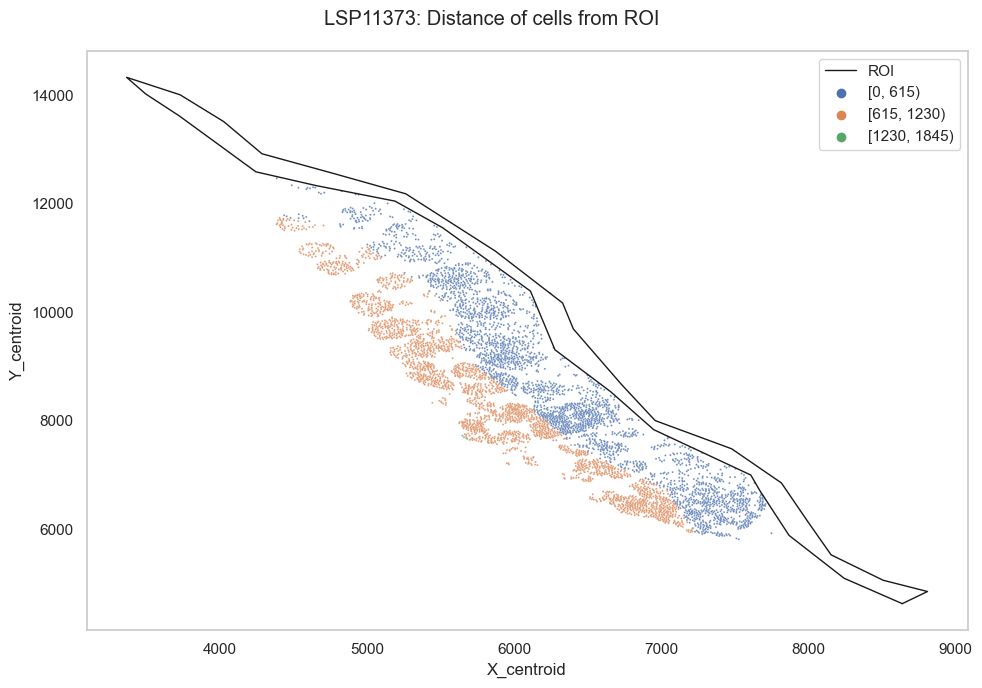

LSP11618
# of components: 1


2445it [00:00, 27503.82it/s]


Assigned points to region: ROI


1132it [00:00, 46174.18it/s]


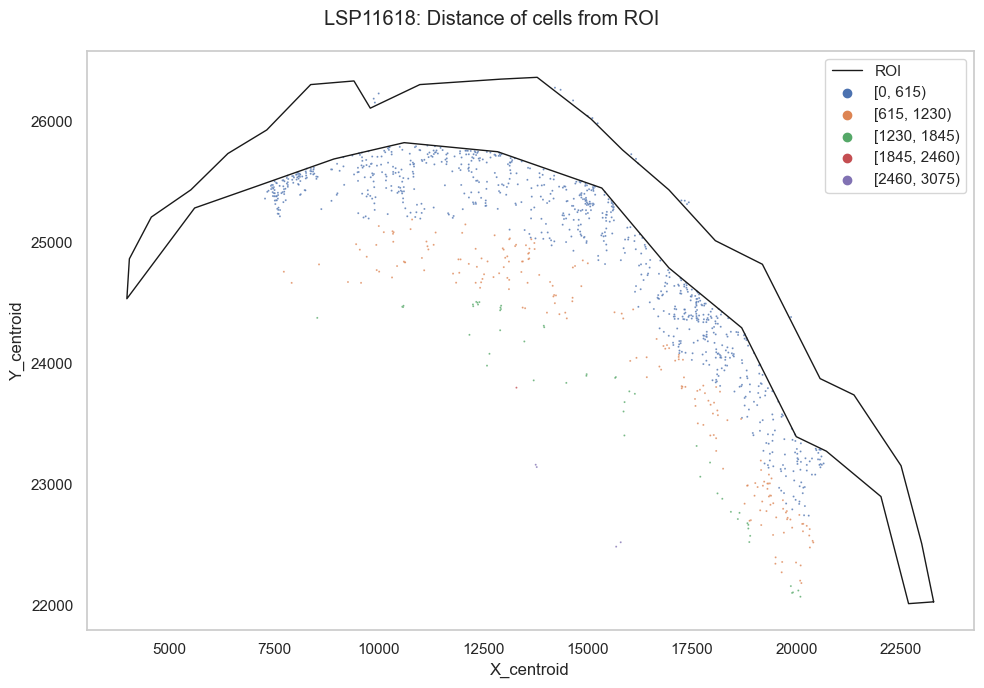

LSP11642
# of components: 1


14819it [00:00, 25684.62it/s]


Assigned points to region: ROI


14614it [00:00, 44796.09it/s]


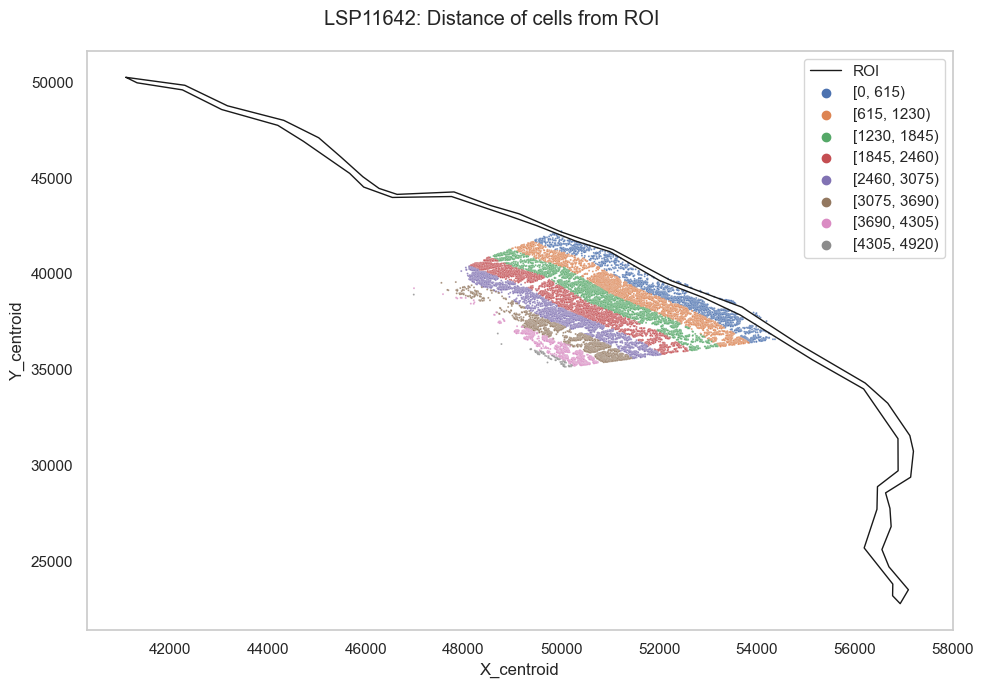

LSP11658
# of components: 2


7976it [00:00, 24160.03it/s]


Assigned points to region: ROI1


10762it [00:00, 29554.74it/s]


Assigned points to region: ROI2


11959it [00:00, 48876.86it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
14000it [00:00, 49606.33it/s]


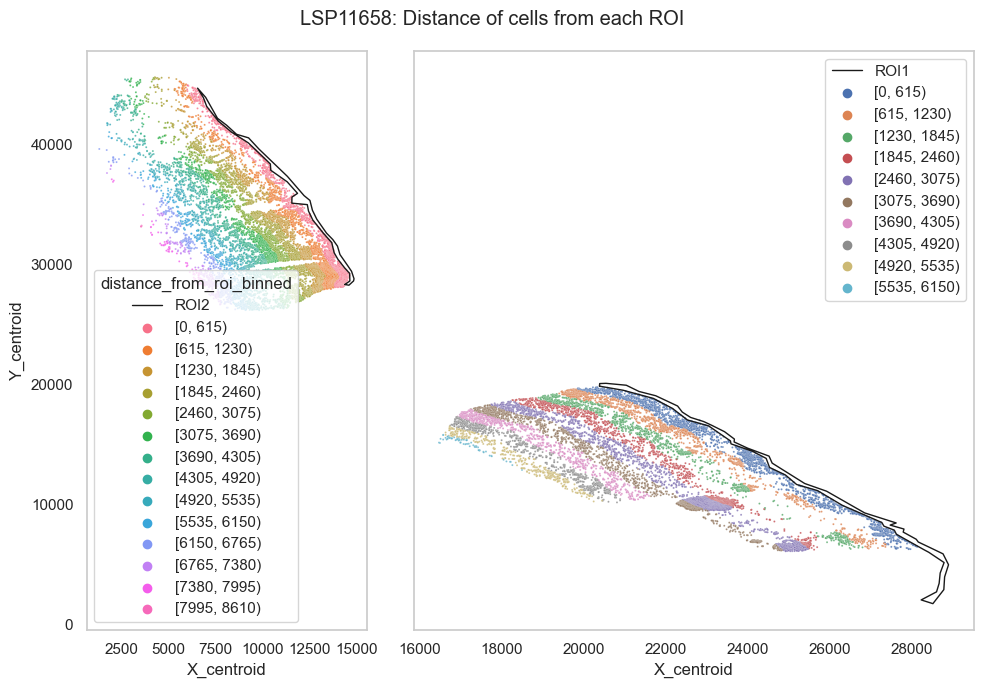

LSP11698
# of components: 2


1422it [00:00, 32557.82it/s]


Assigned points to region: ROI1


1595it [00:00, 28638.70it/s]


Assigned points to region: ROI2


1642it [00:00, 51939.30it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
4101it [00:00, 50885.85it/s]


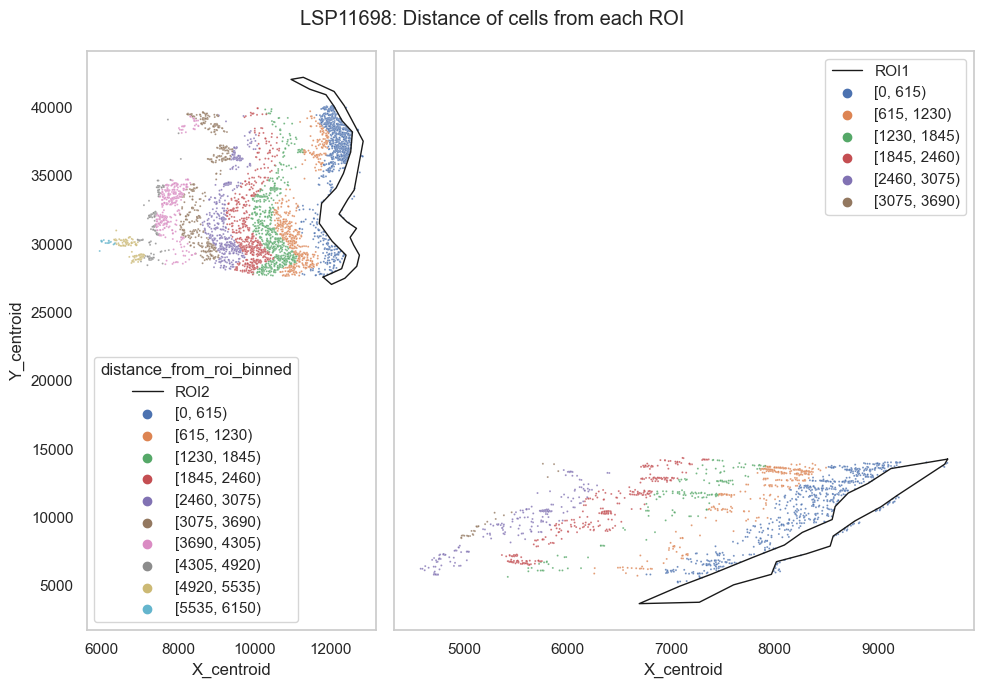

LSP11418
Skip sample without epidermal ROIs
LSP17170
Skip sample without epidermal ROIs
LSP13102
# of components: 1


16419it [00:00, 26011.08it/s]


Assigned points to region: ROI


14116it [00:00, 33107.46it/s]


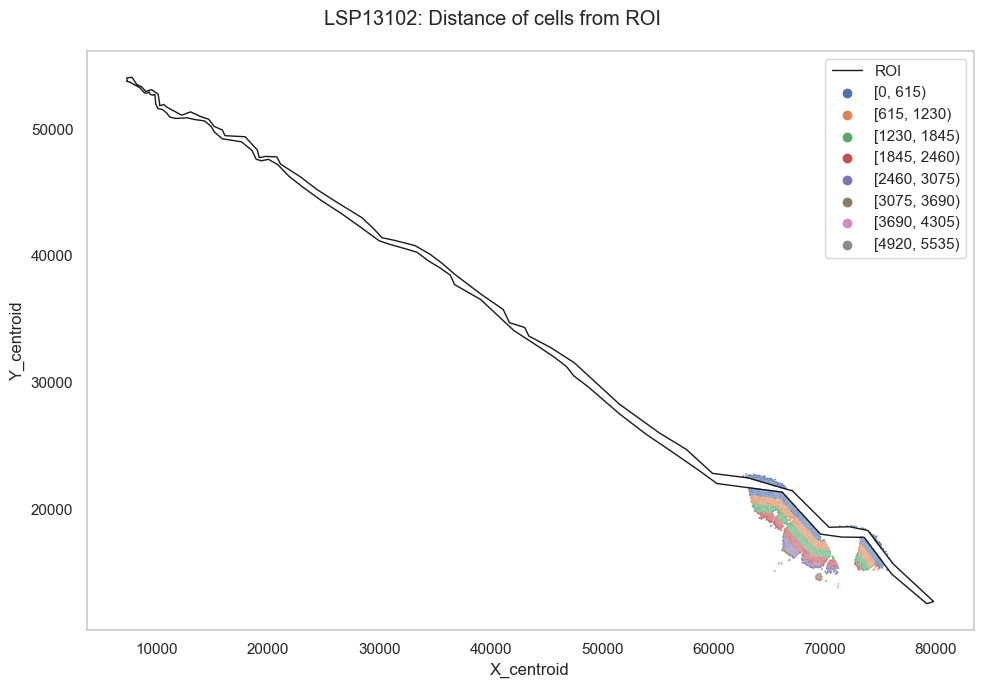

LSP15156
# of components: 1


139928it [00:05, 26609.04it/s]


Assigned points to region: ROI


137965it [00:02, 47550.85it/s]


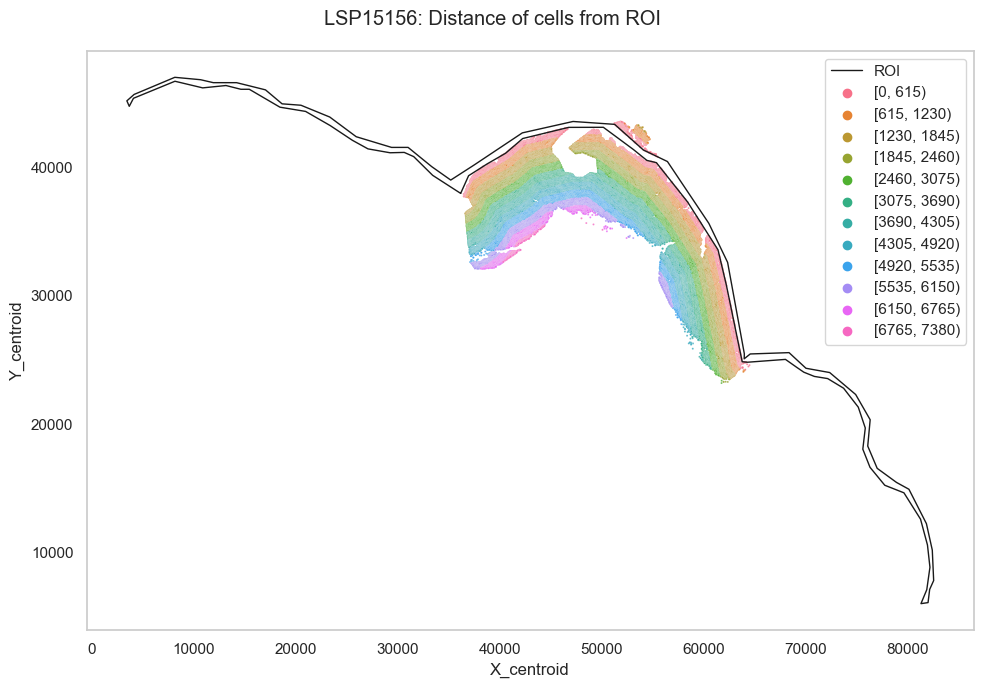

LSP13078
# of components: 1


60607it [00:02, 20788.49it/s]


Assigned points to region: ROI


176569it [00:04, 35661.48it/s]


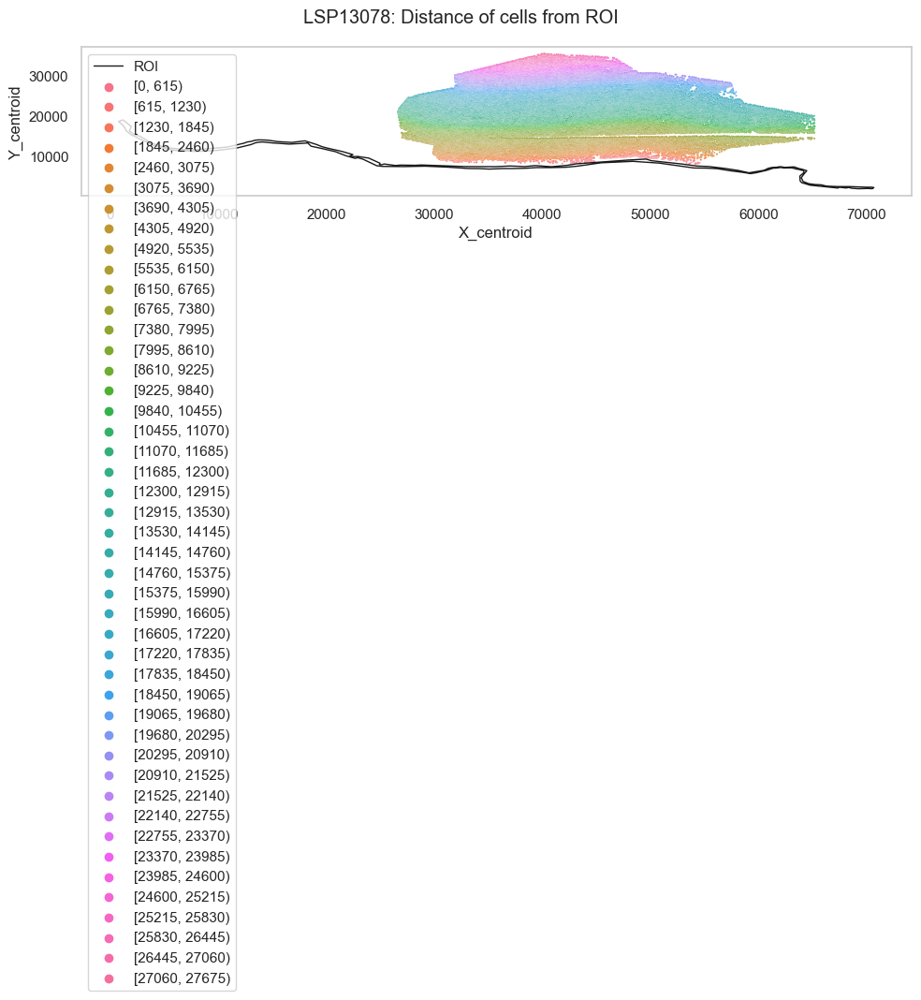

LSP13186
# of components: 1


12658it [00:00, 29235.95it/s]


Assigned points to region: ROI


149072it [00:03, 42107.98it/s]
/var/folders/4r/9bf8dywn1zb4b4pykp3mrbpm0000gn/T/ipykernel_41393/3502471480.py:136: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


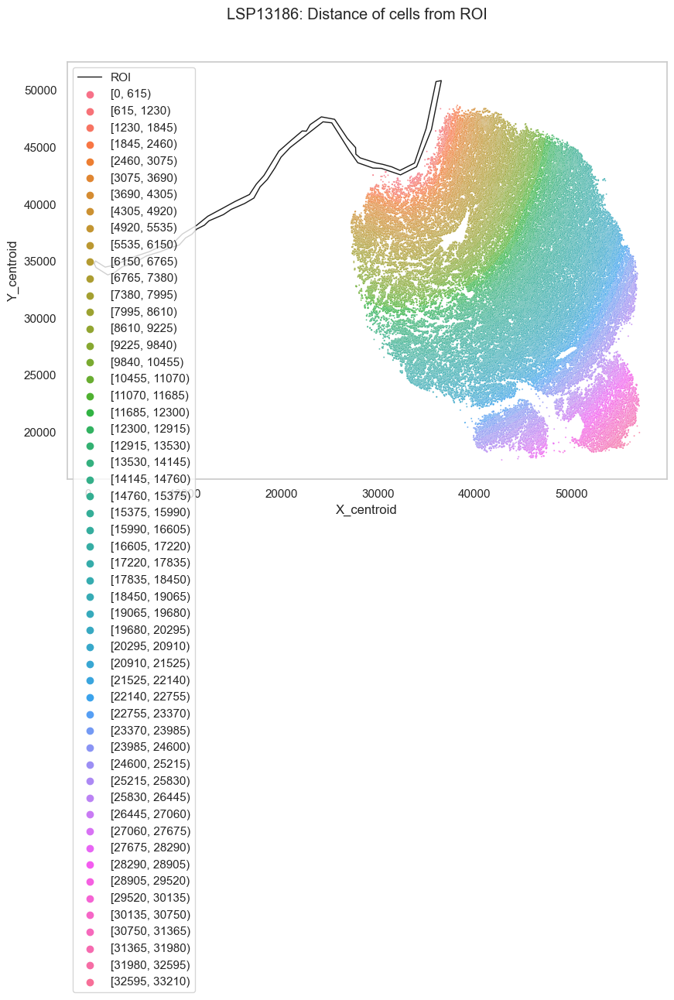

LSP15120
# of components: 2


13535it [00:00, 20760.92it/s]


Assigned points to region: ROI1


15631it [00:00, 26432.51it/s]


Assigned points to region: ROI2


13534it [00:00, 25749.24it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
14973it [00:00, 53327.75it/s]


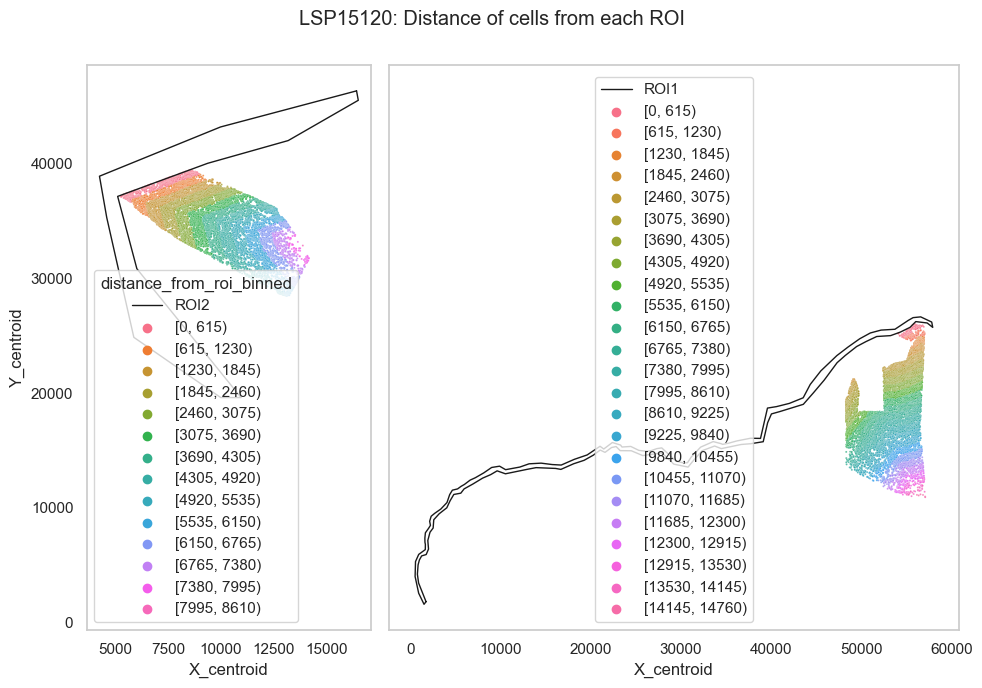

LSP15138
# of components: 2


14673it [00:01, 13256.71it/s]


Assigned points to region: ROI


18690it [00:00, 23495.55it/s]


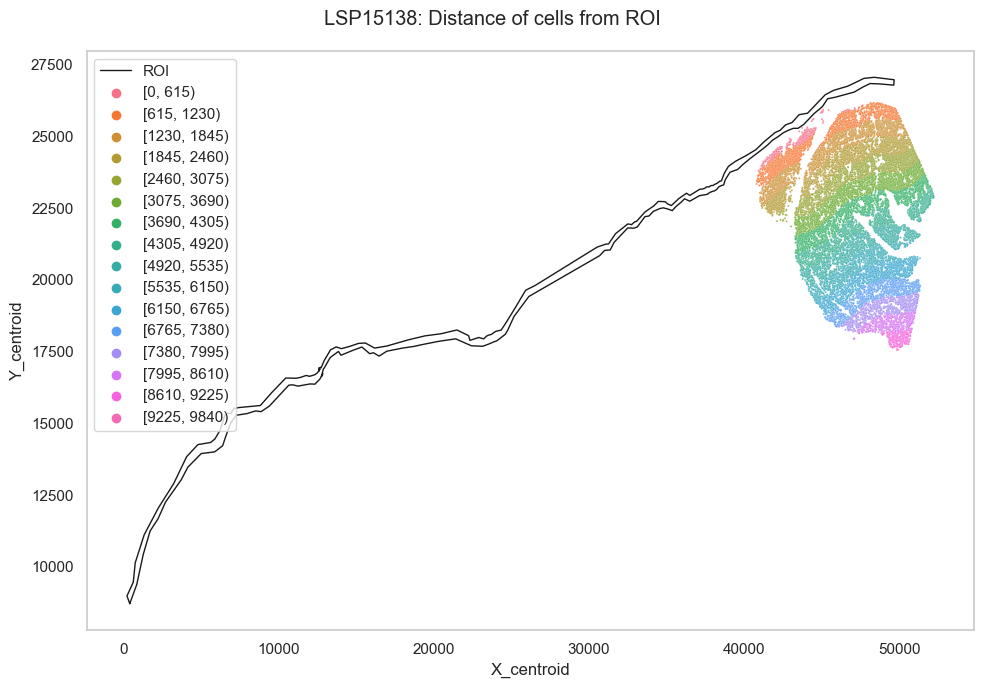

LSP15210
# of components: 2


41839it [00:01, 23052.75it/s]


Assigned points to region: ROI


41839it [00:00, 47862.22it/s]


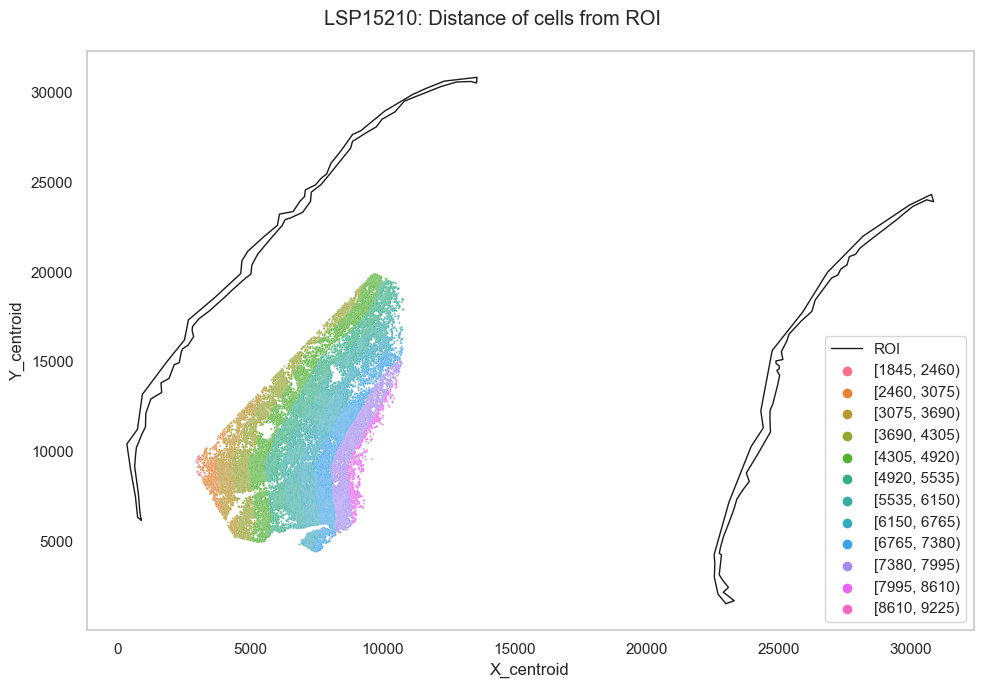

LSP15219_b
# of components: 2


12919it [00:00, 23597.17it/s]


Assigned points to region: ROI1


11321it [00:00, 27542.34it/s]


Assigned points to region: ROI2


12919it [00:00, 51778.71it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
11174it [00:00, 45191.11it/s]


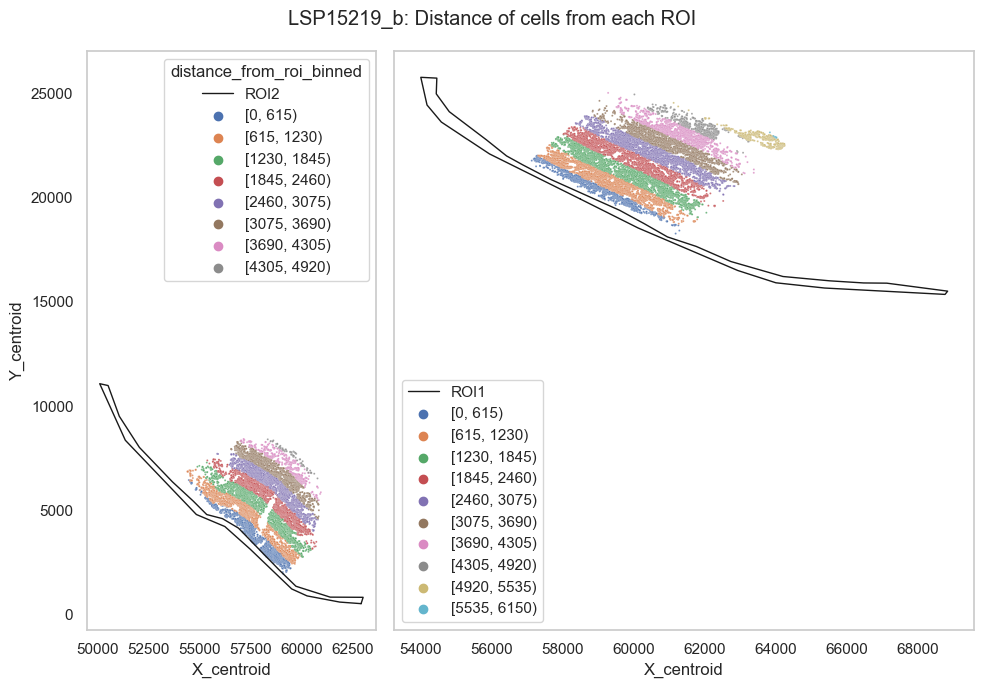

LSP15183
Skip sample without epidermal ROIs
LSP15129
# of components: 2


235413it [00:08, 28297.08it/s]


Assigned points to region: ROI1


160293it [00:05, 28073.04it/s]


Assigned points to region: ROI2


209687it [00:04, 44996.42it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
145180it [00:02, 49531.04it/s]


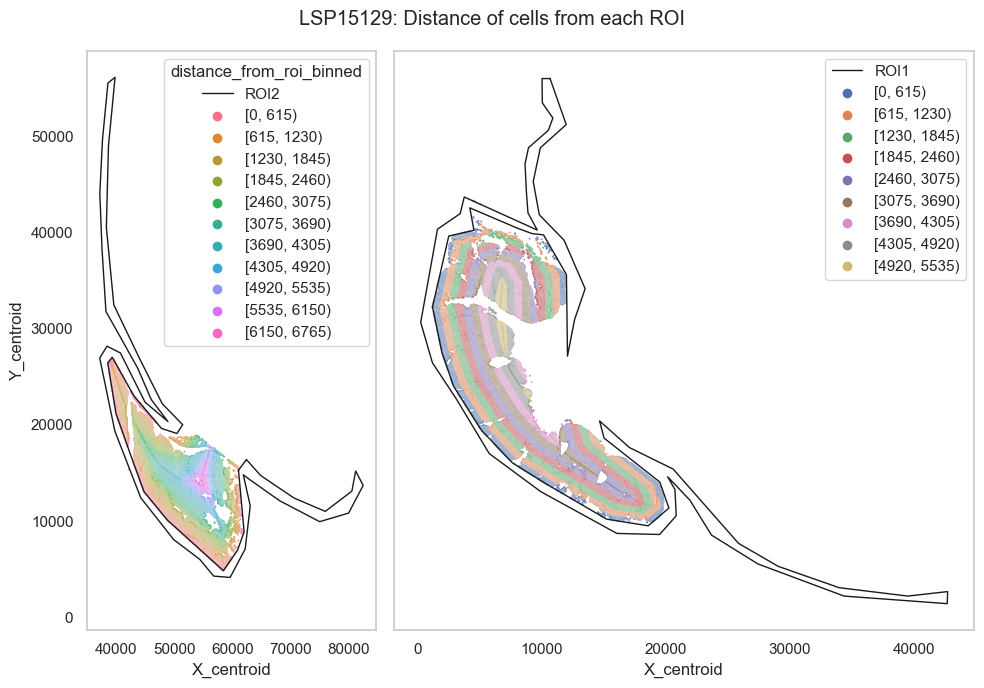

LSP13179
# of components: 2


64560it [00:02, 22903.62it/s]


Assigned points to region: ROI


62610it [00:01, 47137.28it/s]


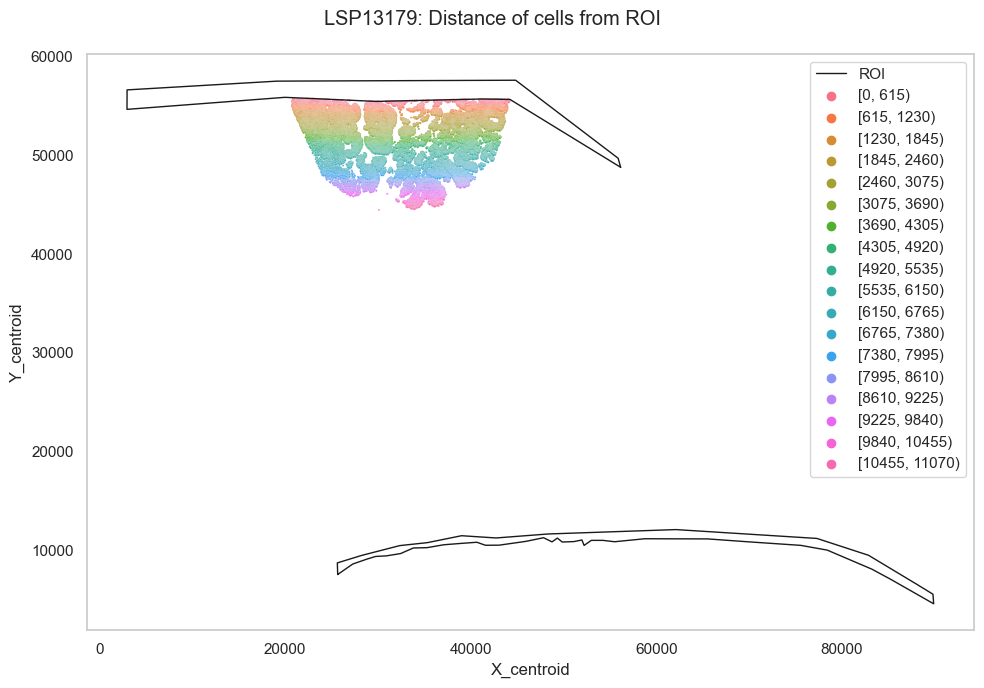

LSP15219_a
# of components: 2


205it [00:00, 26747.72it/s]

Assigned points to region: ROI1



16119it [00:00, 28731.44it/s]


Assigned points to region: ROI2


24144it [00:00, 49455.94it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
35876it [00:00, 52881.15it/s]


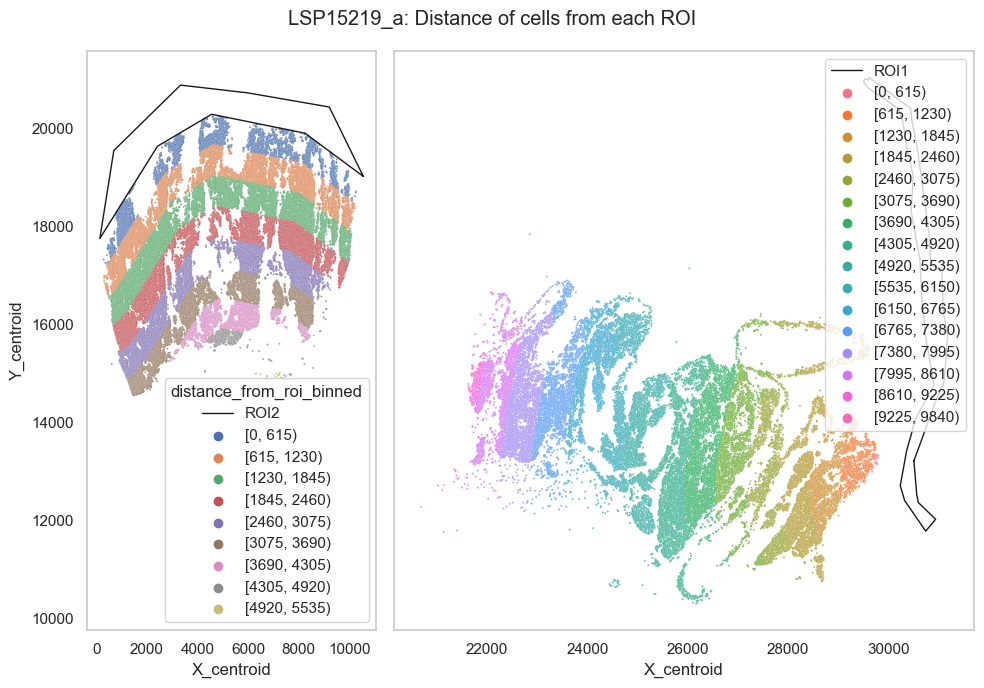

LSP15192
# of components: 2


11910it [00:00, 30205.74it/s]


Assigned points to region: ROI1


0it [00:00, ?it/s]


Assigned points to region: ROI2


265439it [00:05, 52682.36it/s]
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
107773it [00:01, 53962.59it/s]


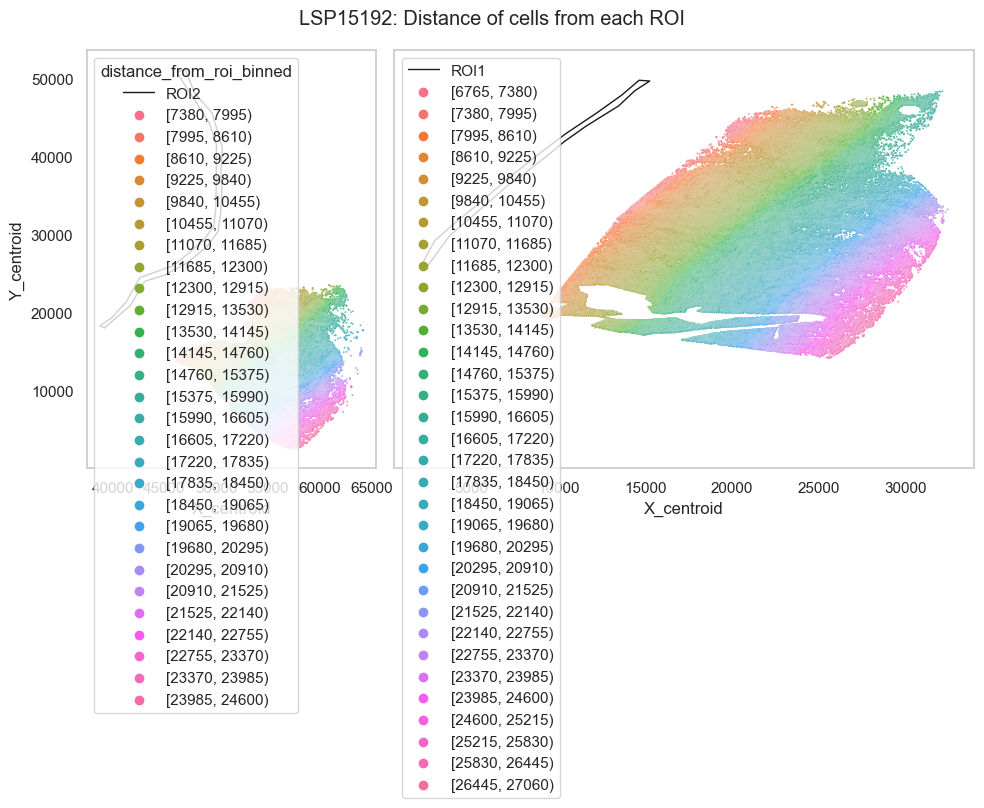

In [182]:
df = return_collated_distance_band_df(adata, roi_list, plot_ROI=True)

In [253]:
df

,band,marker_mean,band_mid,mm_mid,patient,LSP_id
0,"[0, 615)",0.731960,307.5,0.1,LSP11314,LSP11314
1,"[615, 1230)",0.700935,922.5,0.3,LSP11314,LSP11314
2,"[1230, 1845)",0.701514,1537.5,0.5,LSP11314,LSP11314
3,"[1845, 2460)",0.738169,2152.5,0.7,LSP11314,LSP11314
4,"[2460, 3075)",0.800823,2767.5,0.9,LSP11314,LSP11314
...,...,...,...,...,...,...
23,"[21525, 22140)",0.346759,21832.5,7.1,LSP15192_2,LSP15192
24,"[22140, 22755)",0.239188,22447.5,7.3,LSP15192_2,LSP15192
25,"[22755, 23370)",0.183052,23062.5,7.5,LSP15192_2,LSP15192
26,"[23370, 23985)",0.264361,23677.5,7.7,LSP15192_2,LSP15192


In [256]:
df['LSP_id'] = df['patient'].str.split('_').str[0]

In [257]:
df

,band,marker_mean,band_mid,mm_mid,patient,LSP_id
0,"[0, 615)",0.731960,307.5,0.1,LSP11314,LSP11314
1,"[615, 1230)",0.700935,922.5,0.3,LSP11314,LSP11314
2,"[1230, 1845)",0.701514,1537.5,0.5,LSP11314,LSP11314
3,"[1845, 2460)",0.738169,2152.5,0.7,LSP11314,LSP11314
4,"[2460, 3075)",0.800823,2767.5,0.9,LSP11314,LSP11314
...,...,...,...,...,...,...
23,"[21525, 22140)",0.346759,21832.5,7.1,LSP15192_2,LSP15192
24,"[22140, 22755)",0.239188,22447.5,7.3,LSP15192_2,LSP15192
25,"[22755, 23370)",0.183052,23062.5,7.5,LSP15192_2,LSP15192
26,"[23370, 23985)",0.264361,23677.5,7.7,LSP15192_2,LSP15192


In [271]:
df2 = adata.obs[['imageid_raw', 'MEL_id', 'Breslow_bucket']]
MEL_LSP_ids = list(df2.groupby('MEL_id')['imageid_raw'].value_counts().to_dict().keys())

In [287]:
df3 = pd.DataFrame(MEL_LSP_ids, columns=['MEL_id', 'LSP_id'])

In [301]:
df3

,MEL_id,LSP_id
0,MEL14,LSP11314
1,MEL18,LSP11349
2,MEL19,LSP11354
3,MEL21,LSP11373
4,MEL25,LSP11402
5,MEL26,LSP11410
6,MEL27,LSP11418
7,MEL40,LSP11530
8,MEL44,LSP11562
9,MEL51,LSP11618


In [311]:
df_breslow = pd.merge(df, df3, on='LSP_id', how='left')
df_breslow.loc[(df_breslow['patient'] == 'LSP15219_b_1') | (df_breslow['patient'] == 'LSP15219_b_2'), 'MEL_id'] = 'MEL85'
df_breslow.loc[(df_breslow['patient'] == 'LSP15219_a_1') | (df_breslow['patient'] == 'LSP15219_a_2'), 'MEL_id'] = 'MEL86'

In [315]:
Breslow_less_than_1mm = ['MEL15','MEL16','MEL17','MEL21','MEL26','MEL30','MEL36','MEL38','MEL40','MEL41','MEL42','MEL43','MEL44','MEL49','MEL50','MEL52','MEL53','MEL56','MEL60','MEL61','MEL62','MEL63','MEL66','MEL67']
Breslow_1_to_2mm=['MEL14','MEL18','MEL19','MEL22','MEL23','MEL24','MEL25','MEL27','MEL45','MEL47','MEL48','MEL51','MEL54','MEL59','MEL64','MEL65','MEL68','MEL69']
Breslow_2_to_4mm=['MEL20','MEL55','MEL58', 'MEL76','MEL84','MEL73','MEL78','MEL85','MEL81','MEL86']
Breslow_more_than_4mm = ['MEL72','MEL70','MEL82','MEL71','MEL74','MEL83','MEL75']

def apply_status(image_id):
    if image_id in Breslow_less_than_1mm:
        return 'Breslow_less_than_1mm'
    elif image_id in Breslow_1_to_2mm:
        return 'Breslow_1_to_2mm'
    elif image_id in Breslow_2_to_4mm:
        return 'Breslow_2_to_4mm'
    elif image_id in Breslow_more_than_4mm:
        return 'Breslow_more_than_4mm'
    else:
        return 'MIS'        
## Define morphology groups
morphology_groups = ['MIS',  'Breslow_less_than_1mm', 'Breslow_1_to_2mm', 'Breslow_2_to_4mm', 'Breslow_more_than_4mm']
 # Add the recurrence_status column
df_breslow['Breslow_bucket'] = df_breslow['MEL_id'].apply(apply_status)

In [316]:
df_breslow['Breslow_bucket'].unique().tolist()

['Breslow_1_to_2mm',
 'Breslow_less_than_1mm',
 'Breslow_2_to_4mm',
 'Breslow_more_than_4mm']

In [322]:
df_breslow

,band,marker_mean,band_mid,mm_mid,patient,LSP_id,MEL_id,Breslow_bucket
0,"[0, 615)",0.731960,307.5,0.1,LSP11314,LSP11314,MEL14,Breslow_1_to_2mm
1,"[615, 1230)",0.700935,922.5,0.3,LSP11314,LSP11314,MEL14,Breslow_1_to_2mm
2,"[1230, 1845)",0.701514,1537.5,0.5,LSP11314,LSP11314,MEL14,Breslow_1_to_2mm
3,"[1845, 2460)",0.738169,2152.5,0.7,LSP11314,LSP11314,MEL14,Breslow_1_to_2mm
4,"[2460, 3075)",0.800823,2767.5,0.9,LSP11314,LSP11314,MEL14,Breslow_1_to_2mm
...,...,...,...,...,...,...,...,...
449,"[21525, 22140)",0.346759,21832.5,7.1,LSP15192_2,LSP15192,MEL82,Breslow_more_than_4mm
450,"[22140, 22755)",0.239188,22447.5,7.3,LSP15192_2,LSP15192,MEL82,Breslow_more_than_4mm
451,"[22755, 23370)",0.183052,23062.5,7.5,LSP15192_2,LSP15192,MEL82,Breslow_more_than_4mm
452,"[23370, 23985)",0.264361,23677.5,7.7,LSP15192_2,LSP15192,MEL82,Breslow_more_than_4mm


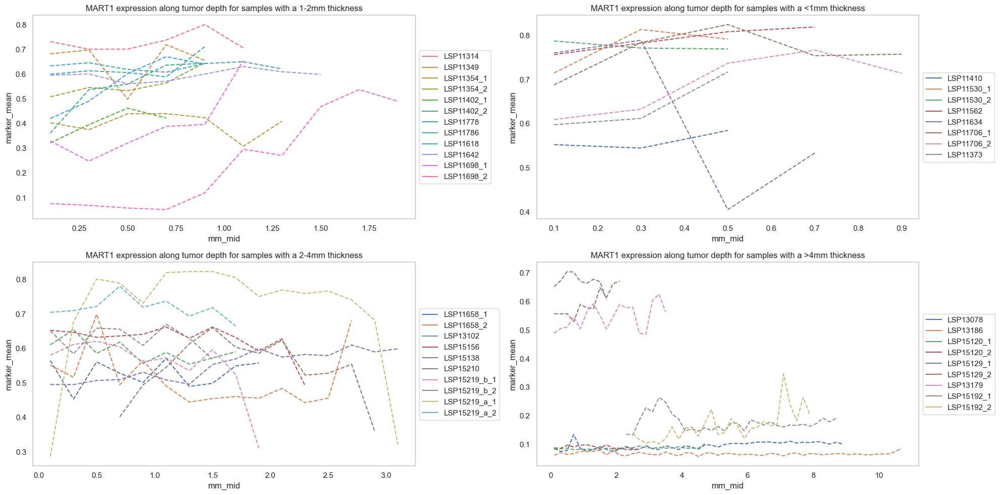

In [353]:
fig, axs = plt.subplots(2, 2, figsize=(20, 10))
breslow_list = df_breslow['Breslow_bucket'].unique().tolist()
breslow_group_dict = {k:None for k in df_breslow['Breslow_bucket'].unique().tolist()}
breslow_group_dict['Breslow_1_to_2mm'] = '1-2mm'
breslow_group_dict['Breslow_less_than_1mm'] = '<1mm'
breslow_group_dict['Breslow_2_to_4mm'] = '2-4mm'
breslow_group_dict['Breslow_more_than_4mm'] = '>4mm'
k = 0
axs = axs.ravel()
for i in range(4):
    sns.lineplot(data=df_breslow[df_breslow['Breslow_bucket'] == breslow_list[k]], x='mm_mid', y='marker_mean', hue='patient', linestyle='--', ax=axs[i])
    axs[i].set_title(f'MART1 expression along tumor depth for samples with a {breslow_group_dict[breslow_list[k]]} thickness')
    axs[i].legend(loc='center left', bbox_to_anchor=(1, 0.5))
    k += 1

plt.tight_layout()
plt.savefig(f"/Users/ediknovik/Dropbox/Harvard-University/Sorger-HMS-Postdoc/PCA-Melanoma-Analysis/figures/e41_stage2_combined_analysis/MART1_expression_along_breslow_depth_sampples_in_4_buckets.pdf", format="pdf", bbox_inches="tight")   

### Spatial Entropy of VGP regions grouped across thickness buckets

In [4]:
adata = scanpy.read_h5ad('/Users/ediknovik/Dropbox/Harvard-University/Sorger-HMS-Postdoc/PCA-Melanoma-Analysis/data/merged_e41_stage2/tumor_subsetMERGED_V5_VGP_only_split_regions_for_spatial_analysis_updated.h5ad')
adata

AnnData object with n_obs × n_vars = 1649213 × 16
    obs: 'X_centroid', 'Y_centroid', 'Area', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity', 'Solidity', 'Extent', 'Orientation', 'CellID', 'imageid', 'batch', 'LOSE', 'phenotype', 'MART1pos', 'SOX9pos', 'PRAMEpos', 'NGFRpos', 'MEL_id', 'Breslow', 'TIL', 'sun_damage', 'S100A1pos', 'Ki67pos', 'ROI_major_category', 'imageid_raw', 'ROI_major_category_index', 'phenotype_tum'
    layers: 'log', 'rescaled'

In [5]:
adata.obs.ROI_major_category_index.unique().tolist()

['VGP_1', 'VGP_2', 'VGP_3', 'VGP_4', 'VGP']

In [6]:
adata.obs.groupby('MEL_id')['imageid_raw'].value_counts()

MEL_id  imageid_raw
MEL14   LSP11314         3888
MEL18   LSP11349         4573
MEL19   LSP11354        18383
MEL21   LSP11373         5455
MEL25   LSP11402        10419
MEL26   LSP11410         3553
MEL27   LSP11418         6232
MEL40   LSP11530         4141
MEL44   LSP11562         5757
MEL51   LSP11618         2445
MEL53   LSP11634         7749
MEL54   LSP11642        14819
MEL55   LSP11658        26284
MEL59   LSP11698         6287
MEL60   LSP11706         3549
MEL68   LSP11778         1641
MEL69   LSP11786         9706
MEL70   LSP13078       176569
MEL71   LSP13179        64560
MEL72   LSP13186       149072
MEL73   LSP13102        16419
MEL74   LSP15120        29166
MEL75   LSP15129       373970
MEL76   LSP15138        18690
MEL78   LSP15156       139928
MEL81   LSP15183        46275
MEL82   LSP15192       373212
MEL84   LSP15210        41839
MEL85   LSP15219_b      24240
MEL86   LSP15219_a      60392
Name: imageid_raw, dtype: int64

In [7]:
adata[adata.obs.imageid_raw =='LSP11373'].obs.ROI_major_category_index

LSP11373--unmicst_cellRing_5494-0-0     VGP_2
LSP11373--unmicst_cellRing_5537-0-0     VGP_2
LSP11373--unmicst_cellRing_5612-0-0     VGP_2
LSP11373--unmicst_cellRing_5621-0-0     VGP_2
LSP11373--unmicst_cellRing_5632-0-0     VGP_2
                                        ...  
LSP11373--unmicst_cellRing_24716-0-0      VGP
LSP11373--unmicst_cellRing_24744-0-0      VGP
LSP11373--unmicst_cellRing_24752-0-0      VGP
LSP11373--unmicst_cellRing_24753-0-0      VGP
LSP11373--unmicst_cellRing_24769-0-0      VGP
Name: ROI_major_category_index, Length: 5455, dtype: category
Categories (2, object): ['VGP', 'VGP_2']

In [ ]:
# Write a function that finds entropy for each VGP region per MELid.
# Save in df with MELid_VGP# and then run Breslow_bucket function. Make bar graph across 4 Breslow buckets

In [8]:
def less_first(a, b):
    return [a,b] if a < b else [b,a]

def delaunay2edges(tri):

    list_of_edges = []

    for triangle in tri.simplices:
        for e1, e2 in [[0,1],[1,2],[2,0]]: # for all edges of triangle
            list_of_edges.append(less_first(triangle[e1],triangle[e2])) # always lesser index first

    array_of_edges = np.unique(list_of_edges, axis=0) # remove duplicates

    list_of_lengths = []

    for p1,p2 in array_of_edges:
        x1, y1 = tri.points[p1]
        x2, y2 = tri.points[p2]
        list_of_lengths.append((x1-x2)**2 + (y1-y2)**2)

    array_of_lengths = np.sqrt(np.array(list_of_lengths))

    return array_of_edges, array_of_lengths

In [9]:
def make_graph(df, node_attribute_name='lineage_grouped', plot_graph=False):
    coordinates = np.column_stack((df['X_centroid'], df['Y_centroid']))
    tri = Delaunay(coordinates)

    edges, lengths = delaunay2edges(tri)
    # pruning the graph can be done later - use full graph from Delaunay tri for now
    ''' 
    criterion = np.argwhere(lengths < 30).flatten() # can convert pixels to microns
    selected_edges = edges[criterion]
    print('Removed', len(edges) - len(selected_edges), 'edges')
    '''
    cellids = df['CellID'].reset_index(drop=True)
    
    # map cellids to nodes that connect edges
    for i, (ind1, ind2) in enumerate(edges):
        edges[i] = [cellids[ind1], cellids[ind2]]
    
    # create graph object
    G = nx.Graph()
    G.add_nodes_from(cellids)
    G.add_edges_from(edges) # G.add_edges_from(selected_edges)

    if plot_graph:
        nx.draw(G, with_labels=False, node_size=5, node_color='lightgreen')

    # add weights to graph edges
    for i, e in enumerate(G.edges()):
        G[e[0]][e[1]]['weight'] = lengths[i]

    lineages = df[node_attribute_name]
    lineages.index = df['CellID']
    # add attribute to each node
    nx.set_node_attributes(G, lineages, name=node_attribute_name)
    ### G.nodes[5510]['lineage2'] # example how to access node attribute

    graph_dict = nx.to_dict_of_dicts(G)

    # calculate average num nhbrs across cells
    num_nbhrs = []
    for k, v in graph_dict.items():
        num_nbhrs.append(len(v))
    print(f'Average number of neighbors per cell = {np.mean(num_nbhrs)}')

    return G, graph_dict

In [10]:
def calculate_spatial_entropy(df, G, graph_dict, node_attribute_name='lineage_grouped', base=None):
    lineage_list = df[node_attribute_name].unique().tolist() # E.g. # lineage_list = ['MART1+ MITF- SOX9+', 'MART1- MITF- SOX9-', 'MART1+ MITF- SOX9-', 'MART1+ MITF+ SOX9+', 'MART1+ MITF+ SOX9-', 'MART1- MITF+ SOX9+', 'MART1- MITF+ SOX9-', 'MART1- MITF- SOX9+']
    spatial_entropy_dict = dict.fromkeys(lineage_list)

    for i, lineage_name in enumerate(lineage_list):
        # nodes for class i
        nodes_class_i = [x for x,y in G.nodes(data=True) if y[node_attribute_name]==lineage_list[i]] # will need unique lineage2 strings to loop through
        # print(f'Number of nodes with lineage {lineage_name}  = {len(nodes_class_i)}')

        neighbor_i_dicts_list = [graph_dict[x] for x in nodes_class_i]
        compare_lineages = copy.deepcopy(lineage_list)
        del compare_lineages[i]

        L_ik = dict.fromkeys(compare_lineages, 0) # count of neighbors where lineage k != i
        d_ik = dict.fromkeys(compare_lineages, 0) # average distance between neighbors where lineage k != i
        for nhbrs_dict in neighbor_i_dicts_list:
            for cell, edge in nhbrs_dict.items():
                # access node attribute
                attribute = G.nodes[cell][node_attribute_name]
                if attribute != lineage_list[i]:
                    L_ik[attribute] += 1
                    d_ik[attribute] += edge['weight']

        # for attribute, count in L_ik.items():
        #     if count != 0:
        #         d_ik[attribute] /= count

        L_i = sum(L_ik.values()) * 100 # scaling factor for vizualization
        # L_i /= G.number_of_edges()
        d_i = sum(d_ik.values())

        spatial_entropy_dict[lineage_name] = {'L_i': L_i, 'd_i': d_i}
    # print(spatial_entropy_dict)
    lineages = df[node_attribute_name]
    p = lineages.value_counts(normalize=True, sort=False) # proportion of lineage counts

    spatial_entropy_df = pd.DataFrame.from_dict(spatial_entropy_dict, orient='index')
    spatial_entropy_df['ratio_i'] = spatial_entropy_df['L_i'] / spatial_entropy_df['d_i']
    # print(spatial_entropy_df)
    w = pd.merge(spatial_entropy_df, p, how='inner', left_index=True, right_index=True)
    w = w.drop(columns=['L_i', 'd_i'])
    # print(w)
    base = 2 if base is None else base
    H_spatial = -(w['ratio_i'] * w[node_attribute_name] * np.log(w[node_attribute_name])/np.log(base)).sum()

    return H_spatial

In [26]:
# https://levelup.gitconnected.com/statistics-on-seaborn-plots-with-statannotations-2bfce0394c00
# https://github.com/trevismd/statannotations-tutorials/blob/main/Tutorial_1/Statannotations-Tutorial-1.ipynb
# https://stackoverflow.com/questions/36578458/how-does-one-insert-statistical-annotations-stars-or-p-values
from utils import *
from statannotations.Annotator import Annotator
from scipy.stats import mannwhitneyu

def heterogeneity_per_sample_with_p_values_across_Breslow_buckets(adata, node_attribute_name, violin_plot=False):
    adata = adata[adata.obs.phenotype_tum != 'SOX10-SOX9+']
    adata = adata[adata.obs.phenotype_tum != 'Epidermis']
    adata = adata[adata.obs.phenotype_tum != 'Unknown']
    adata = adata[adata.obs.phenotype_tum != 'SOX10+SOX9+NGFR+']
    print(f'Unique phenotypes for analysis: {adata.obs.phenotype_tum.unique().tolist()}')
    
    sample_list = adata.obs.imageid.unique().tolist()
    H_spatial_dict = {}
    for sample in sample_list:
        #print(roi, sample_list)
        sample_df = adata[adata.obs.imageid == sample]
        roi_list = sample_df.obs.ROI_major_category_index.unique().tolist()
        #print(f'{sample}: {roi_list}')
        roi_dict = {}
        for roi_name in roi_list:
            df = sample_df[sample_df.obs.ROI_major_category_index == roi_name].obs
            if df.shape[0] == 0:
                continue
            G, graph_dict = make_graph(df, node_attribute_name=node_attribute_name)
            H_spatial = calculate_spatial_entropy(df, G, graph_dict, node_attribute_name=node_attribute_name)
            roi_dict[roi_name] = H_spatial
        H_spatial_dict[sample] = roi_dict

    breslow_list = []
    for sample_name, roi_values_dict in H_spatial_dict.items():
        for roi_name, roi_value in roi_values_dict.items():
            if ('LSP15219_a_right' in sample_name) or ('LSP15219_a_left' in sample_name):
                sample_short_name = 'LSP15219_a'
            elif ('LSP15219_b_upper' in sample_name) or ('LSP15219_b_lower' in sample_name):
                sample_short_name = 'LSP15219_b'
            else:
                sample_short_name = sample_name.split('_')[0]
            breslow_list.append( {'imageid_raw': sample_short_name, 'image_id': sample_name, 'local_stage_region': roi_name, 'spatial_entropy': roi_value} )
    df_breslow = pd.DataFrame.from_dict(breslow_list)

    df = adata.obs[['imageid_raw', 'MEL_id']]
    df_compressed = pd.DataFrame(list(df.groupby('MEL_id')['imageid_raw'].value_counts().to_dict().keys()), columns=['MEL_id', 'imageid_raw'])

    df_breslow = pd.merge(df_breslow, df_compressed, on='imageid_raw', how='left')

    Breslow_less_than_1mm = ['MEL15','MEL16','MEL17','MEL21','MEL26','MEL30','MEL36','MEL38','MEL40','MEL41','MEL42','MEL43','MEL44','MEL49','MEL50','MEL52','MEL53','MEL56','MEL60','MEL61','MEL62','MEL63','MEL66','MEL67']
    Breslow_1_to_2mm=['MEL14','MEL18','MEL19','MEL22','MEL23','MEL24','MEL25','MEL27','MEL45','MEL47','MEL48','MEL51','MEL54','MEL59','MEL64','MEL65','MEL68','MEL69']
    Breslow_2_to_4mm=['MEL20','MEL55','MEL58', 'MEL76','MEL84','MEL73','MEL78','MEL85','MEL81','MEL86']
    Breslow_more_than_4mm = ['MEL72','MEL70','MEL82','MEL71','MEL74','MEL83','MEL75']

    def apply_status(image_id):
        if image_id in Breslow_less_than_1mm:
            return 'Breslow_less_than_1mm'
        elif image_id in Breslow_1_to_2mm:
            return 'Breslow_1_to_2mm'
        elif image_id in Breslow_2_to_4mm:
            return 'Breslow_2_to_4mm'
        elif image_id in Breslow_more_than_4mm:
            return 'Breslow_more_than_4mm'
        else:
            return 'MIS'        
    ## Define morphology groups
    morphology_groups = ['MIS', 'Breslow_less_than_1mm', 'Breslow_1_to_2mm', 'Breslow_2_to_4mm', 'Breslow_more_than_4mm']
    # Add the recurrence_status column
    df_breslow['Breslow_bucket'] = df_breslow['MEL_id'].apply(apply_status)

    pairs = [
                ('Breslow_less_than_1mm', 'Breslow_1_to_2mm'),
                ('Breslow_less_than_1mm', 'Breslow_2_to_4mm'),
                ('Breslow_less_than_1mm', 'Breslow_more_than_4mm'),
                ('Breslow_1_to_2mm', 'Breslow_2_to_4mm'),
                ('Breslow_1_to_2mm', 'Breslow_more_than_4mm'),
                ('Breslow_2_to_4mm', 'Breslow_more_than_4mm'),
            ]

    Breslow_less_than_1mm = df_breslow[df_breslow['Breslow_bucket'] == 'Breslow_less_than_1mm']['spatial_entropy'].dropna().values
    Breslow_1_to_2mm = df_breslow[df_breslow['Breslow_bucket'] == 'Breslow_1_to_2mm']['spatial_entropy'].dropna().values
    Breslow_2_to_4mm = df_breslow[df_breslow['Breslow_bucket'] == 'Breslow_2_to_4mm']['spatial_entropy'].dropna().values
    Breslow_more_than_4mm = df_breslow[df_breslow['Breslow_bucket'] == 'Breslow_more_than_4mm']['spatial_entropy'].dropna().values

    stat_results = [
                        mannwhitneyu(Breslow_less_than_1mm, Breslow_1_to_2mm, alternative="two-sided"),
                        mannwhitneyu(Breslow_less_than_1mm, Breslow_2_to_4mm, alternative="two-sided"),
                        mannwhitneyu(Breslow_less_than_1mm, Breslow_more_than_4mm, alternative="two-sided"),
                        mannwhitneyu(Breslow_1_to_2mm, Breslow_2_to_4mm, alternative="two-sided"),
                        mannwhitneyu(Breslow_1_to_2mm, Breslow_more_than_4mm, alternative="two-sided"),
                        mannwhitneyu(Breslow_2_to_4mm, Breslow_more_than_4mm, alternative="two-sided"),     
                    ]
    print("Breslow_less_than_1mm vs Breslow_1_to_2mm: ", stat_results[0])
    print("Breslow_less_than_1mm vs Breslow_2_to_4mm: ", stat_results[1])
    print("Breslow_less_than_1mm vs Breslow_more_than_4mm: ", stat_results[2])
    print("Breslow_1_to_2mm vs Breslow_2_to_4mm: ", stat_results[3])
    print("Breslow_1_to_2mm vs Breslow_more_than_4mm: ", stat_results[4])
    print("Breslow_2_to_4mm vs Breslow_more_than_4mm: ", stat_results[5])

    pvalues = [result.pvalue for result in stat_results]
    formatted_pvalues = [f"p={p:.2e}" for p in pvalues]

    plotting_params = {
                            'data': df_breslow,
                            'x': 'Breslow_bucket',
                            'y': 'spatial_entropy',
                            'showfliers': False,
                            'whis': 1,
                            'showmeans': True,
                            'meanprops': {'marker':'o',
                                        'markerfacecolor':'black', 
                                        'markeredgecolor':'black',
                                        'markersize':'8'}
                    }
    
    # Plot
    # fig, ax = plt.subplots(figsize=(12,10))
    fig, ax = plt.subplots(figsize=(8*(105/140),10))
    if violin_plot:
        sns.violinplot(**plotting_params)
    else:
        ax = sns.boxplot(**plotting_params)
        sns.stripplot(data=df_breslow, x='Breslow_bucket', y='spatial_entropy', color="black", size=8, alpha=0.5, ax=ax)
        ax.tick_params(axis='x', labelrotation=45)
    # add statistical significance annotations
    annotator = Annotator(ax, pairs, **plotting_params)
    ### Option 1 - 1e-2 format ###
    # annotator.set_custom_annotations(formatted_pvalues)
    ### Option 2 - *** / ns format ###
    # annotator.set_pvalues(pvalues)
    ### Option 3 - < 0.05 if significant, else show 0.66 format ###
    annotator.configure(text_format="simple", verbose=0)
    annotator.set_pvalues(pvalues)
    annotator.annotate()

    ax.set_title(f'Spatial heterogeneity of tumor phenotypes of VGP regions across Breslow Buckets', fontsize=15)
    ax.set_xlabel('Breslow Bucket')
    ax.set_ylabel('Spatial entropy')
    fig.tight_layout()    
    # plt.savefig(f"/Users/ediknovik/Dropbox/Harvard-University/Sorger-HMS-Postdoc/PCA-Melanoma-Analysis/figures/e41_stage2_combined_analysis/spatial_entropy_tumor_phenotypes_of_VGP_regions_across_Breslow_buckets_with_significance.pdf", format="pdf", bbox_inches="tight")
    # plt.savefig(f"/Users/ediknovik/Dropbox/Harvard-University/Sorger-HMS-Postdoc/PCA-Melanoma-Analysis/figures/e41_stage2_combined_analysis/spatial_entropy_tumor_phenotypes_of_VGP_regions_across_Breslow_buckets_with_significance_tall.pdf", format="pdf", bbox_inches="tight")
    plt.savefig(f"/Users/ediknovik/Dropbox/Harvard-University/Sorger-HMS-Postdoc/PCA-Melanoma-Analysis/figures/e41_stage2_combined_analysis/spatial_entropy_tumor_phenotypes_of_VGP_regions_across_Breslow_buckets_with_significance_tall_v2.pdf", format="pdf", bbox_inches="tight")
    return df_breslow

In [25]:
adata.obs.phenotype_tum.unique().tolist()

['SOX10+SOX9-NGFR-MART1-',
 'SOX10+SOX9-NGFR-MART1+',
 'SOX10+SOX9+NGFR-MART1+',
 'SOX10+SOX9-NGFR+',
 'SOX10+SOX9+NGFR-MART1-',
 'Unknown',
 'SOX10+SOX9+NGFR+',
 'Epidermis',
 'SOX10-SOX9+']

Unique phenotypes for analysis: ['SOX10+SOX9-NGFR-MART1-', 'SOX10+SOX9-NGFR-MART1+', 'SOX10+SOX9+NGFR-MART1+', 'SOX10+SOX9-NGFR+', 'SOX10+SOX9+NGFR-MART1-']
Average number of neighbors per cell = 5.987654320987654
Average number of neighbors per cell = 5.975
Average number of neighbors per cell = 5.986425339366516
Average number of neighbors per cell = 5.986094069529653
Average number of neighbors per cell = 5.987010577101503
Average number of neighbors per cell = 5.963531669865643
Average number of neighbors per cell = 5.994048462519484
Average number of neighbors per cell = 5.9905429071803855
Average number of neighbors per cell = 5.99022732101126
Average number of neighbors per cell = 5.9815513626834385
Average number of neighbors per cell = 5.96401028277635
Average number of neighbors per cell = 5.976398601398602
Average number of neighbors per cell = 5.976241900647948
Average number of neighbors per cell = 5.990771960958297
Average number of neighbors per cell = 5.994578546534142


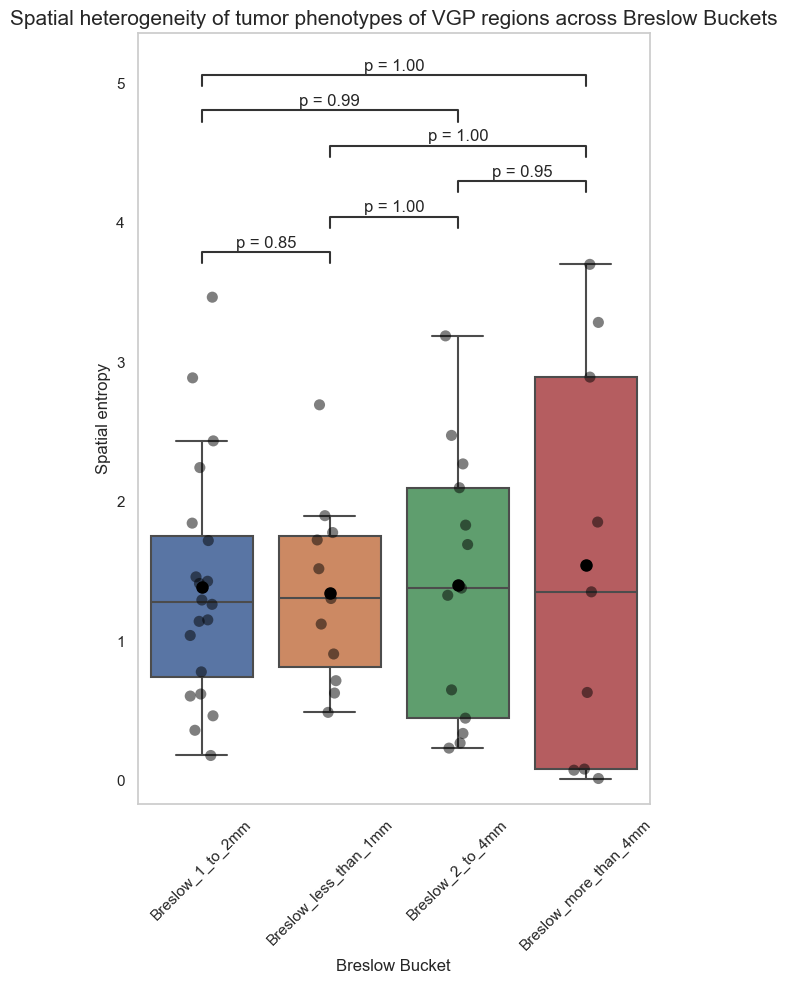

In [27]:
df_breslow = heterogeneity_per_sample_with_p_values_across_Breslow_buckets(adata, node_attribute_name='phenotype_tum')

In [34]:
df_breslow[df_breslow['Breslow_bucket'] == 'Breslow_1_to_2mm'].sort_values(by='spatial_entropy')
# df_breslow.sort_values(by='spatial_entropy')

,imageid_raw,image_id,local_stage_region,spatial_entropy,MEL_id,Breslow_bucket
1,LSP11349,LSP11349,VGP_2,0.182619,MEL18,Breslow_1_to_2mm
0,LSP11314,LSP11314,VGP_1,0.363356,MEL14,Breslow_1_to_2mm
18,LSP11778,LSP11778_lower,VGP_1,0.467051,MEL68,Breslow_1_to_2mm
31,LSP11698,LSP11698_upper,VGP_1,0.611382,MEL59,Breslow_1_to_2mm
5,LSP11354,LSP11354_upper,VGP_4,0.623183,MEL19,Breslow_1_to_2mm
2,LSP11349,LSP11349,VGP_1,0.781931,MEL18,Breslow_1_to_2mm
25,LSP11642,LSP11642,VGP_1,1.088840,MEL54,Breslow_1_to_2mm
23,LSP11618,LSP11618_upper,VGP_4,1.169677,MEL51,Breslow_1_to_2mm
24,LSP11618,LSP11618_upper,VGP_3,1.222371,MEL51,Breslow_1_to_2mm
33,LSP11418,LSP11418,VGP_1,1.305892,MEL27,Breslow_1_to_2mm


In [46]:
df_breslow[df_breslow['MEL_id'] == 'MEL19']

,imageid_raw,image_id,local_stage_region,spatial_entropy,MEL_id,Breslow_bucket
3,LSP11354,LSP11354_lower,VGP_2,1.848124,MEL19,Breslow_1_to_2mm
4,LSP11354,LSP11354_lower,VGP_3,2.889455,MEL19,Breslow_1_to_2mm
5,LSP11354,LSP11354_upper,VGP_4,0.623183,MEL19,Breslow_1_to_2mm
6,LSP11354,LSP11354_upper,VGP_1,2.251481,MEL19,Breslow_1_to_2mm


In [ ]:
# MEL19 VGP_3 (LSP11354_lower) and VGP_4 (LSP11354_upper) # sample sample, different section
# MEL59 VGP_1 (LSP11698_upper) and VGP_3 (LSP11698_upper) # sample sample, same section

#### Scratch Below

In [28]:
breslow_list = []
for sample_name, roi_values_dict in H_spatial_dict.items():
    for roi_name, roi_value in roi_values_dict.items():
        if ('LSP15219_a_right' in sample_name) or ('LSP15219_a_left' in sample_name):
            sample_short_name = 'LSP15219_a'
        elif ('LSP15219_b_upper' in sample_name) or ('LSP15219_b_lower' in sample_name):
            sample_short_name = 'LSP15219_b'
        else:
            sample_short_name = sample_name.split('_')[0]
        breslow_list.append( {'imageid_raw': sample_short_name, 'image_id': sample_name, 'local_stage_region': roi_name, 'spatial_entropy': roi_value} )
df_breslow = pd.DataFrame.from_dict(breslow_list)

In [29]:
df = adata.obs[['imageid_raw', 'MEL_id']]
df_compressed = pd.DataFrame(list(df.groupby('MEL_id')['imageid_raw'].value_counts().to_dict().keys()), columns=['MEL_id', 'imageid_raw'])

In [30]:
df_breslow = pd.merge(df_breslow, df_compressed, on='imageid_raw', how='left')

In [34]:
Breslow_less_than_1mm = ['MEL15','MEL16','MEL17','MEL21','MEL26','MEL30','MEL36','MEL38','MEL40','MEL41','MEL42','MEL43','MEL44','MEL49','MEL50','MEL52','MEL53','MEL56','MEL60','MEL61','MEL62','MEL63','MEL66','MEL67']
Breslow_1_to_2mm=['MEL14','MEL18','MEL19','MEL22','MEL23','MEL24','MEL25','MEL27','MEL45','MEL47','MEL48','MEL51','MEL54','MEL59','MEL64','MEL65','MEL68','MEL69']
Breslow_2_to_4mm=['MEL20','MEL55','MEL58', 'MEL76','MEL84','MEL73','MEL78','MEL85','MEL81','MEL86']
Breslow_more_than_4mm = ['MEL72','MEL70','MEL82','MEL71','MEL74','MEL83','MEL75']

def apply_status(image_id):
    if image_id in Breslow_less_than_1mm:
        return 'Breslow_less_than_1mm'
    elif image_id in Breslow_1_to_2mm:
        return 'Breslow_1_to_2mm'
    elif image_id in Breslow_2_to_4mm:
        return 'Breslow_2_to_4mm'
    elif image_id in Breslow_more_than_4mm:
        return 'Breslow_more_than_4mm'
    else:
        return 'MIS'        
## Define morphology groups
morphology_groups = ['MIS', 'Breslow_less_than_1mm', 'Breslow_1_to_2mm', 'Breslow_2_to_4mm', 'Breslow_more_than_4mm']
 # Add the recurrence_status column
df_breslow['Breslow_bucket'] = df_breslow['MEL_id'].apply(apply_status)

<Axes: xlabel='Breslow_bucket', ylabel='spatial_entropy'>

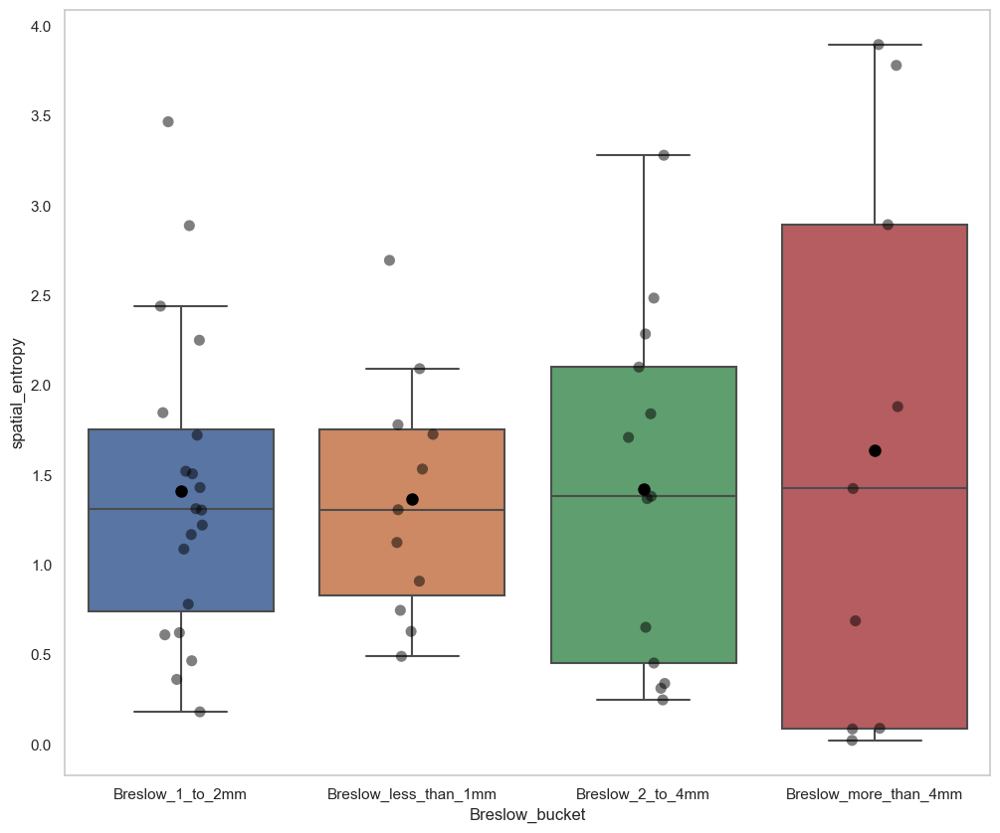

In [36]:
plotting_params = {
                        'data': df_breslow,
                        'x': 'Breslow_bucket',
                        'y': 'spatial_entropy',
                        'showfliers': False,
                        'whis': 1,
                        'showmeans': True,
                        'meanprops': {'marker':'o',
                                    'markerfacecolor':'black', 
                                    'markeredgecolor':'black',
                                    'markersize':'8'}
                }

# Plot
fig, ax = plt.subplots(figsize=(12,10))
ax = sns.boxplot(**plotting_params)
sns.stripplot(data=df_breslow, x='Breslow_bucket', y='spatial_entropy', color="black", size=8, alpha=0.5, ax=ax)

#### Individual plots below - scratch

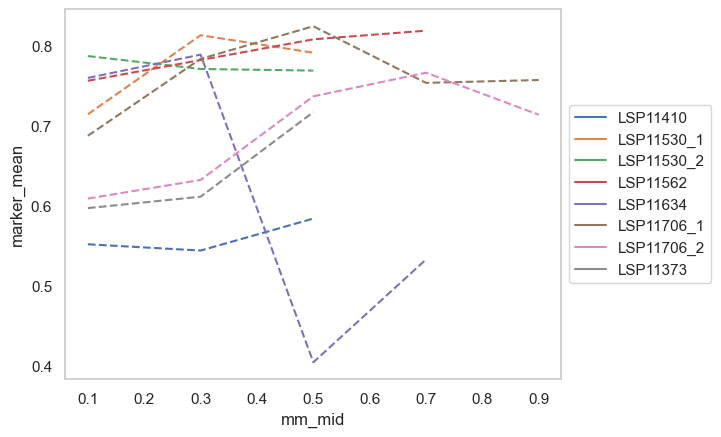

In [324]:
sns.lineplot(data=df_breslow[df_breslow['Breslow_bucket'] == 'Breslow_less_than_1mm'], x='mm_mid', y='marker_mean', hue='patient', linestyle='--')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

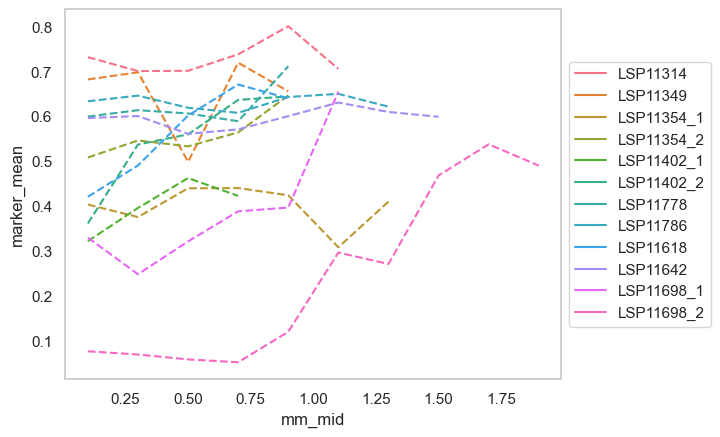

In [319]:
sns.lineplot(data=df_breslow[df_breslow['Breslow_bucket'] == 'Breslow_1_to_2mm'], x='mm_mid', y='marker_mean', hue='patient', linestyle='--')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

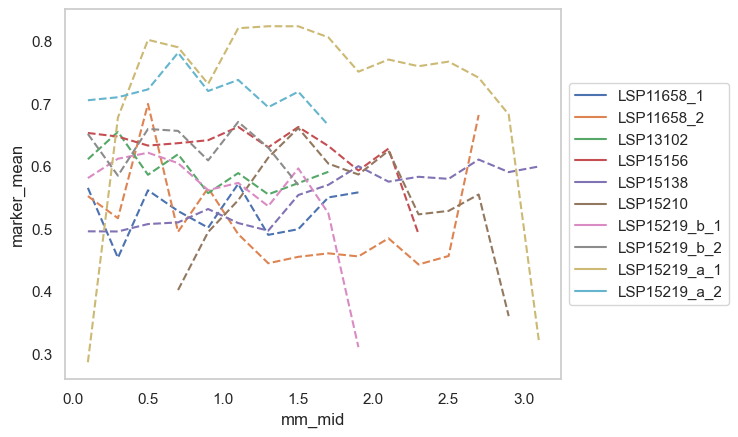

In [320]:
sns.lineplot(data=df_breslow[df_breslow['Breslow_bucket'] == 'Breslow_2_to_4mm'], x='mm_mid', y='marker_mean', hue='patient', linestyle='--')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

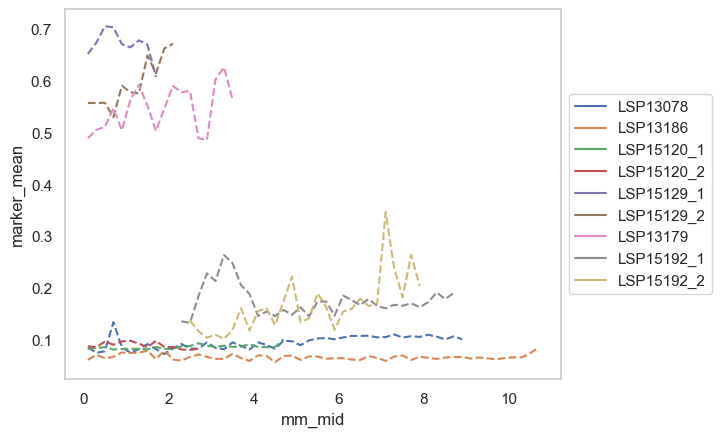

In [321]:
sns.lineplot(data=df_breslow[df_breslow['Breslow_bucket'] == 'Breslow_more_than_4mm'], x='mm_mid', y='marker_mean', hue='patient', linestyle='--')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))

<Axes: xlabel='mm_mid', ylabel='marker_mean'>

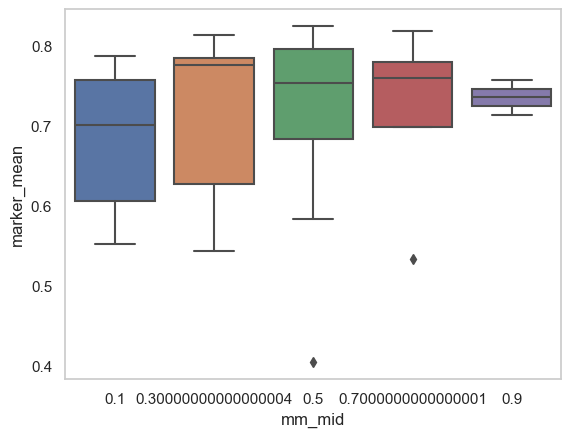

In [327]:
sns.boxplot(data=df_breslow[df_breslow['Breslow_bucket'] == 'Breslow_less_than_1mm'], x='mm_mid', y='marker_mean')

<Axes: xlabel='mm_mid', ylabel='marker_mean'>

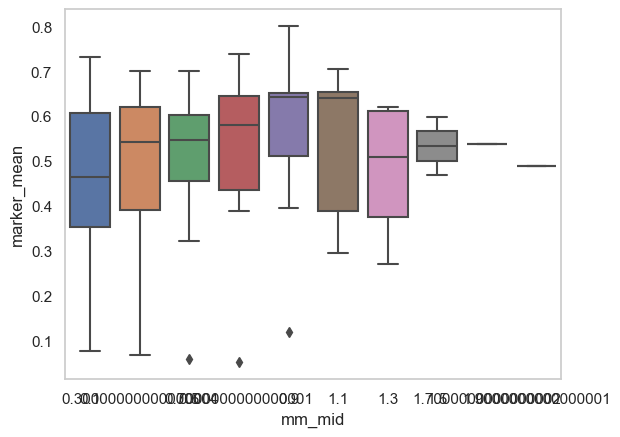

In [328]:
sns.boxplot(data=df_breslow[df_breslow['Breslow_bucket'] == 'Breslow_1_to_2mm'], x='mm_mid', y='marker_mean')

<Axes: xlabel='mm_mid', ylabel='marker_mean'>

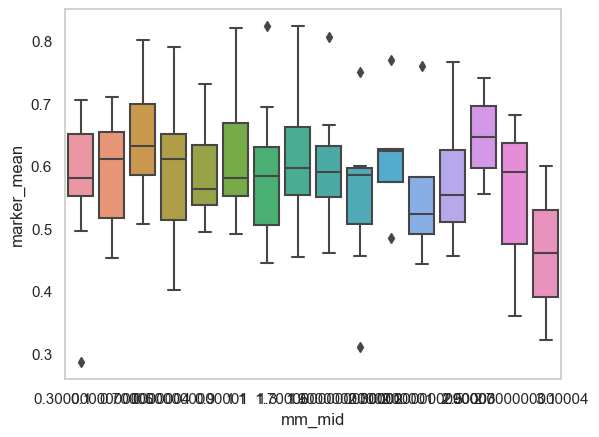

In [329]:
sns.boxplot(data=df_breslow[df_breslow['Breslow_bucket'] == 'Breslow_2_to_4mm'], x='mm_mid', y='marker_mean')

<Axes: xlabel='mm_mid', ylabel='marker_mean'>

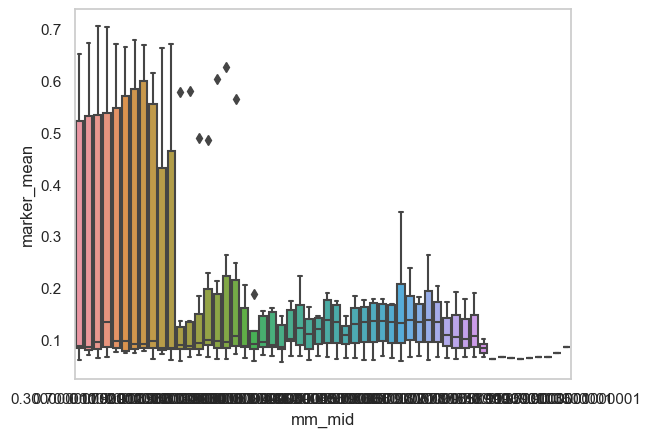

In [330]:
sns.boxplot(data=df_breslow[df_breslow['Breslow_bucket'] == 'Breslow_more_than_4mm'], x='mm_mid', y='marker_mean')

### Scratch

In [60]:
regression_dict

{'LSP11314':            band  marker_mean  band_mid  mm_mid
 0      [0, 615)     0.674096     307.5    0.05
 1   [615, 1230)     0.688677     922.5    0.15
 2  [1230, 1845)     0.688710    1537.5    0.25
 3  [1845, 2460)     0.772733    2152.5    0.35
 4  [2460, 3075)     0.742474    2767.5    0.45
 5  [3075, 3690)     0.834969    3382.5    0.55,
 'LSP11330':            band  marker_mean  band_mid  mm_mid
 0      [0, 615)     0.719428     307.5    0.05
 1   [615, 1230)     0.694001     922.5    0.15
 2  [1230, 1845)     0.764831    1537.5    0.25
 3  [1845, 2460)     0.734915    2152.5    0.35
 4  [2460, 3075)     0.797057    2767.5    0.45
 5  [3075, 3690)     0.738809    3382.5    0.55
 6  [3690, 4305)     0.775097    3997.5    0.65
 7  [4305, 4920)     0.735727    4612.5    0.75
 8  [4920, 5535)     0.788480    5227.5    0.85,
 'LSP11349':            band  marker_mean  band_mid  mm_mid
 0      [0, 615)     0.632776     307.5    0.05
 1   [615, 1230)     0.691169     922.5    0.15
 2

In [61]:
df = pd.concat([df.assign(patient=f'{patient}') for patient, df in regression_dict.items()])

In [62]:
df

,band,marker_mean,band_mid,mm_mid,patient
0,"[0, 615)",0.674096,307.5,0.05,LSP11314
1,"[615, 1230)",0.688677,922.5,0.15,LSP11314
2,"[1230, 1845)",0.688710,1537.5,0.25,LSP11314
3,"[1845, 2460)",0.772733,2152.5,0.35,LSP11314
4,"[2460, 3075)",0.742474,2767.5,0.45,LSP11314
...,...,...,...,...,...
37,"[22755, 23370)",0.192497,23062.5,3.75,LSP15192
38,"[23370, 23985)",0.184879,23677.5,3.85,LSP15192
39,"[23985, 24600)",0.225772,24292.5,3.95,LSP15192
40,"[24600, 25215)",0.313983,24907.5,4.05,LSP15192


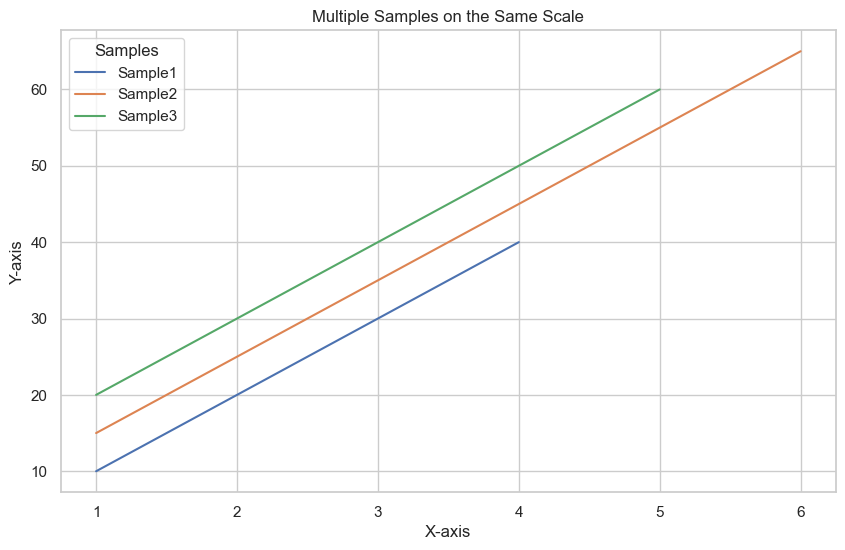

In [63]:
# Sample data creation
# Create a dictionary of data for each sample with x and y values
data = {
    'Sample1': {'x': [1, 2, 3, 4], 'y': [10, 20, 30, 40]},
    'Sample2': {'x': [1, 2, 3, 4, 5, 6], 'y': [15, 25, 35, 45, 55, 65]},
    'Sample3': {'x': [1, 2, 3, 4, 5], 'y': [20, 30, 40, 50, 60]}
}

# Initialize a plot
plt.figure(figsize=(10, 6))

# Iterate through each sample and plot its x and y data
for sample, values in data.items():
    df = pd.DataFrame(values)  # Convert the dictionary to a DataFrame
    plt.plot(df['x'], df['y'], label=sample)  # Plot the data

# Customize the plot
plt.title('Multiple Samples on the Same Scale')
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(title='Samples')
plt.grid(True)

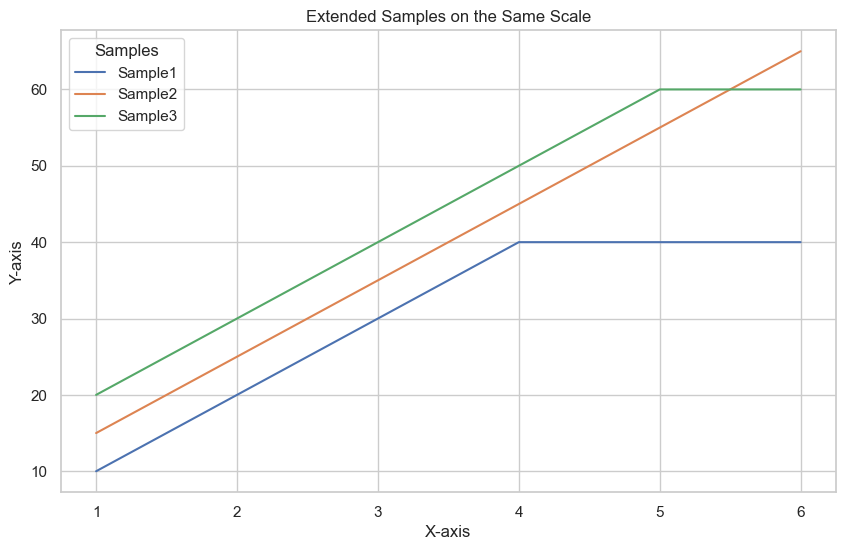

In [64]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Original sample data
data = {
    'Sample1': {'x': [1, 2, 3, 4], 'y': [10, 20, 30, 40]},
    'Sample2': {'x': [1, 2, 3, 4, 5, 6], 'y': [15, 25, 35, 45, 55, 65]},
    'Sample3': {'x': [1, 2, 3, 4, 5], 'y': [20, 30, 40, 50, 60]}
}

# Get the x-values from Sample2 (assuming Sample2 has the full range)
x_new = data['Sample2']['x']

# Function to extend and interpolate y-values to match Sample2's x-axis
def extend_sample(sample_x, sample_y, x_new):
    df = pd.DataFrame({'x': sample_x, 'y': sample_y})
    df_extended = df.set_index('x').reindex(x_new).interpolate(method='linear', limit_direction='both').reset_index()
    return df_extended['y'].tolist()

# Extend Sample1 and Sample3
data['Sample1']['y'] = extend_sample(data['Sample1']['x'], data['Sample1']['y'], x_new)
data['Sample3']['y'] = extend_sample(data['Sample3']['x'], data['Sample3']['y'], x_new)

# Replace the x values of Sample1 and Sample3 with the new x values from Sample2
data['Sample1']['x'] = x_new
data['Sample3']['x'] = x_new

# Initialize a plot
plt.figure(figsize=(10, 6))

# Iterate through each sample and plot its x and y data
for sample, values in data.items():
    df = pd.DataFrame(values)  # Convert the dictionary to a DataFrame
    plt.plot(df['x'], df['y'], label=sample)  # Plot the data

# Customize the plot
plt.title('Extended Samples on the Same Scale')
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(title='Samples')
plt.grid(True)

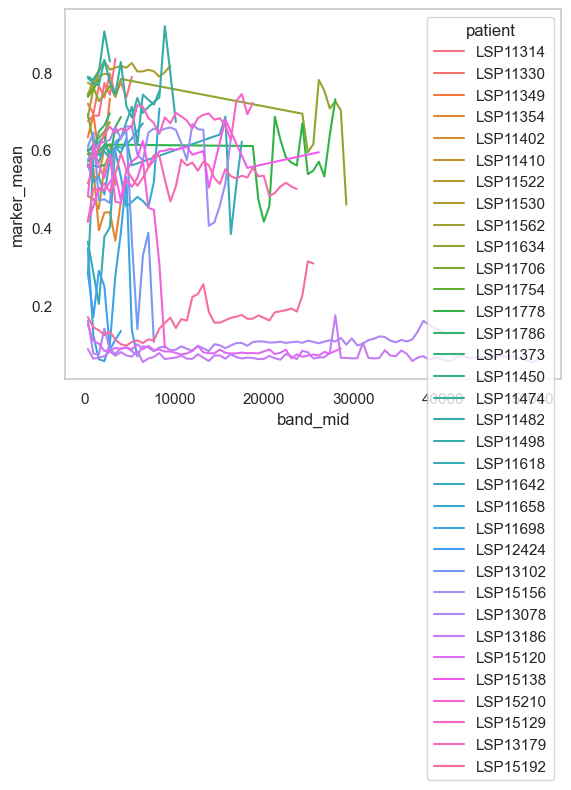

In [52]:
ax = sns.lineplot(data=df, x='band_mid', y='marker_mean', hue='patient')

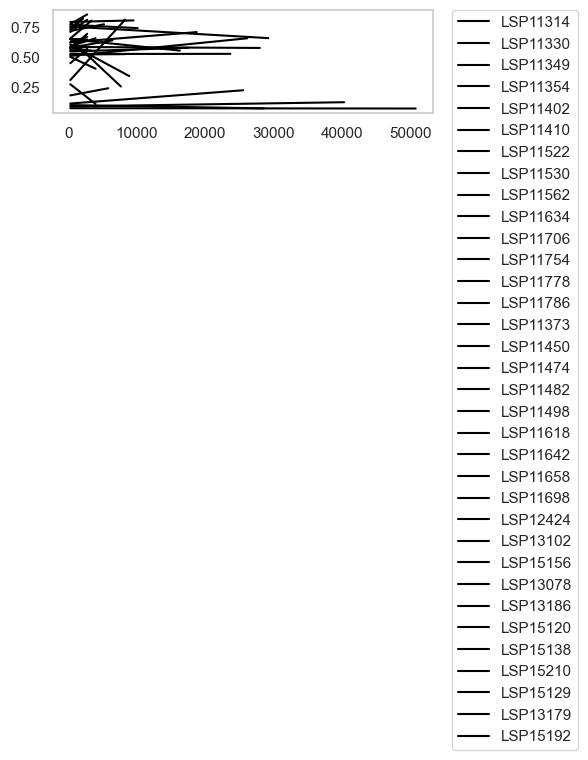

In [39]:
fig, ax = plt.subplots(figsize=(6,5))
for patient_name, values in regression_dict.items():
    sns.lineplot(x=values[3], y=values[4], color='black', ax=ax, label=patient_name)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
fig.tight_layout()